In [ ]:
import astropy
from astropy.io import fits
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import chisquare
import math
!pip install astroquery
!pip install gaiaxpy
from astropy.coordinates import Angle
from astroquery.vizier import Vizier
from astropy.coordinates import SkyCoord
from astroquery.gaia import GaiaClass
import astropy.units as u
import astropy.coordinates as coord
from gaiaxpy import calibrate
from ast import literal_eval

## Define Functions:

*   create_median_template ( )
*   chi_square_error_2 ( )
*   rebin_spec ( )
*   load_SDSS_star ( )
*   load_template ( )
*   calculate_chi_square ( )



In [ ]:
def create_median_template(dfs):
    """
    Create a median template from a list of dataframes representing spectral data.

    Parameters:
    - dfs (list of DataFrame): A list of dataframes containing spectral data.

    Returns:
    - DataFrame: A template dataframe with columns 'wavelength', 'flux', and 'flux_error'.
    """
    # Assuming all dataframes have the same wavelength values
    template_df = pd.DataFrame()
    template_df['wavelength'] = dfs[0]['wavelength']

    # Initialize total_weights and total_weighted_flux to zero
    template_df['total_weights'] = 0
    template_df['total_weighted_flux'] = 0

    # Loop through each dataframe to accumulate weights and weighted fluxes
    for df in dfs:
        # Calculate weights and weighted flux for the current dataframe
        weight = 1 / (df['flux_error'] ** 2)
        weighted_flux = df['flux'] * weight

        # Accumulate the weights and weighted fluxes
        template_df['total_weights'] += weight
        template_df['total_weighted_flux'] += weighted_flux

    # Compute the median template values
    template_df['flux'] = template_df['total_weighted_flux'] / template_df['total_weights']
    template_df['flux_error'] = 1 / np.sqrt(template_df['total_weights'])

    # Clean up intermediate columns
    template_df = template_df.drop(columns=['total_weights', 'total_weighted_flux'])

    return template_df

In [ ]:
def chi_square_error_2(list1, list2, sigma2):

    arr1 = np.array(list1)
    arr2 = np.array(list2)
    sigma2 = np.array(sigma2)

    mask = (arr2 > 0)  # Create a boolean mask
    arr1_filtered = arr1[mask]
    arr2_filtered = arr2[mask]
    sigma2_filtered = sigma2[mask]

    chi_square = np.sum((arr1_filtered - arr2_filtered) ** 2 / sigma2_filtered)
    reduced_chi_square = chi_square / (len(arr1_filtered) - 1)

    return reduced_chi_square

In [ ]:
!pip install pysynphot
import pysynphot as pysyn

def rebin_spec(wave, specin, wavnew): # new resample flux (from Chris)
    spec = pysyn.spectrum.ArraySourceSpectrum(wave=wave, flux=specin)
    f    = np.ones(len(wave))
    filt = pysyn.spectrum.ArraySpectralElement(wave, f, waveunits='angstrom')
    obs  = pysyn.observation.Observation(spec, filt, binset=wavnew, force='taper')
    return obs.binflux

In [ ]:
def load_SDSS_star(spectrum_file):
    try:
        with fits.open(spectrum_file) as hdulist:
            table_data = hdulist[1].data
            data = {name: np.array(table_data[name]).byteswap().newbyteorder() for name in table_data.names}
        SDSS_star = pd.DataFrame(data)
        SDSS_star['loglam'] = 10 ** SDSS_star['loglam']
        SDSS_star.rename(columns={'loglam': 'wavelength'}, inplace=True)
        return SDSS_star
    except OSError:
        print(f"Error loading file: {spectrum_file}")
        return None

def load_template(template_file):
    with fits.open(template_file) as hdulist:
        table_data = hdulist[1].data
        data = {name: np.array(table_data[name]).byteswap().newbyteorder() for name in table_data.names}
    pyhammer_template = pd.DataFrame(data)
    pyhammer_template.rename(columns={'LogLam': 'wavelength', 'Flux': 'flux'}, inplace=True)
    pyhammer_template['wavelength'] = 10 ** pyhammer_template['wavelength']
    return pyhammer_template

In [ ]:
def new_load_SDSS_star(spectrum_file):
    try:

        with fits.open(spectrum_file) as hdulist:
            table_data = hdulist[1].data
            data = {name: np.array(table_data[name]).byteswap().newbyteorder() for name in table_data.names}
        SDSS_star = pd.DataFrame(data)

        SDSS_star.rename(columns={'FLUX': 'flux'}, inplace=True)
        SDSS_star.rename(columns={'LOGLAM': 'wavelength'}, inplace=True)
        SDSS_star.wavelength = 10 ** SDSS_star.wavelength # from log space to regular space
        SDSS_star.rename(columns={'IVAR': 'ivar'}, inplace=True)
        # SDSS_star['loglam'] = 10 ** SDSS_star['loglam']
        # SDSS_star.rename(columns={'loglam': 'wavelength'}, inplace=True)
        return SDSS_star

    except OSError:
        print(f"Error loading file: {spectrum_file}")
        return None

In [ ]:
def calculate_chi_square(SDSS_star, A0_pyhammer):

    A0_pyhammer = A0_pyhammer.dropna(subset=['flux', 'Std'])

    min_wavelength = A0_pyhammer['wavelength'].min()
    max_wavelength = A0_pyhammer['wavelength'].max()

    SDSS_star = SDSS_star[(SDSS_star['wavelength'] >= min_wavelength) & (SDSS_star['wavelength'] <= max_wavelength)]

    # Resample Flux
    A0_new_flux = rebin_spec(A0_pyhammer['wavelength'].values, A0_pyhammer['flux'].values, SDSS_star['wavelength'].values)
    A0_new_Std = rebin_spec(A0_pyhammer['wavelength'].values, A0_pyhammer['Std'].values, SDSS_star['wavelength'].values)
    data = {'wavelength': SDSS_star['wavelength'].values, 'flux': A0_new_flux, 'Std': A0_new_Std}
    A0_template_resampled = pd.DataFrame(data)

    # normalize
    SDSS_star_filtered = SDSS_star[(SDSS_star['wavelength'] >= 7480) & (SDSS_star['wavelength'] <= 7520)]
    A0_template_resampled_filtered = A0_template_resampled[(A0_template_resampled['wavelength'] >= 7480) & (A0_template_resampled['wavelength'] <= 7520)]
    median1_SDSS = SDSS_star_filtered['flux'].median()
    median2_template = A0_template_resampled_filtered['flux'].median()

    wavelength = SDSS_star['wavelength'].values
    SDSS_flux = SDSS_star['flux'].tolist()

    SDSS_flux = SDSS_flux / median1_SDSS
    A0_flux_shifted = A0_new_flux / median2_template  # normalized the variance

    # Compute variances
    A0_var = np.array(A0_new_Std) ** 2 / median2_template
    SDSS_var = [1 / value if value != 0 else math.nan for value in SDSS_star['ivar'].tolist()]
    SDSS_var = np.array(SDSS_var) / median1_SDSS
    A0_SDSS_var = A0_var + SDSS_var

    # drop the nan value
    SDSS_flux, A0_flux_shifted, A0_SDSS_var, wavelength = zip(*[
        (value1, value2, value3, value4)
        for value1, value2, value3, value4 in zip(SDSS_flux, A0_flux_shifted, A0_SDSS_var, wavelength)
        if not any(math.isnan(value) for value in (value1, value2, value3, value4))
        ])

    chi_square = chi_square_error_2(SDSS_flux, A0_flux_shifted, A0_SDSS_var) # deleted A0_SDSS_var

    return chi_square

In [ ]:
def new_calculate_chi_square(SDSS_star, A0_pyhammer):
    A0_pyhammer = A0_pyhammer.dropna(subset=['flux', 'Std'])

    min_wavelength, max_wavelength = A0_pyhammer['wavelength'].min(), A0_pyhammer['wavelength'].max()
    SDSS_star = SDSS_star[(SDSS_star['wavelength'] >= min_wavelength) & (SDSS_star['wavelength'] <= max_wavelength)].dropna()

    SDSS_wavelength = SDSS_star['wavelength'].values
    A0_new_flux = rebin_spec(A0_pyhammer['wavelength'].values, A0_pyhammer['flux'].values, SDSS_wavelength)
    A0_new_Std = rebin_spec(A0_pyhammer['wavelength'].values, A0_pyhammer['Std'].values, SDSS_wavelength)

    SDSS_star_filtered = SDSS_star[(SDSS_wavelength >= 7480) & (SDSS_wavelength <= 7520)]
    A0_template_resampled_filtered = pd.DataFrame({'wavelength': SDSS_wavelength, 'flux': A0_new_flux, 'Std': A0_new_Std})
    A0_template_resampled_filtered = A0_template_resampled_filtered[(A0_template_resampled_filtered['wavelength'] >= 7480) & (A0_template_resampled_filtered['wavelength'] <= 7520)]

    median1_SDSS, median2_template = SDSS_star_filtered['flux'].median(), A0_template_resampled_filtered['flux'].median()

    SDSS_flux = SDSS_star['flux'].values / median1_SDSS
    A0_flux_shifted = A0_new_flux / median2_template

    A0_var = np.square(A0_new_Std) / median2_template
    SDSS_var = 1 / SDSS_star['ivar'].replace(0, np.nan).values
    SDSS_var /= median1_SDSS
    A0_SDSS_var = A0_var + SDSS_var

    not_nan_mask = ~np.isnan(np.sum([SDSS_flux, A0_flux_shifted, A0_SDSS_var], axis=0))

    chi_square = chi_square_error_2(SDSS_flux[not_nan_mask], A0_flux_shifted[not_nan_mask], A0_SDSS_var[not_nan_mask])

    return chi_square


In [ ]:
csv_file_path = "/content/drive/MyDrive/AstroResearch/new_data_table/Optical_spectral_types_DR17_v3_ctheissen.csv"
df = pd.read_csv(csv_file_path)
original_df = df.drop_duplicates(subset='bestObjID', keep='first').reset_index(drop=True)
original_df

,mjd,plate,fiberID,bestObjID,ra,dec,class,subclass,instrument,rChi2,...,psfMagErr_u,psfMagErr_g,psfMagErr_r,psfMagErr_i,psfMagErr_z,extinction_u,extinction_g,extinction_r,extinction_i,extinction_z
0,56727,7456,532,1237648674511454293,196.713400,0.298453,STAR,A4V (97603),BOSS,1.881113,...,0.012358,0.011815,0.016474,0.024657,0.029614,0.071528,0.055734,0.038557,0.028652,0.021312
1,56727,7456,501,1237648674511454356,196.624950,0.282299,STAR,K3V (32147),BOSS,1.101248,...,0.070880,0.014013,0.016380,0.014305,0.023413,0.080341,0.062601,0.043307,0.032182,0.023937
2,56727,7456,531,1237648674511585290,196.900460,0.240210,STAR,G0 (63791),BOSS,1.112199,...,0.023038,0.014827,0.012288,0.014434,0.023888,0.083197,0.064826,0.044847,0.033326,0.024788
3,56727,7456,563,1237648674511585391,196.968910,0.349134,STAR,K3V (32147),BOSS,1.346109,...,0.039587,0.015189,0.012435,0.014620,0.024842,0.066900,0.052128,0.036062,0.026798,0.019933
4,56727,7456,571,1237648674511650951,197.030410,0.239345,STAR,K5Ve (118100),BOSS,3.276671,...,0.027482,0.015707,0.012603,0.013149,0.022902,0.073882,0.057568,0.039826,0.029595,0.022013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
117961,57364,7715,622,1237680311769301325,8.753181,33.065267,STAR,G8V (101501),BOSS,1.072950,...,0.052898,0.016856,0.011773,0.013551,0.023144,0.338356,0.263645,0.182388,0.135534,0.100812
117962,56561,6293,346,1237680331096981717,343.825470,27.206893,STAR,F3/F5V (30743),BOSS,2.364043,...,0.018976,0.016089,0.011750,0.013114,0.026265,0.247947,0.193198,0.133654,0.099319,0.073875
117963,56566,6292,496,1237680331634376734,344.995420,27.781598,STAR,F3/F5V (30743),BOSS,1.104141,...,0.022101,0.014612,0.017602,0.028957,0.018391,0.254428,0.198248,0.137147,0.101915,0.075806
117964,57362,7718,44,1237680331644993617,12.683085,29.070565,STAR,F0IV (81937),BOSS,1.077174,...,0.018712,0.016770,0.013694,0.024185,0.021729,0.244040,0.190154,0.131548,0.097754,0.072711


## Query gaia's ID and mag:

In [ ]:
result_compare_NonBinary_Stars_CrossMatched = pd.read_csv("/content/drive/MyDrive/AstroResearch/new_data_table/result_compare_CrossMatched_final.csv")
result_compare_NonBinary_Stars_CrossMatched

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511454356,196.624950,0.282299,K3V (32147),K2_+0.0_Dwarf,0.178762,3690722331539752192,18.251686,18.81738,17.570684,7.390470314893085
2,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
3,1237648674511585391,196.968910,0.349134,K3V (32147),K2_-1.0_Dwarf,0.086616,3690715150354025728,17.733078,18.200039,17.069653,6.4879329221865945
4,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
...,...,...,...,...,...,...,...,...,...,...,...
110286,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424
110287,1237680479270797727,10.312414,33.171030,M5III (221615),M4_+0.0_Dwarf,0.111392,361683181726376448,18.761353,20.059868,17.592068,8.44115534494583
110288,1237680479808062003,11.498197,33.439076,M3III (44478),M3_+0.0_Dwarf,0.136130,362031864351985024,19.595724,20.685791,18.463917,9.104377458646093
110289,1237680511482986978,10.149730,33.697313,G1V (95128),G9_-1.0_Dwarf,0.194256,361903015332657536,19.91739,19.716562,18.767694,NaN


In [ ]:
long_list = result_compare_NonBinary_Stars_CrossMatched['Gaia_ID'].tolist()
subset_list = long_list[8000:9000]
subset_list # haven't query anything after 8000.

In [ ]:
def save_file(id):
    query_input = f"select * from gaiadr3.gaia_source where source_id = {id}"

    try:
        # Only save file when id has corresponding flux/error and wavelength
        calibrated_spectra, sampling = calibrate(query_input)
        sampling_table = pd.DataFrame(sampling)
        sampling_table['flux'] = calibrated_spectra["flux"][0]
        sampling_table['flux_error'] = calibrated_spectra["flux_error"][0]
        sampling_table.columns = ['wavelength', 'flux', 'flux_error']
        file_name = f"{calibrated_spectra['source_id'][0]}.csv"
        path = "drive/MyDrive/AstroResearch/new_data_table/SDSS_gaia_files_8_9_from_8000/"
        sampling_table.to_csv(path + file_name, index=None)

    except:
        error_path = "drive/MyDrive/AstroResearch/new_data_table/errors_starting_from_8000.txt"
        with open(error_path, 'a') as file:
            file.write(f"No wavelength or flux from source for {id}\n")

# Sample list of IDs
id_list = subset_list # Add your IDs here

# Apply the save_file function to each ID in the list
current_ID = 0
for id in id_list:
    current_ID = id
    save_file(id)

## Find New Label

In [ ]:
# filter out binary stars
chi_square_df = pd.read_csv('/content/drive/MyDrive/AstroResearch/new_data_table/chi_square_df_All_final.csv')
with open('/content/drive/MyDrive/AstroResearch/new_data_table/templates_names.txt', 'r') as file:
    nonBinary_star_names = file.readlines()
nonBinary_star_names = [s.strip() for s in nonBinary_star_names]
nonBinary_star_names.append('Star_ID')

# filter out the binary stars' templates
chi_square_df = chi_square_df[nonBinary_star_names]

# filter out L3 dwarfs
columns_to_drop = ['L0','L1', 'L2','L3', 'L6']
chi_square_df = chi_square_df.drop(columns=columns_to_drop)
chi_square_df

,A0,A1,A2,A3_+0.0_Dwarf,A3_+0.5_Dwarf,A3_-0.5_Dwarf,A3_-1.0_Dwarf,A4_-1.0_Dwarf,A6_+0.0_Dwarf,A6_+0.5_Dwarf,...,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9,Star_ID
0,2.391024,3.744891,5.196113,1.804961,2.756053,2.353616,0.667835,2.234717,0.647360,1.205326,...,50.366942,52.615701,33.627864,21.528537,11.310041,3.870518,0.819745,0.139705,0.142904,1237661138490949678
1,26.818747,56.404274,147.978772,32.632839,122.876049,61.871661,8.969779,63.401829,30.786224,99.608940,...,481.218194,494.930383,383.991318,304.899153,223.908518,149.618218,103.231229,80.807196,66.489363,1237661383843250471
2,7.439884,14.764115,32.745235,7.399509,22.134302,12.766920,2.079694,12.913567,5.021675,14.657124,...,191.646641,199.211933,134.318431,91.700294,54.468738,27.051306,13.096557,7.021517,4.215967,1237661133662191634
3,25.177597,53.514101,144.512719,30.444671,119.216393,58.643542,8.275991,60.286041,28.348386,95.901945,...,478.471617,492.282789,381.151576,301.614619,219.964612,145.315241,98.915018,76.540616,62.343117,1237661126154650129
4,7.609563,14.866814,30.267828,7.750695,20.920760,13.015003,2.266533,13.097405,5.273173,13.976244,...,167.916081,174.329869,120.084291,83.980351,51.480720,26.197781,12.886728,7.154543,4.291901,1237661384380121097
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
110286,24.405686,50.876200,116.391250,30.091850,97.652255,55.066631,8.525659,55.737281,27.951507,79.322984,...,363.173622,373.098064,295.696871,239.346565,179.293015,120.788335,83.547216,65.930834,54.263652,1237680332701894125
110287,6.979497,13.881919,29.531035,6.958510,20.312286,12.144071,1.962269,12.231056,4.530603,13.026156,...,172.461423,179.079949,124.087739,87.193919,53.360039,25.894960,11.645569,5.909207,3.084162,1237680332702285912
110288,9.312927,18.636185,51.255204,9.179197,35.383510,16.955284,2.403245,17.358388,6.769599,24.375367,...,290.230373,302.163770,201.947312,136.611536,81.194929,41.663155,21.563251,12.261023,7.935058,1237680333238174081
110289,7.722236,14.767545,30.689518,7.593631,20.927170,12.698669,2.195850,12.659376,5.281912,14.129853,...,178.086801,185.394852,124.345730,84.468182,50.366966,25.364751,12.576918,6.901324,4.219631,1237680333239353552


## HR diagram (Continuous Spectrum Color)

In [ ]:
# Assuming 'a' is defined somewhere above this snippet
df_cleaned.rename(columns={'min_column': 'spectral_type'}, inplace = True)
df_cleaned['g_mag'] = pd.to_numeric(df_cleaned['g_mag'], errors='coerce')
df_cleaned['bp_mag'] = pd.to_numeric(df_cleaned['bp_mag'], errors='coerce')
df_cleaned['rp_mag'] = pd.to_numeric(df_cleaned['rp_mag'], errors='coerce')
df_cleaned['abs_g_mag'] = pd.to_numeric(df_cleaned['abs_g_mag'], errors='coerce')
df = df_cleaned

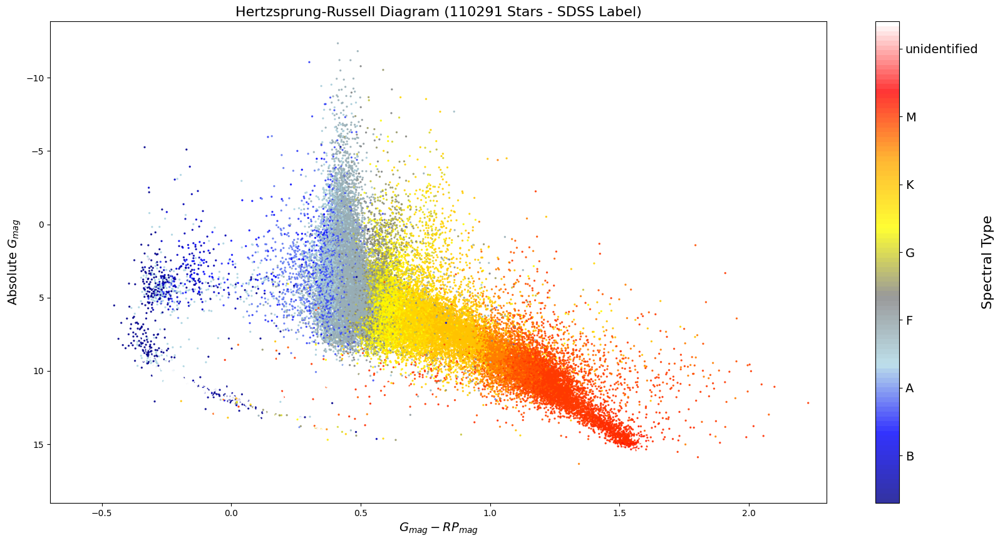

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Define colors and spectral types
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'white']
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M']

# Create a numeric spectral code for color-coding
def spectral_code(x):
    try:
        if x[0] in spectral_classes and x[1].isdigit():
            return spectral_classes.index(x[0]) + int(x[1]) * 0.1
        else:
            return 7.9  # Code for 'unidentified'
    except (ValueError, IndexError):
        return 7.9  # Code for 'unidentified' if conversion fails

df['spectral_code'] = df['subclass'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=2, alpha = 0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram (110291 Stars - SDSS Label)', fontsize=16)
plt.xlim(-0.7, 2.3)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(8)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=14)
# plt.savefig('HR_diagram_110291_Stars_SDSSLabel.pdf', format='pdf')
plt.show()

(99332, 13)


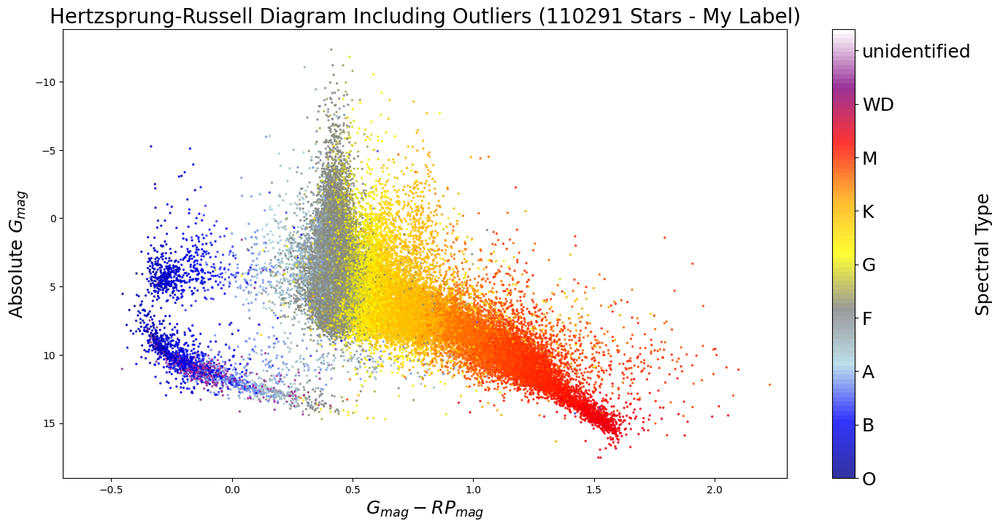

In [ ]:
df = df_cleaned
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(16, 8))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=18)
plt.ylabel('Absolute $G_{mag}$', fontsize=18)
plt.title('Hertzsprung-Russell Diagram Including Outliers (110291 Stars - My Label)', fontsize=20)
plt.xlim(-0.7, 2.3)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=18)
cbar.set_ticklabels(cbar_labels, fontsize=18)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()


(99332, 13)
excluded white dwarf corner shape:  (96590, 13)
Stars excluded (above the line):  (2742, 13)


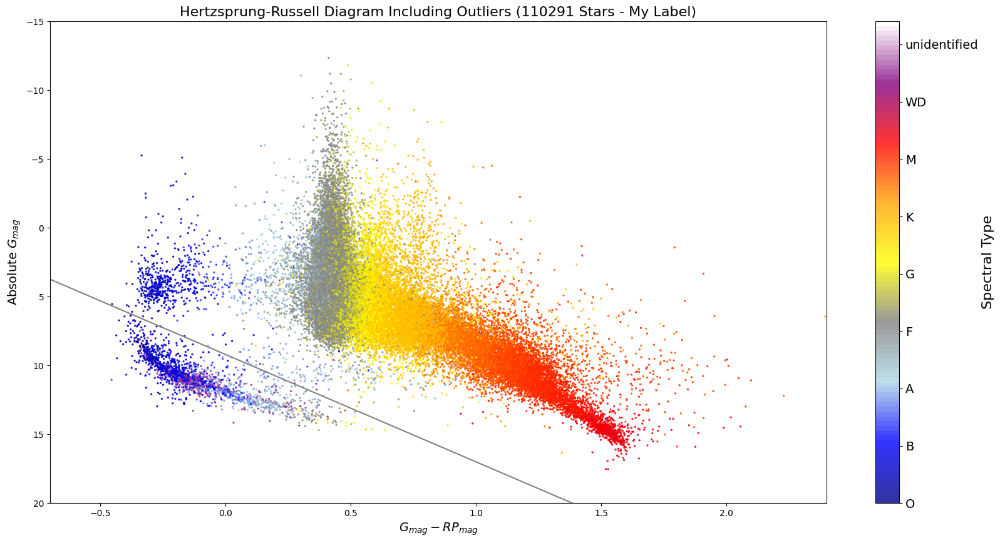

In [ ]:
df = df_cleaned
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)


m = 7.8  # Slope
b = 9.2   # Y-intercept

# Filter the DataFrame
def filter_below_line(row):
    x = row['g_mag'] - row['rp_mag']
    y = row['abs_g_mag']
    return y <= m * x + b
above_df = df[df.apply(filter_below_line, axis=1)]
print('excluded white dwarf corner shape: ', above_df.shape)


below_df = df[~df.apply(filter_below_line, axis=1)]  # The rows NOT satisfying the condition
print('Stars excluded (above the line): ', below_df.shape)


# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram Including Outliers (110291 Stars - My Label)', fontsize=16)
plt.xlim(-0.7, 2.4)
plt.ylim(-15, 20)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Plot the line
x_line = np.linspace(-0.7, 2.4, 100)
y_line = m * x_line + b
plt.plot(x_line, y_line, color='grey')


# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=14)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

print()

## only plot out specific spectral types:

<ipython-input-29-3224a7a02e1a>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['o_star_code'] = df['spectral_type'].apply(o_star_code)


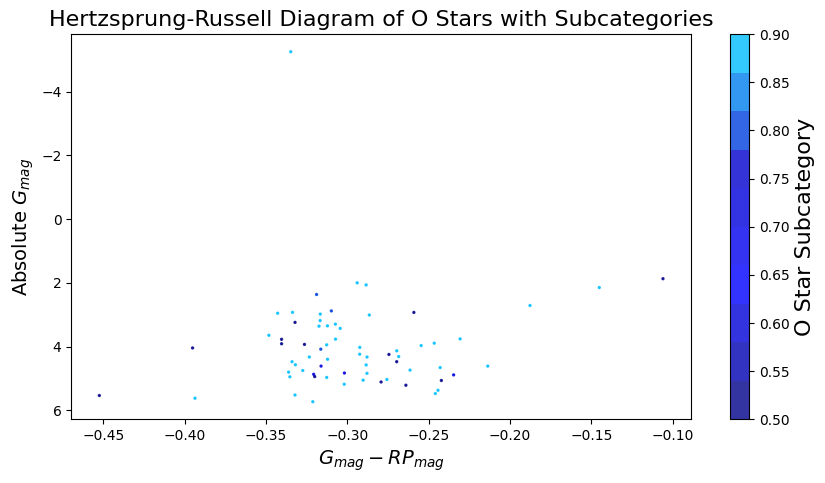

In [ ]:
above_df.rename(columns={'min_column': 'spectral_type'}, inplace=True)
above_df['g_mag'] = pd.to_numeric(above_df['g_mag'], errors='coerce')
above_df['bp_mag'] = pd.to_numeric(above_df['bp_mag'], errors='coerce')
above_df['rp_mag'] = pd.to_numeric(above_df['rp_mag'], errors='coerce')
above_df['abs_g_mag'] = pd.to_numeric(above_df['abs_g_mag'], errors='coerce')

# Filter the dataframe to only contain O stars
df = above_df[above_df['spectral_type'].str.startswith('O')]

# Function to get the color code based on O star subcategory
def o_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad O type

df['o_star_code'] = df['spectral_type'].apply(o_star_code)

# Define the colors (gradient within 'O' spectral type)
colors = ['darkblue', 'blue', 'mediumblue', 'deepskyblue']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("OSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['o_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of O Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for O subcategories
cbar = plt.colorbar()
cbar.set_label('O Star Subcategory', fontsize=16)

plt.show()


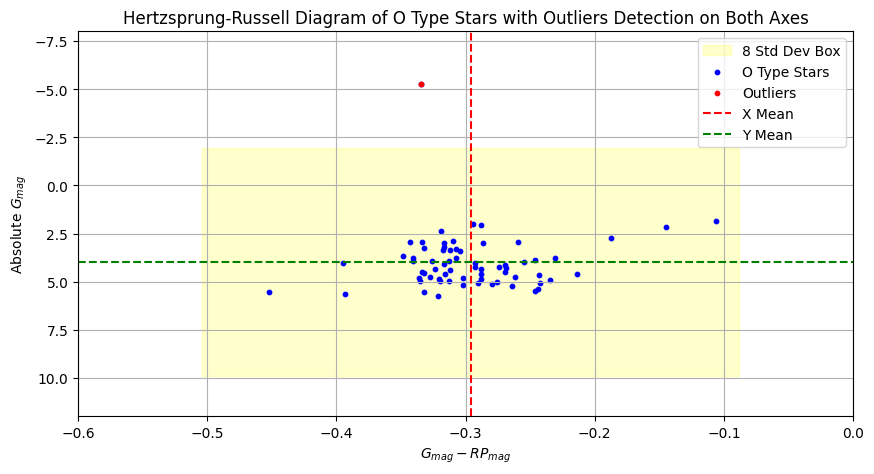

Mean of x-coordinates: -0.30
Standard deviation of x-coordinates: 0.05
X Threshold range: -0.50 to -0.09

Mean of y-coordinates: 3.98
Standard deviation of y-coordinates: 1.49
Y Threshold range: -1.96 to 9.92

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
64702,72094,1237657628982444101,150.85042,46.829343,O8/O9 (167771),O9,0.096055,822338490313075712,17.668385,17.513796,18.003183,-5.256748,0.9


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Filter the dataframe to only contain O stars
df = above_df[above_df['spectral_type'].str.startswith('O')]

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates
threshold_x = 4 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates
threshold_y = 4 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 2 standard deviations in both x and y directions
# Using facecolor='yellow' and alpha=0.2 to give it a transparent shade
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='8 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='blue', s=10, alpha=1, label='O Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=10, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of O Type Stars with Outliers Detection on Both Axes')
plt.xlim(-0.6, 0.0)
plt.ylim(-8, 12)
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-207-fc3bc02e6219>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['b_star_code'] = df['spectral_type'].apply(b_star_code)


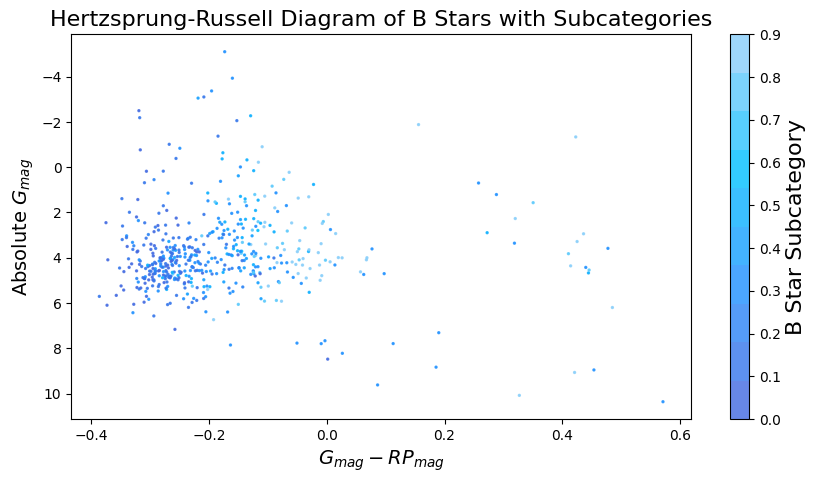

In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('B')]

# Function to get the color code based on B star subcategory
def b_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad B type

df['b_star_code'] = df['spectral_type'].apply(b_star_code)

# Define the colors (gradient within 'B' spectral type)
colors = ['royalblue', 'dodgerblue', 'deepskyblue', 'lightskyblue']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("BSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['b_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of B Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for B subcategories
cbar = plt.colorbar()
cbar.set_label('B Star Subcategory', fontsize=16)

plt.show()


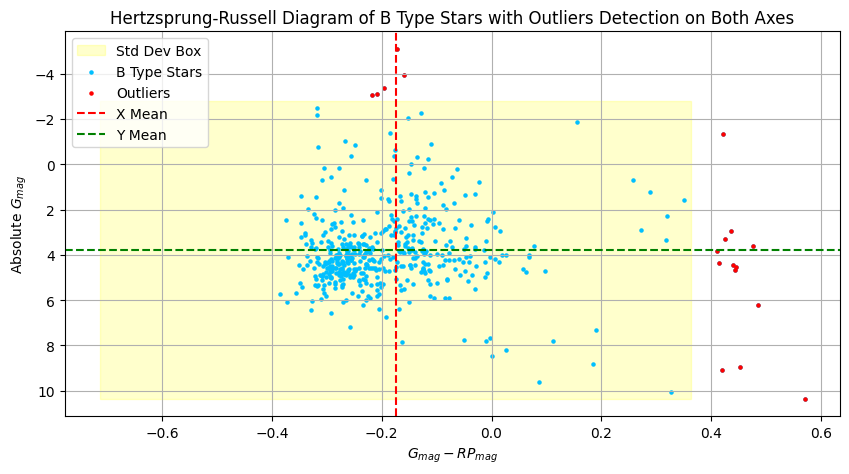

Mean of x-coordinates: -0.17
Standard deviation of x-coordinates: 0.15
X Threshold range: -0.71 to 0.36

Mean of y-coordinates: 3.79
Standard deviation of y-coordinates: 1.88
Y Threshold range: -2.78 to 10.36

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
3122,3502,1237654604254216298,165.223100,3.772993,O8/O9 (167771),B3,0.141320,3814942818784000000,17.119127,16.996004,17.292263,-5.099360,1.3
5829,6505,1237655374648705141,251.700010,37.799655,B2IV-V (176819),B3,0.067571,1352239151424703360,17.328888,17.247992,17.488962,-3.930172,1.3
6471,7228,1237653613721944126,140.111930,54.187111,F2V (33256),B5,0.141276,1023203600959065728,16.418325,16.695410,15.974077,4.671805,1.5
14694,16223,1237657630587813944,135.674910,41.586767,B5 (338529),B8,0.235926,816590282174936704,16.372742,16.625507,15.962461,3.821832,1.8
16229,17894,1237655463769997359,191.109480,61.587352,CV,B3,2.703068,1580508421164776064,18.149220,18.282032,17.695698,8.956060,1.3
20153,22245,1237657770174382095,155.110360,53.075864,CV,B9,0.057480,851753282506891776,16.814981,16.960253,16.394283,9.067381,1.9
20170,22262,1237658204519071773,210.717460,46.988447,A9V (154660),B3,0.087714,1509293053034812032,17.706224,17.597794,17.901620,-3.367127,1.3
20446,22559,1237663784202993670,12.734979,0.016141,F3/F5V (30743),B9,0.258681,2536887308864123136,16.001130,16.253160,15.576144,3.284478,1.9
21382,23581,1237657855532138511,165.701710,49.840426,F0II (25291),B9,0.262926,832831408946733952,15.846725,16.114462,15.424078,-1.335870,1.9
26360,29112,1237654383054225498,145.246000,56.416759,F0II (25291),B3,0.331115,1025172551406415872,16.302800,16.571285,15.863113,4.427818,1.3


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('B')]
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 3.5 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 3.5 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='deepskyblue', s=5, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=5, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of B Type Stars with Outliers Detection on Both Axes')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-209-a32034d1a6c2>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['a_star_code'] = df['spectral_type'].apply(a_star_code)


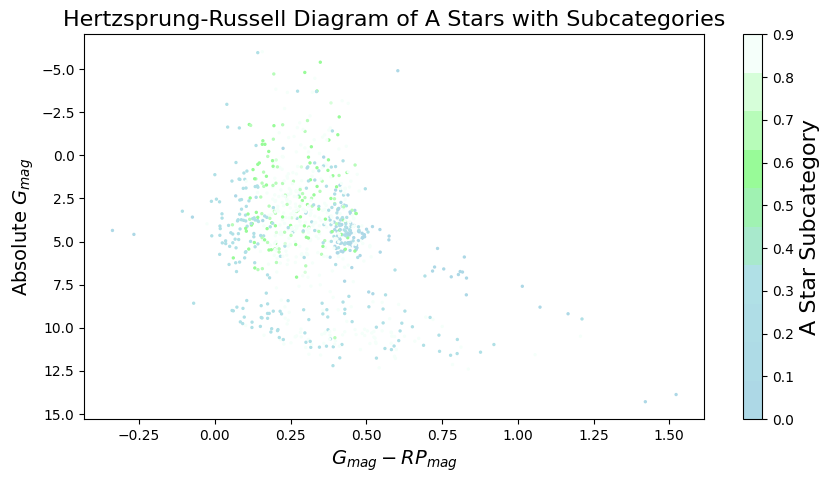

In [ ]:
# Filter the dataframe to only contain A stars
df = above_df[above_df['spectral_type'].str.startswith('A')]

# Function to get the color code based on A star subcategory
def a_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad A type

df['a_star_code'] = df['spectral_type'].apply(a_star_code)

# Define the colors (gradient within 'A' spectral type)
colors = ['lightblue', 'powderblue', 'palegreen', 'mintcream']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("ASubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['a_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of A Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for A subcategories
cbar = plt.colorbar()
cbar.set_label('A Star Subcategory', fontsize=16)
plt.show()

<ipython-input-246-9380844c0986>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-246-9380844c0986>:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


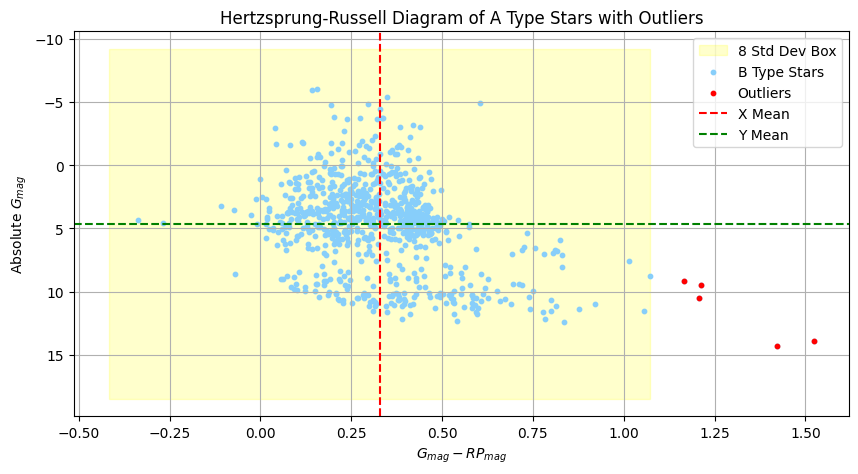

Mean of x-coordinates: 0.33
Standard deviation of x-coordinates: 0.19
X Threshold range: -0.42 to 1.07

Mean of y-coordinates: 4.65
Standard deviation of y-coordinates: 3.46
Y Threshold range: -9.19 to 18.49

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
59482,66174,1237678859547901974,5.898326,12.768441,M4.5:III (123657),A0,-0.000000,2755706443667313024,19.793964,21.165625,18.627987,9.191737,2.0
61846,68852,1237663784216691566,44.149590,0.042995,M6III (148783),A0,-0.000000,2498035683244436480,19.719467,21.151060,18.298388,14.293932,2.0
62982,70141,1237665567140807014,207.188440,24.112838,M6III (148783),A0,-0.000000,1444031020676150528,19.664170,21.540651,18.141607,13.877123,2.0
75212,84022,1237667112256536679,134.960440,21.906644,WDhotter,A9_-1.0_Dwarf,2.649118,685108242184109056,19.150097,18.934418,17.943190,10.493104,2.9
79479,88778,1237669761189347364,342.377520,5.724348,M5III (221615),A3_-1.0_Dwarf,5.364483,2711475942740396672,17.423958,17.612364,16.211990,9.492887,2.3


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('A')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 4 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 4 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='8 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='lightskyblue', s=10, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=10, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of A Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-244-6e238547828e>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['f_star_code'] = df['spectral_type'].apply(f_star_code)


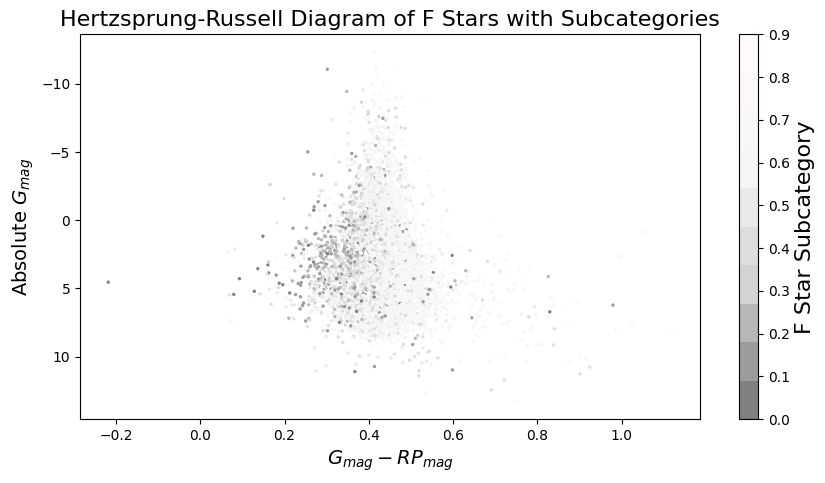

In [ ]:
# Filter the dataframe to only contain F stars
df = above_df[above_df['spectral_type'].str.startswith('F')]

# Function to get the color code based on F star subcategory
def f_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad F type

df['f_star_code'] = df['spectral_type'].apply(f_star_code)

# Define the colors (gradient within 'F' spectral type)
colors = ['grey', 'lightgrey', 'whitesmoke', 'snow']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("FSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['f_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of F Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for F subcategories
cbar = plt.colorbar()
cbar.set_label('F Star Subcategory', fontsize=16)
plt.show()

<ipython-input-323-bed1f0c837ee>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-323-bed1f0c837ee>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


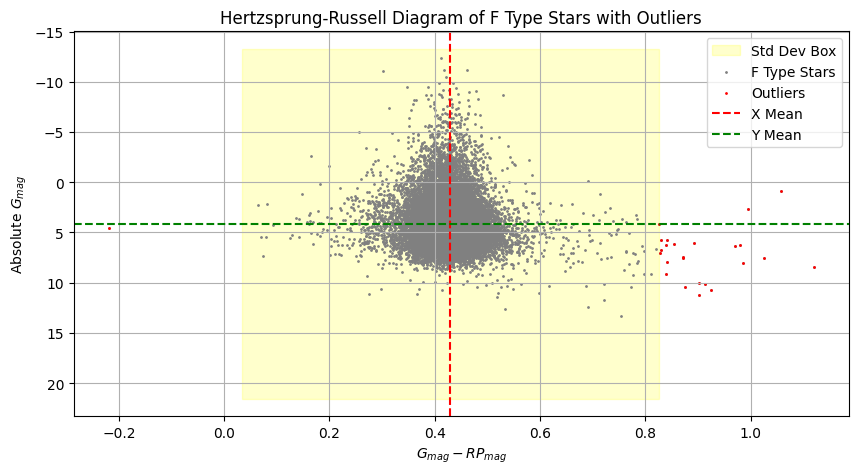

Mean of x-coordinates: 0.43
Standard deviation of x-coordinates: 0.04
X Threshold range: 0.03 to 0.83

Mean of y-coordinates: 4.15
Standard deviation of y-coordinates: 1.74
Y Threshold range: -13.27 to 21.57

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
308,343,1237648703510282257,199.234930,-0.672317,F3/F5V (30743),F1_-0.5_Dwarf,0.055605,3686707194247514240,16.751253,16.492142,15.771535,6.228918,3.1
1175,1341,1237648721755439252,152.273150,0.236574,F6V (16673),F9_-0.5_Dwarf,0.135936,3831823174129063680,19.549360,19.509700,18.677378,7.464787,3.9
6659,7434,1237654949987352759,240.243770,54.729451,F2V (33256),F2_-2.0_Dwarf,0.075436,1621310400023340288,18.086578,18.173130,17.260353,4.136832,3.2
9590,10662,1237660343398432906,142.146980,38.414439,WDhotter,F4_-1.0_Dwarf,0.589449,811333414003962112,19.346252,19.140636,18.444721,11.267750,3.4
16661,18361,1237661362912362664,214.468280,44.587607,WDhotter,F4_-1.0_Dwarf,1.327265,1504891811066346752,19.602293,19.360405,18.761673,7.960008,3.4
24116,26610,1237661812273971280,182.856020,12.126139,F0IV (81937),F4_-2.0_Dwarf,0.095471,3920384545074544896,19.039278,18.773878,18.114668,10.777099,3.4
27503,30382,1237659326561648701,237.764940,47.458096,A4V (97603),F0_-1.5_Dwarf,0.079198,1398287767843592192,15.930010,15.820156,16.148634,4.548930,3.0
29357,32420,1237661064405123190,124.244380,5.553426,F3/F5V (30743),F6_-1.0_Dwarf,0.083951,3096289516220880384,18.372034,18.050962,17.386658,8.074865,3.6
32518,35883,1237663278472626195,18.229104,0.980157,A2II (39866),F7_-2.0_Dwarf,0.676597,2534956355994046976,20.099771,20.085958,19.074865,7.516994,3.7
42247,46802,1237667113331851505,138.218330,24.075873,F3/F5V (30743),F8_-1.0_Dwarf,0.102263,687283729019431552,18.913382,18.683472,17.942900,6.307657,3.8


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('F')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 10 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 10 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='grey', s=1, alpha=1, label='F Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=1, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of F Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-301-48eded67b40f>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['g_star_code'] = df['spectral_type'].apply(g_star_code)


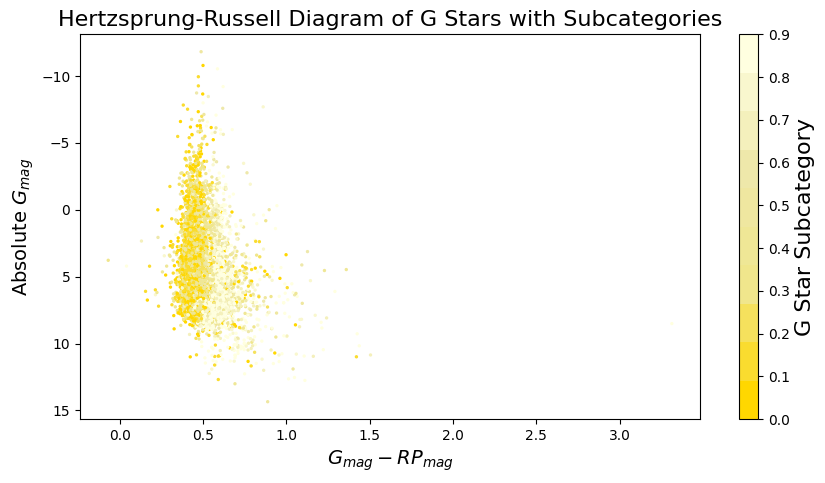

In [ ]:
# Filter the dataframe to only contain G stars
df = above_df[above_df['spectral_type'].str.startswith('G')]

# Function to get the color code based on G star subcategory
def g_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad G type

df['g_star_code'] = df['spectral_type'].apply(g_star_code)

# Define the colors (gradient within 'G' spectral type)
colors = ['gold', 'khaki', 'palegoldenrod', 'lightyellow']
# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("GSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['g_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of G Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for G subcategories
cbar = plt.colorbar()
cbar.set_label('G Star Subcategory', fontsize=16)

plt.show()


<ipython-input-253-3ae6cc10a7c3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-253-3ae6cc10a7c3>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


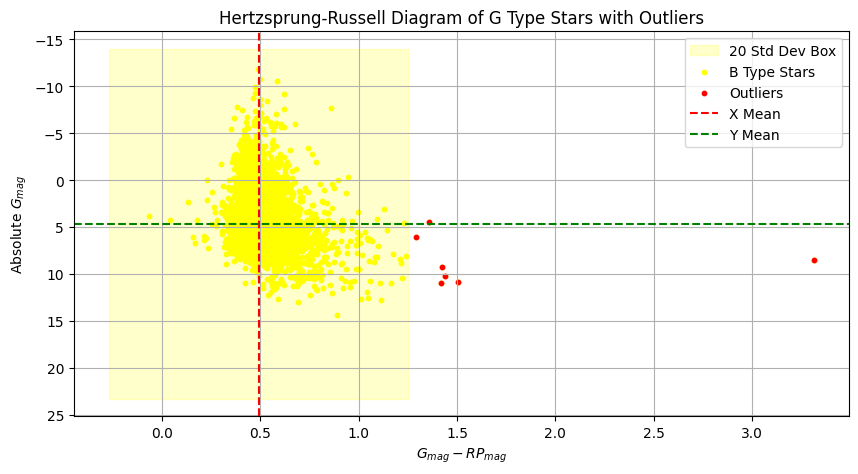

Mean of x-coordinates: 0.49
Standard deviation of x-coordinates: 0.08
X Threshold range: -0.27 to 1.25

Mean of y-coordinates: 4.67
Standard deviation of y-coordinates: 1.86
Y Threshold range: -13.98 to 23.31

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
8168,9112,1237651249878990868,143.05857,56.849284,G4V (32923),G4_+0.0_Dwarf,0.041781,1025103316533545088,18.225239,17.789750,16.865433,4.468783,4.4
15545,17156,1237655107301539906,173.05289,58.628818,WDhotter,G1_-2.0_Dwarf,2.205202,858066162875941376,18.226929,17.954117,16.806250,10.987531,4.1
15738,17362,1237661069778092416,133.79772,9.744218,G8V (101501),G9_-1.0_Dwarf,0.113587,597533201890066688,19.062105,19.031567,17.770600,6.105001,4.9
26037,28755,1237656568117788723,325.55386,-0.312677,G8V (101501),G9_-1.0_Dwarf,1.714174,2687109558184349568,19.246407,18.118092,15.932670,8.506976,4.9
36612,40451,1237658800961355783,173.67782,53.784320,M5III (221615),G9_-1.0_Dwarf,3.149066,841158835138583936,17.186770,16.927700,15.749213,10.167115,4.9
41589,46046,1237662195607207944,206.21294,41.176778,M5III (221615),G9_-1.0_Dwarf,3.747545,1500358077950814848,18.773106,18.460684,17.347963,9.269610,4.9
68310,76146,1237665535471452351,247.52159,15.674461,M5III (221615),G7_-1.0_Dwarf,4.183936,4465459360005031296,17.807703,17.523636,16.302444,10.851135,4.7


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('G')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 10 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 10 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='20 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='yellow', s=10, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=10, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of G Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-255-e39ed1c458ba>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['k_star_code'] = df['spectral_type'].apply(k_star_code)


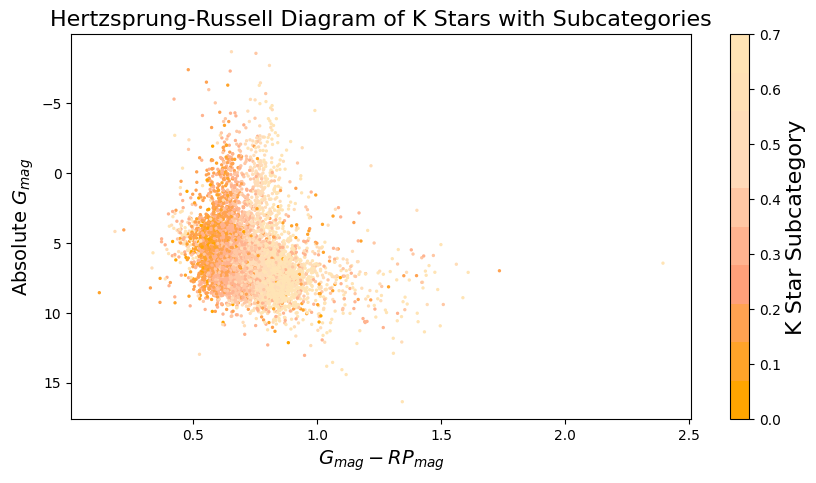

In [ ]:
# Filter the dataframe to only contain K stars
df = above_df[above_df['spectral_type'].str.startswith('K')]

# Function to get the color code based on K star subcategory
def k_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad K type

df['k_star_code'] = df['spectral_type'].apply(k_star_code)

# Define the colors (gradient within 'K' spectral type)
colors = ['orange', 'lightsalmon', 'peachpuff', 'moccasin']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("KSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['k_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of K Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for K subcategories
cbar = plt.colorbar()
cbar.set_label('K Star Subcategory', fontsize=16)

plt.show()

<ipython-input-321-9c0c59fea58b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-321-9c0c59fea58b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


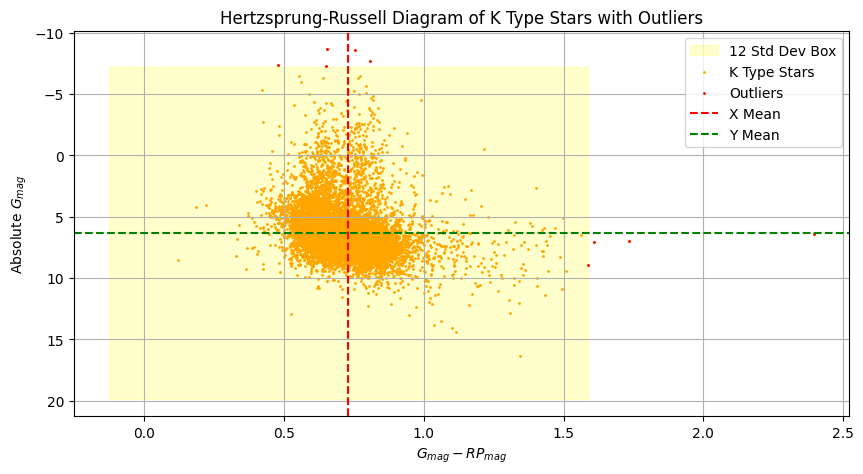

Mean of x-coordinates: 0.73
Standard deviation of x-coordinates: 0.11
X Threshold range: -0.13 to 1.59

Mean of y-coordinates: 6.34
Standard deviation of y-coordinates: 1.69
Y Threshold range: -7.18 to 19.86

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
1424,1613,1237648704591233182,215.676680,0.172220,G5III+... (157910),K3_-2.0_Dwarf,0.188734,3653809149215269120,19.224024,19.740728,18.575327,-7.281126,5.3
33852,37376,1237662224627728591,245.158730,22.266568,K2III (115136),K7_-0.5_Dwarf,0.089623,1298568625915243648,19.200811,18.112633,16.805880,6.445115,5.7
34308,37889,1237666185092726905,328.512600,4.561227,K3V (32147),K5_-0.5_Dwarf,0.097174,2696687747569540096,18.952238,19.523560,18.298504,-8.662156,5.5
39843,44091,1237665549424394385,209.702300,25.405212,K5Ve (118100),K7_+0.5_Dwarf,0.038804,1258113744837037184,18.471048,18.434956,16.862164,7.105091,5.7
46432,51504,1237668297137586202,202.414090,18.417068,K3V (32147),K2_-1.0_Dwarf,0.082996,3746860616411478528,18.017378,17.357450,16.282305,6.988424,5.2
48797,54156,1237667292117532806,143.589410,20.665700,K5Ve (118100),K7_+0.5_Dwarf,0.037291,634674640249828608,17.431147,17.398918,15.843518,8.913705,5.7
65639,73142,1237663782599589945,29.336058,-1.207038,K4III (136726),K5_+0.0_Dwarf,0.167342,2505880050168681600,15.243226,15.942374,14.436173,-7.681907,5.5
81249,90774,1237670016729940119,32.114219,7.519942,K3V (32147),K4_-1.0_Dwarf,0.042780,2521335919479925760,17.562239,18.117094,16.809652,-8.547005,5.4
82209,91863,1237679079666417803,8.143023,-3.930455,G0 (63791),K2_-1.0_Dwarf,0.222851,2528336059042047232,19.126951,19.452328,18.647411,-7.378199,5.2


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('K')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 8 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 8 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='12 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='orange', s=1, alpha=1, label='K Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=1, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of K Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

<ipython-input-263-3d0544308019>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['m_star_code'] = df['spectral_type'].apply(m_star_code)


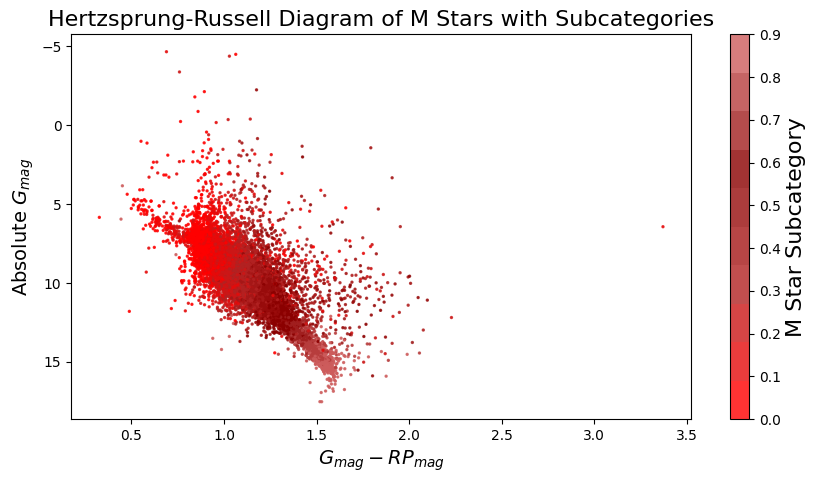

In [ ]:
# Filter the dataframe to only contain M stars
df = above_df[above_df['spectral_type'].str.startswith('M')]

# Function to get the color code based on M star subcategory
def m_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad M type

df['m_star_code'] = df['spectral_type'].apply(m_star_code)

# Define the colors (gradient within 'M' spectral type)
colors = ['red', 'firebrick', 'darkred', 'indianred']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("MSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['m_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of M Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for M subcategories
cbar = plt.colorbar()
cbar.set_label('M Star Subcategory', fontsize=16)
plt.show()

<ipython-input-275-99ef79748a67>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-275-99ef79748a67>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


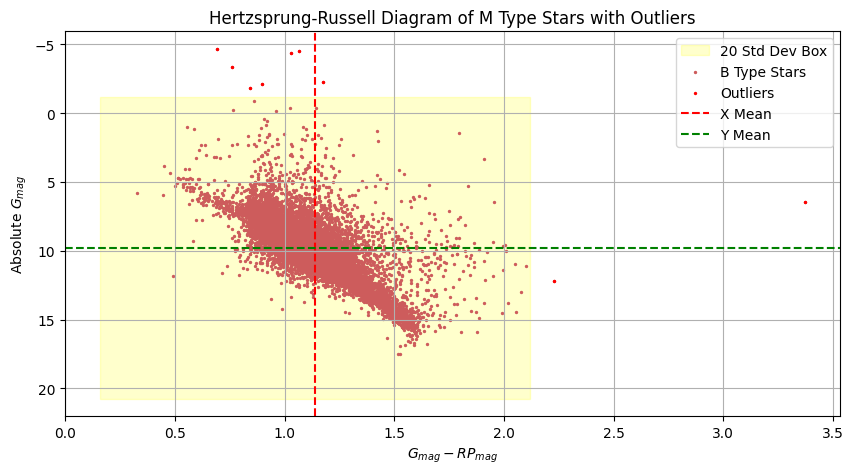

Mean of x-coordinates: 1.14
Standard deviation of x-coordinates: 0.20
X Threshold range: 0.16 to 2.12

Mean of y-coordinates: 9.81
Standard deviation of y-coordinates: 2.19
Y Threshold range: -1.14 to 20.76

Outliers:


,index,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
2606,2928,1237654600496644338,165.972340,3.916014,M5III (221615),M1_-0.5_Dwarf,0.621184,3814997661221404672,20.344841,21.235914,16.973263,6.432261,6.1
2913,3270,1237653441377140754,357.216580,-10.091519,K0V (10780),M1_-0.5_Dwarf,0.139199,2434725185242697216,18.941725,19.315498,18.252230,-4.664507,6.1
9580,10651,1237657071158231118,25.339746,0.371981,M5III (221615),M2_-0.5_Dwarf,0.587972,2510221089579256320,20.652308,20.219326,18.423283,12.189895,6.2
40325,44632,1237655125004451935,173.463390,4.646699,K4III (136726),M0_-0.5_Dwarf,0.268374,3813074340506516736,17.194107,17.960594,16.351313,-1.798907,6.0
58535,65131,1237678617970343974,35.755086,1.416712,G5Iab: (20123),M2_-0.5_Dwarf,0.480953,2501591989179930368,15.841420,16.467224,15.081611,-3.381900,6.2
76538,85523,1237665328785391731,202.935540,30.087453,K5 (G_19-24),M0_+0.0_Dwarf,0.089287,1456167537398642816,17.975122,18.503792,16.911306,-4.499128,6.0
79450,88743,1237680473365807902,334.433220,28.161663,M1 (204445),M2_+1.0_Dwarf,0.177849,1893864454783110784,19.223837,20.339966,18.194313,-4.382395,6.2
88616,98710,1237662224598303093,167.235670,38.315755,M5III (221615),M5_-0.5_Dwarf,0.293196,764612721101992960,20.160885,21.201788,18.984877,-2.246545,6.5
98813,109728,1237678876707783613,317.674160,8.744288,K4III (136726),M0_-0.5_Dwarf,0.121437,1743340080284681600,15.122233,15.954679,14.228031,-2.132751,6.0


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('M')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 5 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 5 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(10, 5))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='20 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='indianred', s=2, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=2, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of M Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print(f"Mean of x-coordinates: {mean_x:.2f}")
print(f"Standard deviation of x-coordinates: {std_dev_x:.2f}")
print(f"X Threshold range: {lower_bound_x:.2f} to {upper_bound_x:.2f}")
print(f"\nMean of y-coordinates: {mean_y:.2f}")
print(f"Standard deviation of y-coordinates: {std_dev_y:.2f}")
print(f"Y Threshold range: {lower_bound_y:.2f} to {upper_bound_y:.2f}")
print("\nOutliers:")
outliers

## rest plotting codes

<ipython-input-19-4561ce03db23>:34: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(row, ignore_index=True)


df shape:  (108685, 12)
outlier shape:  (1606, 12)


<ipython-input-19-4561ce03db23>:54: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


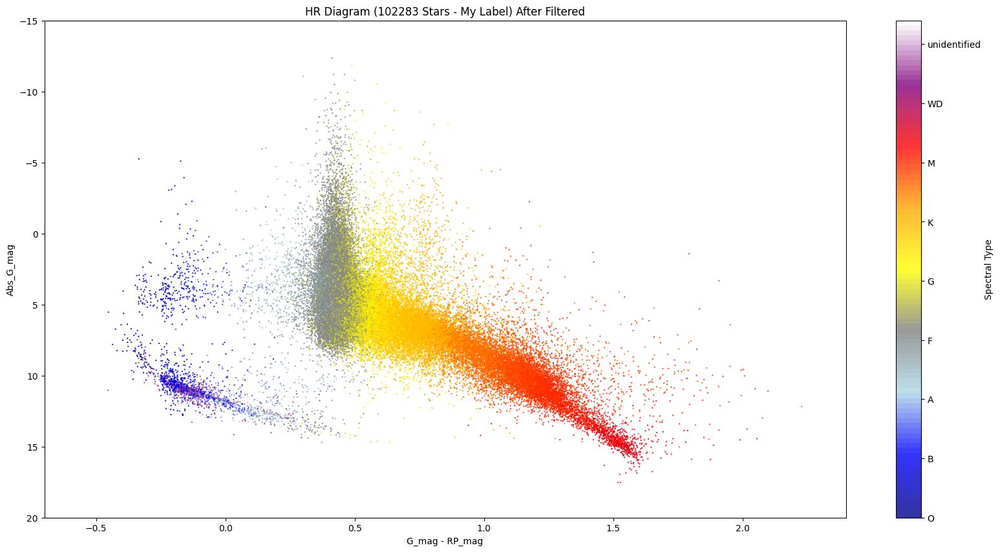

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

a.rename(columns={'min_column': 'spectral_type'}, inplace=True)
a['g_mag'] = pd.to_numeric(a['g_mag'], errors='coerce')
a['bp_mag'] = pd.to_numeric(a['bp_mag'], errors='coerce')
a['rp_mag'] = pd.to_numeric(a['rp_mag'], errors='coerce')
a['abs_g_mag'] = pd.to_numeric(a['abs_g_mag'], errors='coerce')
df = a

# Defining the ranges
ranges = {
    'O': (-0.5, 0.5),
    'B': (-0.25, 0.25),
    'A': (-0.25, 0.5),
    'F': (0.0, 0.6),
    'G': (0.25, 1.0),
    'K': (0.25, 1.25),
    'M': (0.75, 2.5),
}
outliers = pd.DataFrame(columns=df.columns) # DataFrame to store the outliers

# Function to filter based on the ranges
def filter_rows(row):
    spectral_type = row['spectral_type'][0]  # Take only the first character
    g_rp_mag = row['g_mag'] - row['rp_mag']
    lower_bound, upper_bound = ranges.get(spectral_type, (float('-inf'), float('inf')))  # Default to keeping the row if the spectral type is not recognized
    if lower_bound <= g_rp_mag <= upper_bound:
        return True
    else:
        global outliers
        outliers = outliers.append(row, ignore_index=True)
        return False

df = df[df.apply(filter_rows, axis=1)]
print('df shape: ', df.shape)  # Print the shape of the filtered DataFrame
print('outlier shape: ', outliers.shape)  # Print the shape of the outliers DataFrame

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=0.5, alpha=0.8)
plt.xlabel('G_mag - RP_mag')
plt.ylabel('Abs_G_mag')
plt.title('HR Diagram (102283 Stars - My Label) After Filtered')
plt.xlim(-0.7, 2.4)
plt.ylim(-15, 20)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type')
cbar.set_ticklabels(cbar_labels)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()


## Pre-templates Making

In [ ]:
chi_square_df_NonBinary_stars = pd.read_csv('/content/drive/MyDrive/AstroResearch/new_data_table/result_compare_CrossMatched_final.csv')
chi_square_df_NonBinary_stars

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511454356,196.624950,0.282299,K3V (32147),K2_+0.0_Dwarf,0.178762,3690722331539752192,18.251686,18.81738,17.570684,7.390470314893085
2,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
3,1237648674511585391,196.968910,0.349134,K3V (32147),K2_-1.0_Dwarf,0.086616,3690715150354025728,17.733078,18.200039,17.069653,6.4879329221865945
4,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
...,...,...,...,...,...,...,...,...,...,...,...
110286,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424
110287,1237680479270797727,10.312414,33.171030,M5III (221615),M4_+0.0_Dwarf,0.111392,361683181726376448,18.761353,20.059868,17.592068,8.44115534494583
110288,1237680479808062003,11.498197,33.439076,M3III (44478),M3_+0.0_Dwarf,0.136130,362031864351985024,19.595724,20.685791,18.463917,9.104377458646093
110289,1237680511482986978,10.149730,33.697313,G1V (95128),G9_-1.0_Dwarf,0.194256,361903015332657536,19.91739,19.716562,18.767694,NaN


In [ ]:
file_names_SchoolEmail = []
with open('file_names_SchoolEmail.txt') as file:
    for line in file:
        file_names_SchoolEmail.append(line.strip())
file_names_Vu = []
with open('file_names_Vu.txt') as file:
    for line in file:
        file_names_Vu.append(line.strip())
file_names_myGmail = []
with open('file_names_myGmail.txt') as file:
    for line in file:
        file_names_myGmail.append(line.strip())
gaia_IDs = file_names_SchoolEmail + file_names_Vu + file_names_myGmail
len(gaia_IDs)

38895

In [ ]:
filtered_stars_df = chi_square_df_NonBinary_stars[chi_square_df_NonBinary_stars['Gaia_ID'].isin(gaia_IDs)]
filtered_stars_df.reset_index(drop=True, inplace=True)
filtered_stars_df

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
2,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
3,1237648674511651057,197.160190,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920101440812
4,1237648674511716425,197.233240,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538025316523
...,...,...,...,...,...,...,...,...,...,...,...
38890,1237680478733795604,9.981226,32.759037,F3/F5V (30743),F7_-2.0_Dwarf,0.045412,361647520613121280,17.45469,17.765306,16.99537,3.7334639332152193
38891,1237678894960017950,12.683144,35.618407,F3/F5V (30743),G3_-2.0_Dwarf,0.051266,363805239167746176,17.415297,17.730392,16.93641,4.859460171912001
38892,1237680478733992121,10.597082,32.668030,F3/F5V (30743),F7_-2.0_Dwarf,0.082424,361585192048323072,16.598083,16.92125,16.109825,5.334753548079526
38893,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424


In [ ]:
filtered_stars_df_dropna = filtered_stars_df.dropna()
filtered_stars_df_dropna.reset_index()
print(filtered_stars_df_dropna.shape)
filtered_stars_df_dropna.head(5)

(38067, 11)


,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.71340,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511585290,196.90046,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
2,1237648674511650951,197.03041,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
3,1237648674511651057,197.16019,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920101440812
4,1237648674511716425,197.23324,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538025316523


In [ ]:
chi_square_df_allTemplates = pd.read_csv('/content/drive/MyDrive/AstroResearch/new_data_table/chi_square_df_All_final.csv')

chi_square_df_allTemplates_38067 = chi_square_df_allTemplates[chi_square_df_allTemplates['Star_ID'].isin(filtered_stars_df_dropna['ID'])]
chi_square_df_allTemplates_38067.reset_index()
print(chi_square_df_allTemplates_38067.shape)
chi_square_df_allTemplates_38067.head(5)

(38067, 469)


,Star_ID,A0,A1,A2,A2+F0,A2+F2,A3+F0,A3+F2,A3+F5,A3_+0.0_Dwarf,...,WD0,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9
0,1237661138490949678,2.391024,3.744891,5.196113,2.922535,2.874258,1.657908,1.580526,1.636138,1.804961,...,56.934217,50.366942,52.615701,33.627864,21.528537,11.310041,3.870518,0.819745,0.139705,0.142904
2,1237661133662191634,7.439884,14.764115,32.745235,20.965743,20.679179,13.826711,13.365542,13.478507,7.399509,...,213.400075,191.646641,199.211933,134.318431,91.700294,54.468738,27.051306,13.096557,7.021517,4.215967
4,1237661384380121097,7.609563,14.866814,30.267828,20.182568,19.919524,14.026185,13.602758,13.742377,7.750695,...,186.213284,167.916081,174.329869,120.084291,83.980351,51.480720,26.197781,12.886728,7.154543,4.291901
5,1237661125617647618,5.194555,9.564738,16.498159,10.624698,10.489855,7.140310,6.910981,7.020101,4.943238,...,119.373775,106.964409,111.281847,74.696164,50.721984,29.685597,13.763012,5.829063,2.696305,1.288648
6,1237661384379793493,4.471788,8.218671,14.820273,9.219650,9.081401,5.904830,5.689713,5.806935,4.054481,...,119.946336,107.203342,111.620864,74.337802,50.003130,28.562715,12.116128,4.284547,1.589042,0.562687


(38067, 11)


<ipython-input-18-2fbaedfafc82>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


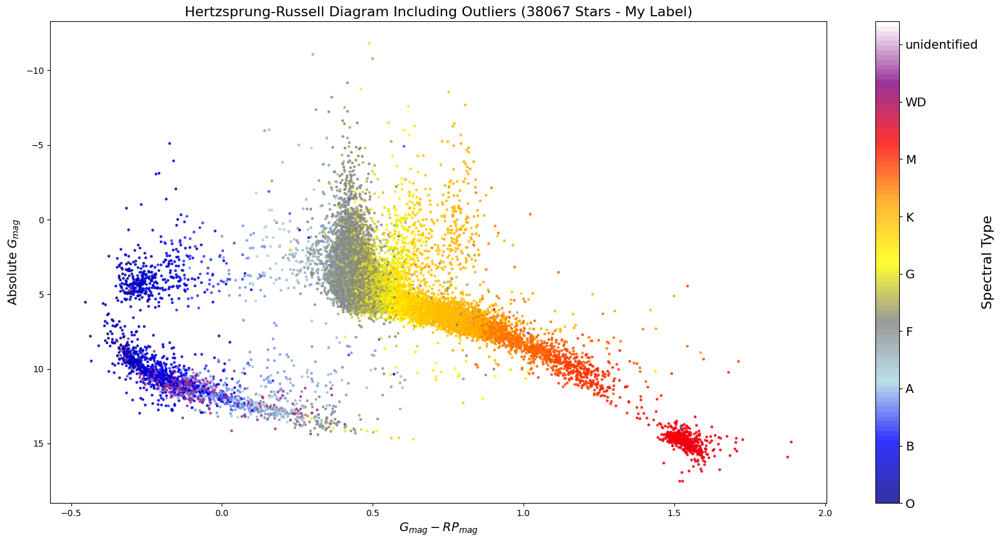

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LinearSegmentedColormap

# Assuming 'a' is defined somewhere above this snippet
filtered_stars_df_dropna.rename(columns={'min_column': 'spectral_type'}, inplace = True)
filtered_stars_df_dropna['g_mag'] = pd.to_numeric(filtered_stars_df_dropna['g_mag'], errors='coerce')
filtered_stars_df_dropna['bp_mag'] = pd.to_numeric(filtered_stars_df_dropna['bp_mag'], errors='coerce')
filtered_stars_df_dropna['rp_mag'] = pd.to_numeric(filtered_stars_df_dropna['rp_mag'], errors='coerce')
filtered_stars_df_dropna['abs_g_mag'] = pd.to_numeric(filtered_stars_df_dropna['abs_g_mag'], errors='coerce')

df = filtered_stars_df_dropna
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=5, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram Including Outliers (38067 Stars - My Label)', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=14)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

(38067, 12)


<ipython-input-19-b1df014aafe5>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


excluded white dwarf corner shape:  (36055, 12)
Stars excluded (above the line):  (2012, 12)


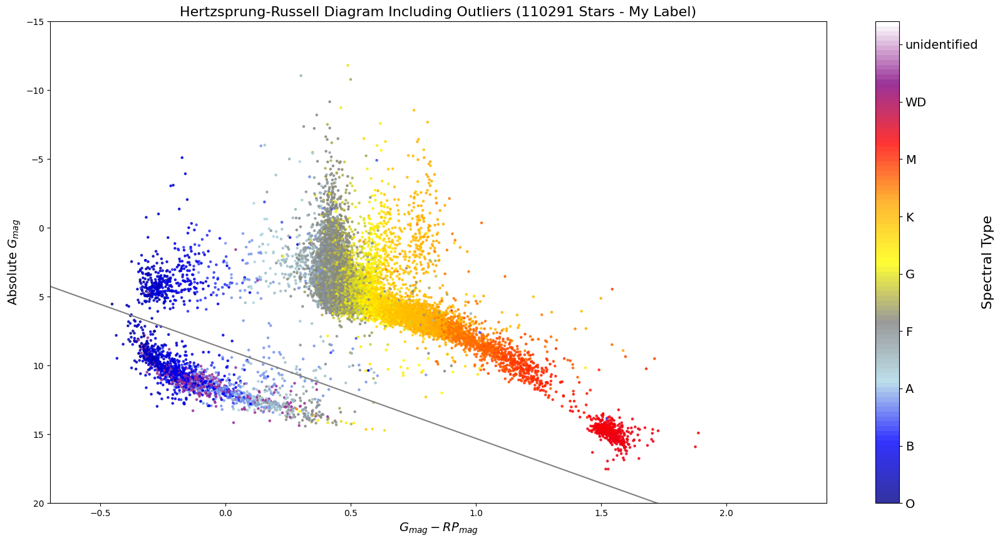

In [ ]:
df = filtered_stars_df_dropna
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)


m = 6.5  # Slope
b = 8.8   # Y-intercept

# Filter the DataFrame
def filter_below_line(row):
    x = row['g_mag'] - row['rp_mag']
    y = row['abs_g_mag']
    return y <= m * x + b
above_df = df[df.apply(filter_below_line, axis=1)]
print('excluded white dwarf corner shape: ', above_df.shape)

below_df = df[~df.apply(filter_below_line, axis=1)]  # The rows NOT satisfying the condition
print('Stars excluded (above the line): ', below_df.shape)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=5, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram Including Outliers (110291 Stars - My Label)', fontsize=16)
plt.xlim(-0.7, 2.4)
plt.ylim(-15, 20)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Plot the line
x_line = np.linspace(-0.7, 2.4, 100)
y_line = m * x_line + b
plt.plot(x_line, y_line, color='grey')

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=14)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

## Each Unique Spectral Type

In [ ]:
# filter out binary stars
with open('/content/drive/MyDrive/AstroResearch/new_data_table/templates_names.txt', 'r') as file:
    nonBinary_star_names = file.readlines()
nonBinary_star_names = [s.strip() for s in nonBinary_star_names]
nonBinary_star_names.append('Star_ID')

# filter out the binary stars' templates
chi_square_df_allTemplates_38067 = chi_square_df_allTemplates_38067[nonBinary_star_names]

# filter out L3 dwarfs
columns_to_drop = ['L0','L1', 'L2','L3', 'L6']
chi_square_df_allTemplates_38067 = chi_square_df_allTemplates_38067.drop(columns=columns_to_drop)

In [ ]:
chi_square_df_allTemplates_38067 = chi_square_df_allTemplates_38067.reset_index(drop=True)
chi_square_df_allTemplates_38067

,A0,A1,A2,A3_+0.0_Dwarf,A3_+0.5_Dwarf,A3_-0.5_Dwarf,A3_-1.0_Dwarf,A4_-1.0_Dwarf,A6_+0.0_Dwarf,A6_+0.5_Dwarf,...,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9,Star_ID
0,2.391024,3.744891,5.196113,1.804961,2.756053,2.353616,0.667835,2.234717,0.647360,1.205326,...,50.366942,52.615701,33.627864,21.528537,11.310041,3.870518,0.819745,0.139705,0.142904,1237661138490949678
1,7.439884,14.764115,32.745235,7.399509,22.134302,12.766920,2.079694,12.913567,5.021675,14.657124,...,191.646641,199.211933,134.318431,91.700294,54.468738,27.051306,13.096557,7.021517,4.215967,1237661133662191634
2,7.609563,14.866814,30.267828,7.750695,20.920760,13.015003,2.266533,13.097405,5.273173,13.976244,...,167.916081,174.329869,120.084291,83.980351,51.480720,26.197781,12.886728,7.154543,4.291901,1237661384380121097
3,5.194555,9.564738,16.498159,4.943238,10.702576,7.572667,1.573852,7.466731,2.901377,6.577664,...,106.964409,111.281847,74.696164,50.721984,29.685597,13.763012,5.829063,2.696305,1.288648,1237661125617647618
4,4.471788,8.218671,14.820273,4.054481,9.233516,6.349280,1.251097,6.245865,2.158718,5.178976,...,107.203342,111.620864,74.337802,50.003130,28.562715,12.116128,4.284547,1.589042,0.562687,1237661384379793493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
38062,3.842992,5.810949,7.261920,3.411506,4.859999,4.302290,1.409225,4.097029,2.012047,3.096488,...,43.218726,44.949835,30.766694,21.335163,12.719287,6.036265,2.687871,1.335558,0.748934,1237680100772085795
38063,6.979497,13.881919,29.531035,6.958510,20.312286,12.144071,1.962269,12.231056,4.530603,13.026156,...,172.461423,179.079949,124.087739,87.193919,53.360039,25.894960,11.645569,5.909207,3.084162,1237680332702285912
38064,9.312927,18.636185,51.255204,9.179197,35.383510,16.955284,2.403245,17.358388,6.769599,24.375367,...,290.230373,302.163770,201.947312,136.611536,81.194929,41.663155,21.563251,12.261023,7.935058,1237680333238174081
38065,7.722236,14.767545,30.689518,7.593631,20.927170,12.698669,2.195850,12.659376,5.281912,14.129853,...,178.086801,185.394852,124.345730,84.468182,50.366966,25.364751,12.576918,6.901324,4.219631,1237680333239353552


<ipython-input-17-305c86c53f1d>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['o_star_code'] = df['spectral_type'].apply(o_star_code)


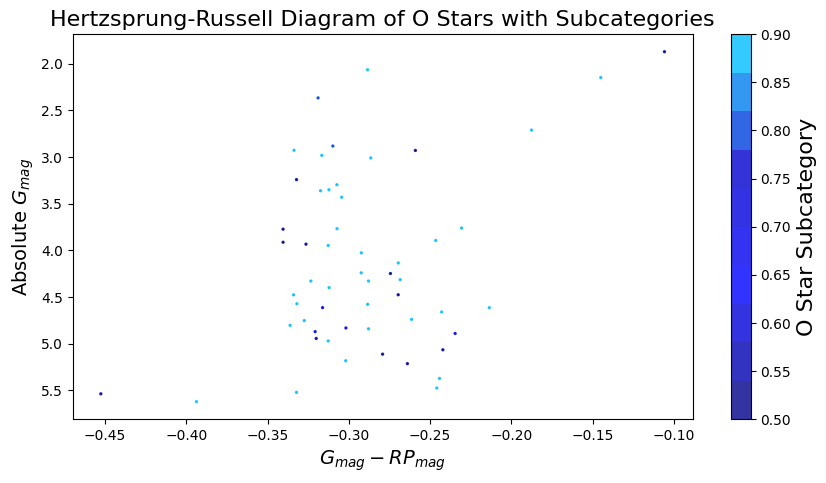

In [ ]:
# Filter the dataframe to only contain O stars
df = above_df[above_df['spectral_type'].str.startswith('O')]

# Function to get the color code based on O star subcategory
def o_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad O type

df['o_star_code'] = df['spectral_type'].apply(o_star_code)

# Define the colors (gradient within 'O' spectral type)
colors = ['darkblue', 'blue', 'mediumblue', 'deepskyblue']
# colors = ['black', 'black', 'black', 'black']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("OSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['o_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of O Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for O subcategories
cbar = plt.colorbar()
cbar.set_label('O Star Subcategory', fontsize=16)

plt.show()

<ipython-input-18-56d3d4ac6e80>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['b_star_code'] = df['spectral_type'].apply(b_star_code)


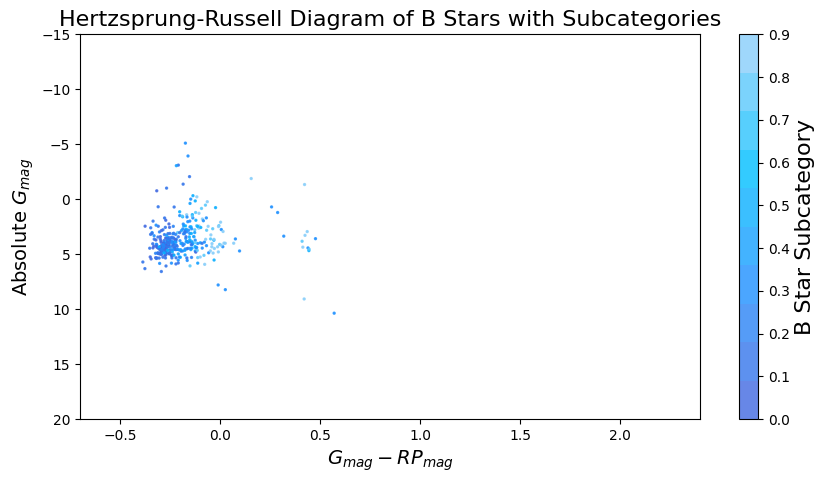

In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('B')]

# Function to get the color code based on B star subcategory
def b_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad B type

df['b_star_code'] = df['spectral_type'].apply(b_star_code)

# Define the colors (gradient within 'B' spectral type)
colors = ['royalblue', 'dodgerblue', 'deepskyblue', 'lightskyblue']
# colors = ['black', 'black', 'black', 'black']


# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("BSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['b_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of B Stars with Subcategories', fontsize=16)
plt.xlim(-0.7, 2.4)
plt.ylim(-15, 20)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for B subcategories
cbar = plt.colorbar()
cbar.set_label('B Star Subcategory', fontsize=16)

plt.show()


<ipython-input-15-e16fc7bdbf65>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['a_star_code'] = df['spectral_type'].apply(a_star_code)


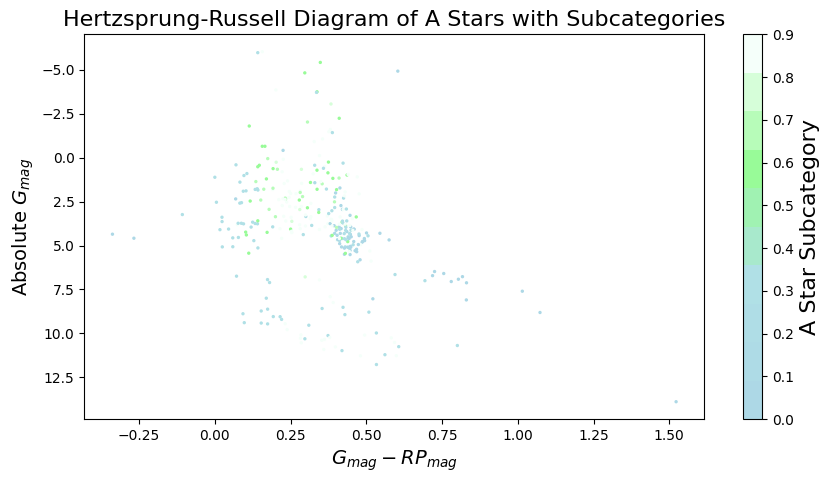

In [ ]:
# Filter the dataframe to only contain A stars
df = above_df[above_df['spectral_type'].str.startswith('A')]

# Function to get the color code based on A star subcategory
def a_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad A type

df['a_star_code'] = df['spectral_type'].apply(a_star_code)

# Define the colors (gradient within 'A' spectral type)
colors = ['lightblue', 'powderblue', 'palegreen', 'mintcream']
# colors = ['black', 'black', 'black', 'black']


# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("ASubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['a_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of A Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for A subcategories
cbar = plt.colorbar()
cbar.set_label('A Star Subcategory', fontsize=16)
plt.show()

<ipython-input-16-d100ef7951fa>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['f_star_code'] = df['spectral_type'].apply(f_star_code)


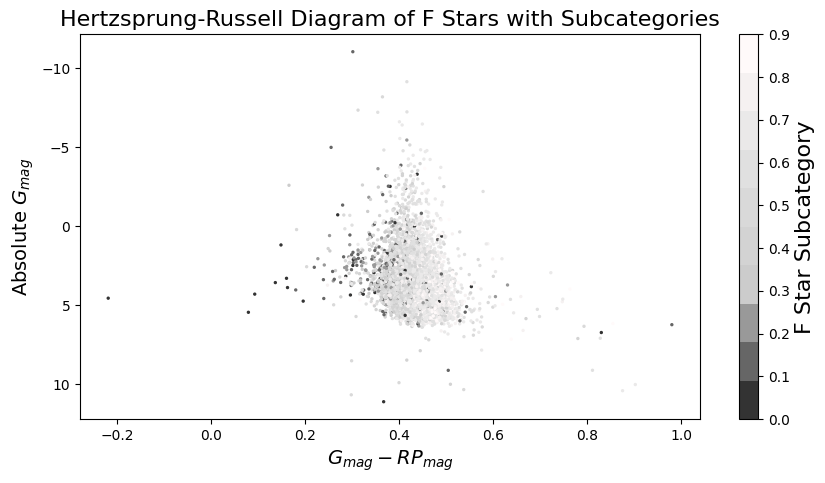

In [ ]:
# Filter the dataframe to only contain F stars
df = above_df[above_df['spectral_type'].str.startswith('F')]

# Function to get the color code based on F star subcategory
def f_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad F type

df['f_star_code'] = df['spectral_type'].apply(f_star_code)

# Define the colors (gradient within 'F' spectral type)
colors = ['#333333', '#CCCCCC', '#E0E0E0', '#FFFAFA']
# colors = ['black', 'black', 'black', 'black']


# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("FSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['f_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of F Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for F subcategories
cbar = plt.colorbar()
cbar.set_label('F Star Subcategory', fontsize=16)
plt.show()

<ipython-input-17-568268e926ec>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['g_star_code'] = df['spectral_type'].apply(g_star_code)


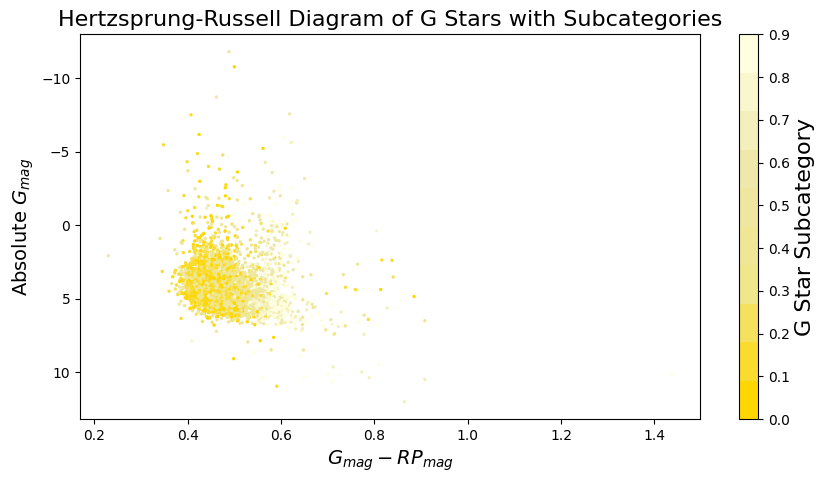

In [ ]:
# Filter the dataframe to only contain G stars
df = above_df[above_df['spectral_type'].str.startswith('G')]

# Function to get the color code based on G star subcategory
def g_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad G type

df['g_star_code'] = df['spectral_type'].apply(g_star_code)

# Define the colors (gradient within 'G' spectral type)
colors = ['gold', 'khaki', 'palegoldenrod', 'lightyellow']
# colors = ['black', 'black', 'black', 'black']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("GSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['g_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of G Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for G subcategories
cbar = plt.colorbar()
cbar.set_label('G Star Subcategory', fontsize=16)

plt.show()


<ipython-input-18-e39ed1c458ba>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['k_star_code'] = df['spectral_type'].apply(k_star_code)


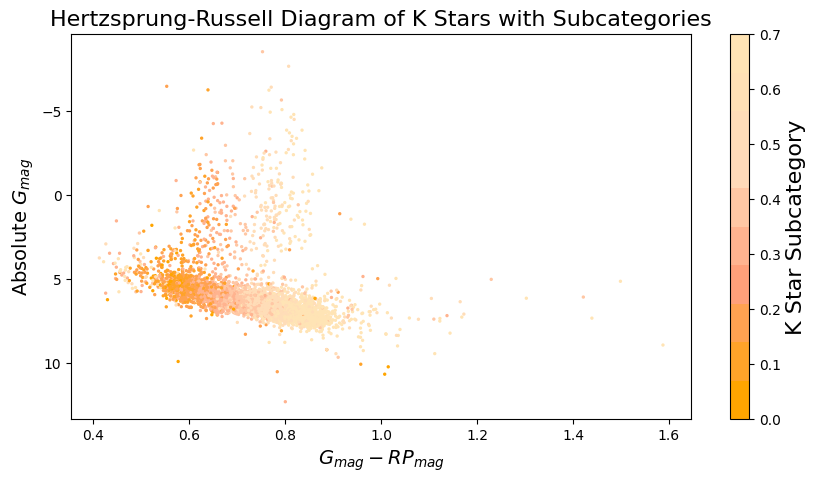

In [ ]:
# Filter the dataframe to only contain K stars
df = above_df[above_df['spectral_type'].str.startswith('K')]

# Function to get the color code based on K star subcategory
def k_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad K type

df['k_star_code'] = df['spectral_type'].apply(k_star_code)

# Define the colors (gradient within 'K' spectral type)
colors = ['orange', 'lightsalmon', 'peachpuff', 'moccasin']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("KSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['k_star_code'], cmap=colormap, s=2, alpha=1)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of K Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for K subcategories
cbar = plt.colorbar()
cbar.set_label('K Star Subcategory', fontsize=16)

plt.show()

<ipython-input-19-3d0544308019>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['m_star_code'] = df['spectral_type'].apply(m_star_code)


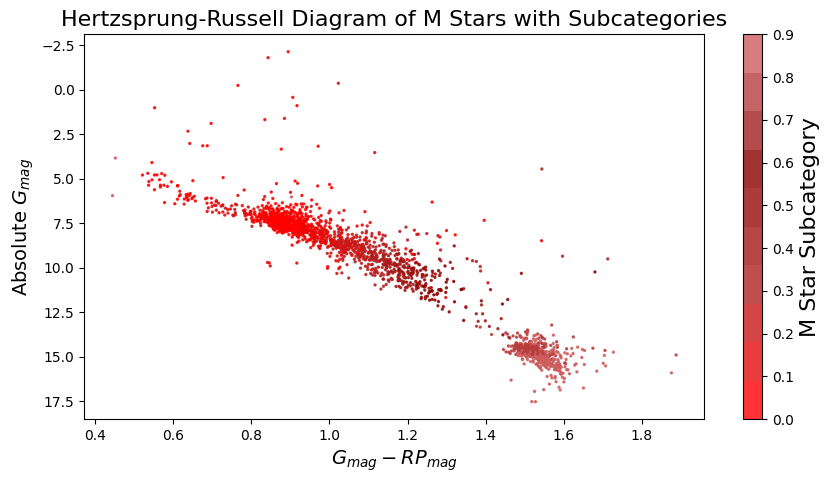

In [ ]:
# Filter the dataframe to only contain M stars
df = above_df[above_df['spectral_type'].str.startswith('M')]

# Function to get the color code based on M star subcategory
def m_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad M type

df['m_star_code'] = df['spectral_type'].apply(m_star_code)

# Define the colors (gradient within 'M' spectral type)
colors = ['red', 'firebrick', 'darkred', 'indianred']

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("MSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['m_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of M Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for M subcategories
cbar = plt.colorbar()
cbar.set_label('M Star Subcategory', fontsize=16)
plt.show()

## Remove O star Outliers

-0.2910046181818182
lower_bound_x:  -0.39820819815290315
upper_bound_x:  -0.1838010382107333


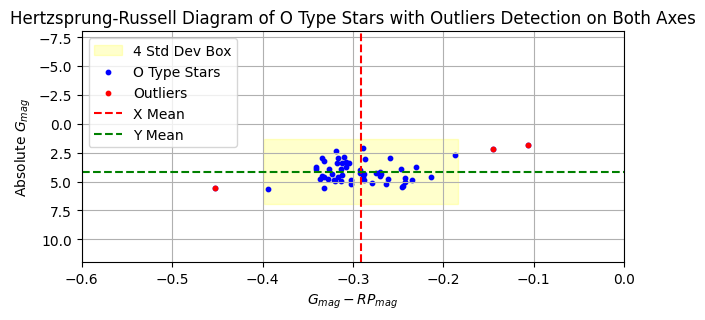


Outliers:
(3, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
14391,1237661416063369265,206.31443,54.461555,B2IV-V (176819),O5,0.426124,1562188358423644800,17.013575,16.964958,17.119453,1.869954,0.5
16591,1237655463232143415,186.48043,61.408140,O8/O9 (167771),O5,0.073696,1583302860031730048,16.776120,16.601303,17.228632,5.537131,0.5
19822,1237665356702416908,243.88664,55.072377,B2.5V (175426),O9,0.247989,1429411162454206208,16.873846,16.804163,17.018898,2.146911,0.9


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# Filter the dataframe to only contain O stars
df = above_df[above_df['spectral_type'].str.startswith('O')]

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates, y-coordinates
mean_x = np.mean(x_data)
print(mean_x)
std_dev_x = np.std(x_data)
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates, y-coordinates
threshold_x = 2 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower_bound_x: ", lower_bound_x)
print("upper_bound_x: ", upper_bound_x)


threshold_y = 3 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

plt.figure(figsize=(7, 3))

# Draw a rectangle around the region enclosed by 2 standard deviations in both x and y directions
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='4 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='blue', s=10, alpha=1, label='O Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=10, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of O Type Stars with Outliers Detection on Both Axes')
plt.xlim(-0.6, 0.0)
plt.ylim(-8, 12)
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

# Print results
print("\nOutliers:")
print(outliers.shape)
outliers

*   1237661416063369265: (rightest one) correct, by checking spectral plots!
*   1237655463232143415: (leftest one) correct, by comparing SDSS label!
*   1237665356702416908: (second rightest one): correct, by checking spectral plots!

## Remove B star Outliers

<ipython-input-28-310016587dc8>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-28-310016587dc8>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


mean_x:  -0.1773535231213873
lower_bound_x:  -0.48551150497298157
upper_bound_x:  0.13080445873020696


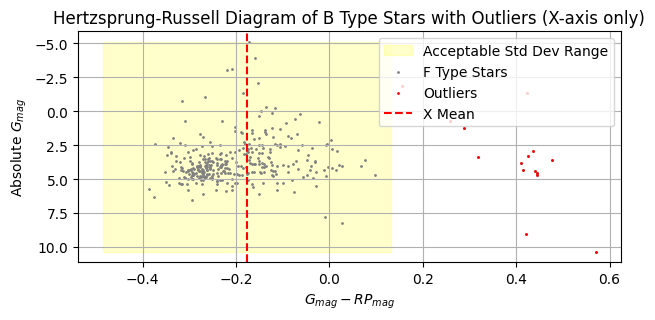

(15, 12)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

df = above_df[above_df['spectral_type'].str.startswith('B')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
print("mean_x: ", mean_x)
std_dev_x = np.std(x_data)

# Define a threshold for x-coordinates using 5 std
threshold_x = 2 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print('lower_bound_x: ', lower_bound_x)
print('upper_bound_x: ', upper_bound_x)

# Identify points outside the threshold range for x
outliers_x = df[(x_data < lower_bound_x) | (x_data > upper_bound_x)]

plt.figure(figsize=(7, 3))
# Shade the region within the acceptable standard deviation range
plt.fill_betweenx([min(y_data), max(y_data)], lower_bound_x, upper_bound_x, color='yellow', alpha=0.2, label='Acceptable Std Dev Range')

plt.scatter(x_data, y_data, color='grey', s=1, alpha=1, label='F Type Stars')
plt.scatter(outliers_x['g_mag'] - outliers_x['rp_mag'], outliers_x['abs_g_mag'], c='red', s=1, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of B Type Stars with Outliers (X-axis only)')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

print(outliers_x.shape)

In [ ]:
outliers_x['Gmag-RPmag'] = outliers_x['g_mag'] - outliers_x['rp_mag']
outliers_x

<ipython-input-71-7d5341727f79>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  outliers_x['Gmag-RPmag'] = outliers_x['g_mag'] - outliers_x['rp_mag']


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,Gmag-RPmag
2486,1237653613721944126,140.111930,54.187111,F2V (33256),B5,0.141276,1023203600959065728,16.418325,16.695410,15.974077,4.671805,1.5,0.444248
4485,1237657071695429672,26.098306,0.762960,B8IV (171301),B3,0.679049,2510338496804254080,17.311707,17.466930,17.054008,0.699742,1.3,0.257699
5766,1237657630587813944,135.674910,41.586767,B5 (338529),B8,0.235926,816590282174936704,16.372742,16.625507,15.962461,3.821832,1.8,0.410281
7022,1237663782600769544,31.898074,-1.118269,B5III (209419),B3,0.049110,2506454025303088640,15.836977,16.021294,15.518330,3.357291,1.3,0.318647
7553,1237657770174382095,155.110360,53.075864,CV,B9,0.057480,851753282506891776,16.814981,16.960253,16.394283,9.067381,1.9,0.420698
7683,1237663784202993670,12.734979,0.016141,F3/F5V (30743),B9,0.258681,2536887308864123136,16.001130,16.253160,15.576144,3.284478,1.9,0.424986
8026,1237657855532138511,165.701710,49.840426,F0II (25291),B9,0.262926,832831408946733952,15.846725,16.114462,15.424078,-1.335870,1.9,0.422647
9973,1237654383054225498,145.246000,56.416759,F0II (25291),B3,0.331115,1025172551406415872,16.302800,16.571285,15.863113,4.427818,1.3,0.439687
17407,1237679322851901462,13.377880,-5.283057,F2V (33256),B8,0.154430,2525535916460188672,15.924580,16.201510,15.479209,4.543089,1.8,0.445371
18809,1237663783664549918,9.220841,-0.366093,B9Vn (177756),B3,0.178319,2543139613017057920,17.612764,17.802662,17.324724,1.209420,1.3,0.288040


In [ ]:
a = chi_square_df[chi_square_df['Star_ID'] == 1237664667371634707]
filtered_columns_a = a.filter(like='O', axis=1).join(a.filter(like='B', axis=1)).join(a.filter(like='A', axis=1)).join(a.filter(like='F', axis=1)).join(a.filter(like='G', axis=1)).join(a.filter(like='K', axis=1)).join(a.filter(like='WD', axis=1))
filtered_columns_a

,O5,O7,O8,O9,B0,B1,B2,B3,B4,B5,...,WD0,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9
73391,4.452263,4.257598,5.370067,2.359941,1.327765,1.106585,0.773875,0.399933,0.477946,0.470649,...,11.61752,9.425253,9.978253,4.296832,1.624502,0.984668,2.275517,4.98946,7.522431,9.626718


In [ ]:
chi_square_df_allTemplates

a = chi_square_df_allTemplates[chi_square_df_allTemplates['Star_ID'] == 1237664667371634707]
# filtered_columns_a = a.filter(like='O', axis=1).join(a.filter(like='B', axis=1)).join(a.filter(like='A', axis=1)).join(a.filter(like='F', axis=1)).join(a.filter(like='G', axis=1)).join(a.filter(like='K', axis=1)).join(a.filter(like='WD', axis=1))
# filtered_columns_a
a

,Star_ID,A0,A1,A2,A2+F0,A2+F2,A3+F0,A3+F2,A3+F5,A3_+0.0_Dwarf,...,WD0,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9
73391,1237664667371634707,0.995728,1.425769,2.386144,2.824532,2.824888,3.711231,3.745607,3.677133,1.862431,...,11.61752,9.425253,9.978253,4.296832,1.624502,0.984668,2.275517,4.98946,7.522431,9.626718


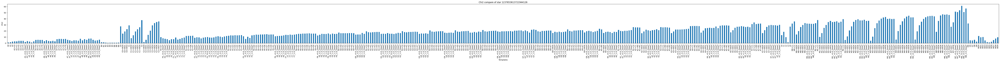

In [ ]:
# Transpose the DataFrame to have rows as columns and vice versa
transposed_df = a.transpose()
transposed_df = transposed_df[1:]
transposed_df.plot(kind='bar', legend=False, figsize = (100,4))
plt.xlabel('Templates')
plt.ylabel('Chi2')
plt.title('Chi2 compare of star 1237653613721944126')
plt.show()
# print('The farthest star from expected place that has Gmag-RPmag = 0.570723: SDSS-label: WDhotter, My Old Label: B3')
# print('My New Label: WD5')

## Remove A Stars Outliers

<ipython-input-29-e4fd5f1c268a>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-29-e4fd5f1c268a>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


0.34041779233226827
lower Bound:  -0.03631311723995123
upper bound:  0.7171487019044878


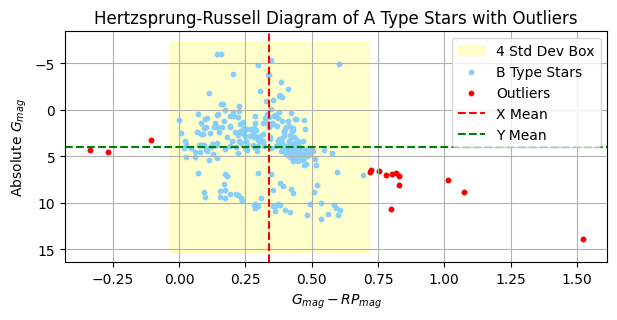


Outliers:
(15, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
2023,1237654657922302097,145.882930,54.137444,K3V (32147),A0,-0.000000,1021369993520790528,16.961697,17.591928,16.206087,6.591092,2.0
4377,1237654399689818280,168.201980,64.114165,K5Ve (118100),A0,-0.000000,1054861942336772224,16.824380,17.579470,15.994172,8.092887,2.0
7142,1237655368750006373,179.318270,61.402918,A1V (95418),A0,-0.000000,859030327199580416,17.171318,17.047440,17.438423,4.585686,2.0
9513,1237665531178320099,221.893820,22.095336,K5Ve (118100),A0,-0.000000,1241507648923607680,17.241026,17.959082,16.423584,6.770275,2.0
11223,1237667781758287992,178.279530,21.687478,K5Ve (118100),A0,-0.000000,4000451080592547456,16.594810,17.309530,15.790851,6.915976,2.0
14398,1237668297671966891,196.511560,19.373679,M1 (204445),A0,-0.000000,3941395628165222656,17.615828,18.491117,16.542461,8.806686,2.0
15848,1237661386007445961,247.149520,34.868848,K5Ve (118100),A0,-0.000000,1326247972150460928,16.799780,17.454773,16.074438,6.479079,2.0
17898,1237680075007262916,25.245626,26.215559,K4III (136726),A0,-0.000000,292613171234550912,17.199778,17.792137,16.481094,6.712512,2.0
18047,1237663916802179186,118.395860,51.101470,M5III (221615),A3_-1.0_Dwarf,5.352558,935983565480102656,17.440300,17.952997,16.639761,10.682686,2.3
18063,1237664879411265538,137.903580,27.877849,O8/O9 (167771),A0,-0.000000,698115121143554176,16.969620,16.809229,17.307497,4.356673,2.0


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('A')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
print(mean_x)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 2 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower Bound: ", lower_bound_x)
print("upper bound: ", upper_bound_x)

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 3.5 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(7, 3))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='4 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='lightskyblue', s=10, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=10, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of A Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()
print("\nOutliers:")
print(outliers.shape)
outliers

<ipython-input-104-b2f11060530e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-104-b2f11060530e>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


0.4317111345735941
lower Bound:  0.3322114051346634
upper bound:  0.5312108640125248


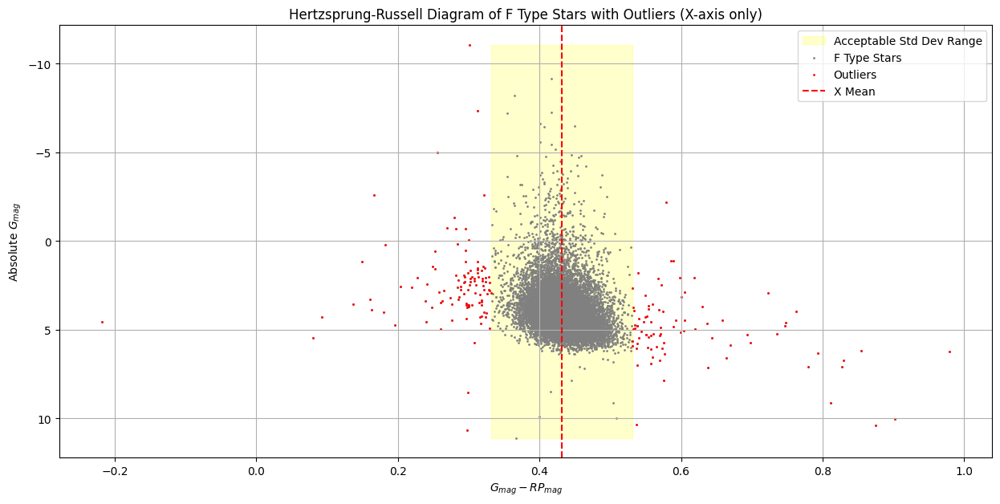


Outliers (X-axis only):
(191, 12)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

df = above_df[above_df['spectral_type'].str.startswith('F')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
print(mean_x)
std_dev_x = np.std(x_data)

# Define a threshold for x-coordinates using 5 std
threshold_x = 3 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower Bound: ", lower_bound_x)
print("upper bound: ", upper_bound_x)

# Identify points outside the threshold range for x
outliers_x = df[(x_data < lower_bound_x) | (x_data > upper_bound_x)]

plt.figure(figsize=(15, 7))
# Shade the region within the acceptable standard deviation range
plt.fill_betweenx([min(y_data), max(y_data)], lower_bound_x, upper_bound_x, color='yellow', alpha=0.2, label='Acceptable Std Dev Range')

plt.scatter(x_data, y_data, color='grey', s=1, alpha=1, label='F Type Stars')
plt.scatter(outliers_x['g_mag'] - outliers_x['rp_mag'], outliers_x['abs_g_mag'], c='red', s=1, label='Outliers')
plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of F Type Stars with Outliers (X-axis only)')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()

print("\nOutliers (X-axis only):")
print(outliers_x.shape)

<ipython-input-31-2337178e4ae3>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-31-2337178e4ae3>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


0.4843514807747904
lower Bound:  0.31604066780869156
upper bound:  0.6526622937408892


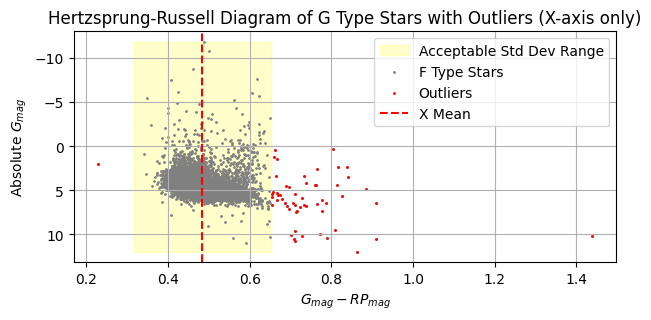

(56, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
230,1237646795985717080,111.207120,-0.784403,K3V (32147),G7_-1.0_Dwarf,0.187395,3110327256055585152,17.287315,17.879010,16.558400,5.902129,4.7
1849,1237648720677437495,142.471020,-0.599246,K3V (32147),G7_-1.0_Dwarf,0.202529,3840493480443536128,16.470910,17.122677,15.692884,7.404421,4.7
1962,1237654653644505182,142.007290,52.575500,F8V (30562),G3_-0.5_Dwarf,0.080733,1019639087339972736,17.401836,17.277075,16.493637,6.486355,4.3
2327,1237651495760953424,126.209860,51.248993,K3V (32147),G6_+0.5_Dwarf,0.208165,1028275510658813568,16.076262,16.646938,15.369547,6.412918,4.6
2587,1237658203431174246,162.752800,46.730186,G8V (101501),G7_-1.0_Dwarf,0.036489,831259618419361792,16.894915,17.058268,16.131630,4.416590,4.7
2667,1237657069548798003,28.105786,-0.969060,M5III (221615),G7_-1.0_Dwarf,5.018136,2506120327818999936,17.291700,17.866383,16.427681,11.997542,4.7
3478,1237648721750524126,141.035450,0.358444,K3V (32147),G7_-1.0_Dwarf,0.215321,3843858054743965184,17.604721,18.180996,16.891788,7.417515,4.7
4144,1237657189814042844,320.216570,-0.974290,M4.5:III (123657),G9_-1.0_Dwarf,3.604122,2686185285515993984,17.366426,17.769184,16.657250,10.539820,4.9
4263,1237652900236754999,58.850224,-6.177828,G4V (32923),G4_-0.5_Dwarf,0.029201,3244974893097056896,15.223412,15.508534,14.527524,7.109488,4.4
4301,1237654881264992274,194.520040,5.660446,M5III (221615),G7_-1.0_Dwarf,4.584400,3706062722067020032,17.074322,17.467505,16.362724,9.632001,4.7


In [ ]:
df = above_df[above_df['spectral_type'].str.startswith('G')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
print(mean_x)
std_dev_x = np.std(x_data)

# Define a threshold for x-coordinates using 5 std
threshold_x = 3 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower Bound: ", lower_bound_x)
print("upper bound: ", upper_bound_x)

# Identify points outside the threshold range for x
outliers_x = df[(x_data < lower_bound_x) | (x_data > upper_bound_x)]

# Plotting
plt.figure(figsize=(7, 3))

# Shade the region within the acceptable standard deviation range
plt.fill_betweenx([min(y_data), max(y_data)], lower_bound_x, upper_bound_x, color='yellow', alpha=0.2, label='Acceptable Std Dev Range')

plt.scatter(x_data, y_data, color='grey', s=1, alpha=1, label='F Type Stars')
plt.scatter(outliers_x['g_mag'] - outliers_x['rp_mag'], outliers_x['abs_g_mag'], c='red', s=1, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of G Type Stars with Outliers (X-axis only)')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()
print(outliers_x.shape)
outliers_x

<ipython-input-32-d327c9bdc422>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-32-d327c9bdc422>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


0.743631782488114
lower Bound:  0.47142171046512227
upper bound:  1.0158418545111059


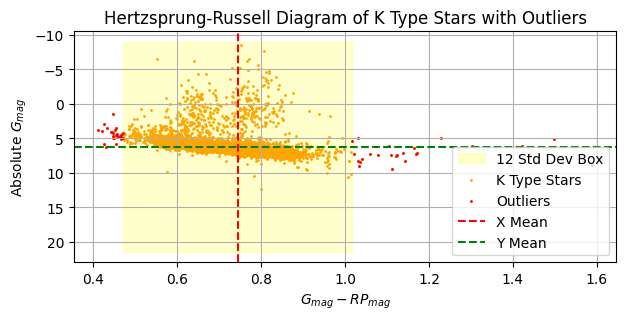

(52, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
193,1237646795985650048,111.066040,-0.818847,K5Ve (118100),K5_-0.5_Dwarf,0.126689,3110326190903795456,16.301167,16.726562,15.283936,5.354010,5.5
451,1237649918968528914,21.556033,13.712005,G0 (63791),K3_-2.0_Dwarf,0.072845,2590171046799739776,16.005068,16.310543,15.534358,4.922799,5.3
3020,1237657587095699483,35.693363,0.825776,F3/F5V (30743),K5_-2.0_Dwarf,2.291421,2501486607862378752,17.227005,17.497774,16.814693,3.728895,5.5
3202,1237657189835931760,10.158763,-0.946463,M1 (204445),K7_-0.5_Dwarf,1.866432,2530846420182992128,16.407627,17.404581,15.295929,9.425081,5.7
4932,1237648720130474863,119.473450,-0.995309,K3V (32147),K4_+0.0_Dwarf,0.049994,3083847614442494336,17.320435,17.401140,16.090933,5.004489,5.4
4965,1237657070625751076,35.386578,-0.094712,F8V (30562),K7_-0.5_Dwarf,1.627946,2500852979927152256,16.584415,16.892078,16.127745,4.428942,5.7
6076,1237658801506418840,205.341660,52.840241,K5Ve (118100),K5_+1.0_Dwarf,0.066372,1560872174285881344,17.186323,17.592232,16.021608,6.335735,5.5
6744,1237663277926908025,357.980870,0.513569,K5Ve (118100),K7_+0.5_Dwarf,0.056693,2642341911465575808,17.410656,17.985064,16.376492,8.968048,5.7
6968,1237661358617133210,181.549160,48.405615,K3V (32147),K4_+0.0_Dwarf,0.053453,1546291997271618432,17.226387,17.078108,15.804835,6.058079,5.4
7482,1237660343923835339,117.479940,22.725061,K3V (32147),K3_-1.5_Dwarf,0.172471,675259057541805056,17.346645,17.447908,16.209372,7.163223,5.3


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('K')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
print(mean_x)
std_dev_x = np.std(x_data)

# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 3 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower Bound: ", lower_bound_x)
print("upper bound: ", upper_bound_x)

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 10 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(7, 3))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='12 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='orange', s=1, alpha=1, label='K Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=1, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of K Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()
print(outliers.shape)
outliers

<ipython-input-33-f12ae6cf4110>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.replace([np.inf, -np.inf], np.nan, inplace=True)
<ipython-input-33-f12ae6cf4110>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.dropna(inplace=True)


1.123722229750382
lower Bound:  0.5651581919346016
upper bound:  1.6822862675661623


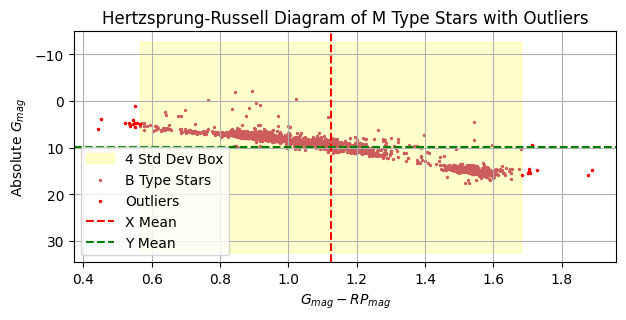

(22, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
2048,1237658493337207260,143.235350,8.036071,Ldwarf,M9,0.063162,587844820820234496,17.996070,20.743748,16.291710,14.929144,6.9
3368,1237658613596946503,188.011510,50.450008,M4.5:III (123657),M3_+0.0_Dwarf,0.055870,1544649155096644480,17.656929,18.354898,15.943829,9.505883,6.3
10789,1237655503497462477,255.760530,35.973427,Ldwarf,M9,0.173209,1339277180644102272,19.672651,21.808613,17.987648,15.808304,6.9
12045,1237659131669512444,208.688980,52.090866,M6III (148783),M8_-0.5_Dwarf,0.107191,1512602789193557888,19.302540,20.944998,17.414410,14.904982,6.8
12500,1237661069247448253,148.076250,11.837848,Ldwarf,M9,0.083625,613266186783749376,19.883064,22.072502,18.175486,15.516578,6.9
14851,1237666275272622208,13.719715,24.917480,F3/F5V (30743),M9,4.179052,2804827430580521472,16.072233,16.353374,15.620804,3.837398,6.9
18643,1237662194530517165,197.347470,41.649874,Ldwarf,M9,0.038382,1525950241879549056,19.365097,21.329216,17.663666,15.368843,6.9
19209,1237663784213479438,36.691365,0.062969,K0V (10780),M0_-0.5_Dwarf,0.955900,2500437978712008576,16.441597,16.845978,15.883578,4.786786,6.0
19211,1237663784213610637,37.073308,0.065233,G0 (63791),M0_-0.5_Dwarf,1.440969,2500429216978727296,16.774841,17.134111,16.253925,4.796511,6.0
19240,1237663784213676159,37.172815,0.179253,K0V (10780),M0_-0.5_Dwarf,1.426721,2500453921630675584,17.554056,17.939970,17.016693,5.158438,6.0


In [ ]:
# Filter the dataframe to only contain B stars
df = above_df[above_df['spectral_type'].str.startswith('M')]
df.replace([np.inf, -np.inf], np.nan, inplace=True)
df.dropna(inplace=True)

x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Calculate mean and standard deviation for x-coordinates
mean_x = np.mean(x_data)
std_dev_x = np.std(x_data)
print(mean_x)
# Calculate mean and standard deviation for y-coordinates
mean_y = np.mean(y_data)
std_dev_y = np.std(y_data)

# Define a threshold for x-coordinates using 3.5 std
threshold_x = 2 * std_dev_x
lower_bound_x = mean_x - threshold_x
upper_bound_x = mean_x + threshold_x
print("lower Bound: ", lower_bound_x)
print("upper bound: ", upper_bound_x)

# Define a threshold for y-coordinates using 3.5 std
threshold_y = 7 * std_dev_y
lower_bound_y = mean_y - threshold_y
upper_bound_y = mean_y + threshold_y

# Identify points outside the threshold range for either x or y
outliers = df[(x_data < lower_bound_x) | (x_data > upper_bound_x) | (y_data < lower_bound_y) | (y_data > upper_bound_y)]

# Plotting
plt.figure(figsize=(7, 3))

# Draw a rectangle around the region enclosed by 8 standard deviations in both x and y directions (since it's 4 on either side)
rect = Rectangle((lower_bound_x, lower_bound_y), threshold_x * 2, threshold_y * 2, linewidth=1, edgecolor='yellow', facecolor='yellow', alpha=0.2, label='4 Std Dev Box')
plt.gca().add_patch(rect)

plt.scatter(x_data, y_data, color='indianred', s=2, alpha=1, label='B Type Stars')
plt.scatter(outliers['g_mag'] - outliers['rp_mag'], outliers['abs_g_mag'], c='red', s=2, label='Outliers')

plt.axvline(mean_x, color='r', linestyle='dashed', label='X Mean')
plt.axhline(mean_y, color='g', linestyle='dashed', label='Y Mean')

plt.xlabel('$G_{mag} - RP_{mag}$')
plt.ylabel('Absolute $G_{mag}$')
plt.title('Hertzsprung-Russell Diagram of M Type Stars with Outliers')
plt.gca().invert_yaxis()
plt.legend()
plt.grid()
plt.show()
print(outliers.shape)
outliers.head(50)

## Main sequence analysis (filter out stars based on ranges):

(36055, 12)


<ipython-input-20-b6324429ffd8>:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


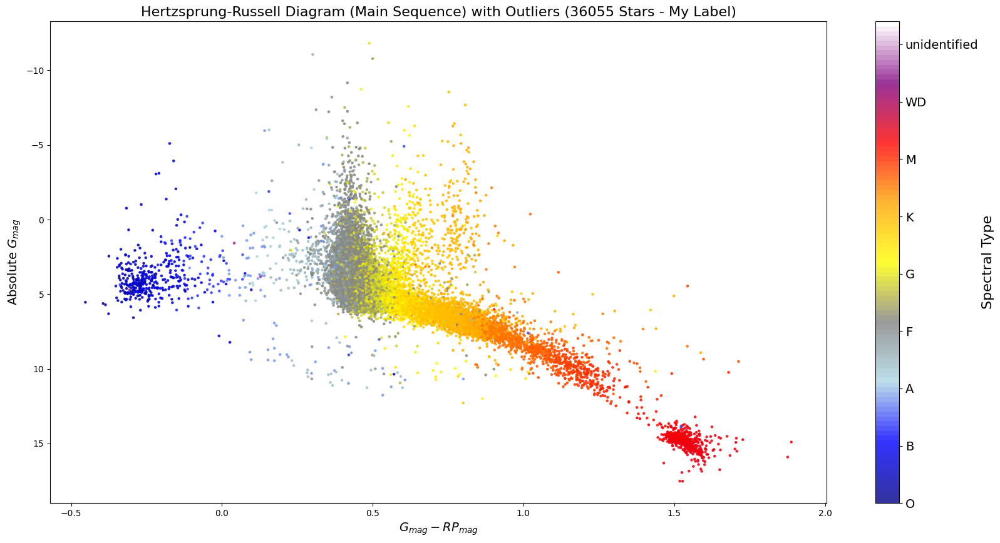

In [ ]:
# import pandas as pd
# import matplotlib.pyplot as plt
# import numpy as np
# from matplotlib.colors import LinearSegmentedColormap

df = above_df
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'white']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram (Main Sequence) with Outliers (36055 Stars - My Label)', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=14)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

<ipython-input-143-0fd1bf6c3bf4>:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(row, ignore_index=True)


df shape:  (35701, 12)
outlier shape:  (354, 12)


<ipython-input-143-0fd1bf6c3bf4>:44: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


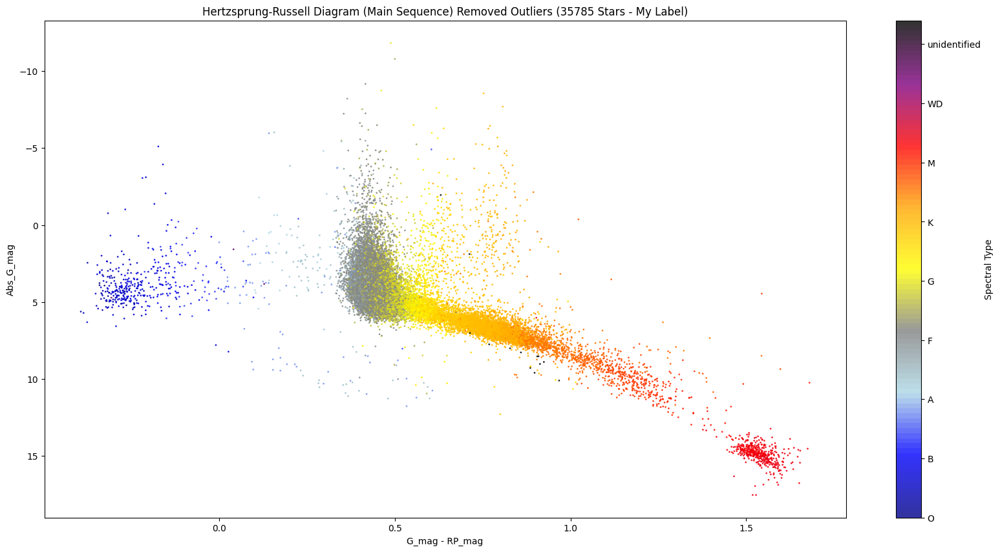

In [ ]:
df = above_df

ranges = {
    'O': (-0.39820819815290315, -0.1838010382107333),  # 2std
    'B': (-0.48551150497298157, 0.13080445873020696),  # 2std
    'A': (-0.03631311723995123, 0.7171487019044878),  # 2std
    # 'F': (0.29904482865501986, 0.5643774404921684), # 4std
    'F': (0.3322114051346634, 0.5312108640125248), # 3std
    'G': (0.31604066780869156, 0.6526622937408892), # 3std
    'K': (0.47142171046512227, 1.0158418545111059), # 3std
    'M': (0.5651581919346016, 1.6822862675661623), # 2Std
}
outliers = pd.DataFrame(columns=df.columns) # DataFrame to store the outliers

# Function to filter based on the ranges
def filter_rows(row):
    spectral_type = row['spectral_type'][0]  # Take only the first character
    g_rp_mag = row['g_mag'] - row['rp_mag']
    lower_bound, upper_bound = ranges.get(spectral_type, (float('-inf'), float('inf')))  # Default to keeping the row if the spectral type is not recognized
    if lower_bound <= g_rp_mag <= upper_bound:
        return True
    else:
        global outliers
        outliers = outliers.append(row, ignore_index=True)
        return False

df = df[df.apply(filter_rows, axis=1)]
print('df shape: ', df.shape)  # Print the shape of the filtered DataFrame
print('outlier shape: ', outliers.shape)  # Print the shape of the outliers DataFrame

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'black']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('G_mag - RP_mag')
plt.ylabel('Abs_G_mag')
plt.title('Hertzsprung-Russell Diagram (Main Sequence) Removed Outliers (35785 Stars - My Label)')
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type')
cbar.set_ticklabels(cbar_labels)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

In [ ]:
filtered_outliers_158 = outliers[outliers['subclass'].str[0] == outliers['spectral_type'].str[0]]
filtered_outliers_158 = filtered_outliers_158.reset_index(drop=True)
# filtered_outliers_158.to_csv('resulting_labels_aboveDf_consistent_158.csv', index=False)
print(filtered_outliers_158.shape)
filtered_outliers_158

In [ ]:
filtered_outliers_196 = outliers[outliers['subclass'].str[0] != outliers['spectral_type'].str[0]]
filtered_outliers_196 = filtered_outliers_196.reset_index(drop=True)
filtered_outliers_196["g_mag - rp_mag"] = filtered_outliers_196["g_mag"] - filtered_outliers_196["rp_mag"]
print(filtered_outliers_196.shape)
filtered_outliers_196

In [ ]:
# Mean values for different star types
mean_values = {
    "O": -0.2910046181818182, "B": -0.1773535231213873, "A": 0.34041779233226827,
    "F": 0.4317111345735941, "G": 0.4843514807747904, "K": 0.743631782488114, "M": 1.123722229750382,
}

# Function to determine the closest mean value
def closest_mean(value):
    return min(mean_values, key=lambda x: abs(mean_values[x] - value))

# Add a new column based on the closest mean value
filtered_outliers_196["expected label (closest mean value)"] = filtered_outliers_196["g_mag - rp_mag"].apply(closest_mean)
filtered_outliers_196

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,g_mag - rp_mag,expected label (closest mean value)
0,1237648722854150273,209.280620,1.081811,B2III (35468),F0_-1.5_Dwarf,0.262723,3663858273176025728,17.217527,17.287395,17.080820,3.562756,3.0,0.136707,A
1,1237648702972821583,197.936440,-1.204486,A8V (155514),F3_-0.5_Dwarf,0.043242,3685818032938938752,16.786236,16.945860,16.521645,2.801400,3.3,0.264591,A
2,1237649961385394192,59.204497,-6.908660,A4V (97603),F1_-0.5_Dwarf,0.044812,3244857279712754688,16.144089,16.337912,15.830740,2.027439,3.1,0.313349,A
3,1237646795985717080,111.207120,-0.784403,K3V (32147),G7_-1.0_Dwarf,0.187395,3110327256055585152,17.287315,17.879010,16.558400,5.902129,4.7,0.728915,K
4,1237648704047153267,199.312070,-0.222459,G4V (32923),F5_-0.5_Dwarf,0.162675,3687499422440201600,17.243000,17.620485,16.666403,6.371104,3.5,0.576597,G
5,1237648704047218709,199.370820,-0.236734,G4V (32923),F8_+0.0_Dwarf,0.076225,3687498739541096576,15.818288,16.241865,15.219562,2.066725,3.8,0.598726,G
6,1237649918968528914,21.556033,13.712005,G0 (63791),K3_-2.0_Dwarf,0.072845,2590171046799739776,16.005068,16.310543,15.534358,4.922799,5.3,0.470710,G
7,1237648704593657999,221.312200,0.046901,CV,F0_-2.0_Dwarf,0.083263,3651520309603373440,17.349663,17.418564,17.200983,1.178006,3.0,0.148680,A
8,1237648720165404727,199.188070,-0.851859,A4V (97603),F1_-0.5_Dwarf,0.241283,3686598956777262336,16.854170,16.973886,16.634666,2.592552,3.1,0.219504,A
9,1237648720701227104,196.859170,-0.485457,A2II (39866),F5_-1.5_Dwarf,0.043153,3686163073431523840,16.368544,16.551188,16.059107,2.942092,3.5,0.309437,A


In [ ]:
# obtain the chi2 table of these 162 stars
chi_square_df_196 = chi_square_df_allTemplates_38067[chi_square_df_allTemplates_38067['Star_ID'].isin(filtered_outliers_196['ID'])]
chi_square_df_196 = chi_square_df_196.reset_index(drop=True)
chi_square_df_196

In [ ]:
# filter out binary stars
with open('/content/drive/MyDrive/AstroResearch/new_data_table/templates_names.txt', 'r') as file:
    nonBinary_star_names = file.readlines()
nonBinary_star_names = [s.strip() for s in nonBinary_star_names]
nonBinary_star_names.append('Star_ID')

# filter out the binary stars' templates
chi_square_df_196 = chi_square_df_196[nonBinary_star_names]

# # filter out L3 dwarfs
# columns_to_drop = ['L0','L1', 'L2','L3', 'L6']
# chi_square_df_196 = chi_square_df_196.drop(columns=columns_to_drop)
chi_square_df_196

In [ ]:
chi_square_df_196['Star_ID'] = chi_square_df_196['Star_ID'].astype(str)

df = chi_square_df_196
results_196 = {}  # Dictionary to store results

for index, row in df.iterrows():
    star_id = row['Star_ID']
    chi2_values = row.drop('Star_ID').to_dict()

    # Sort the chi2_values and take the smallest half
    sorted_chi2_values = sorted(chi2_values.items(), key=lambda x: x[1])
    half_length = len(sorted_chi2_values) // 2  # Integer division to get half the number
    selected_templates = sorted_chi2_values[:half_length]

    # Extract the template labels (keys) for the selected chi2 values
    plausible_templates = [label for label, chi2 in selected_templates]
    results_196[star_id] = plausible_templates

results_196

In [ ]:
filtered_results_196 = {}

for _, row in filtered_outliers_196.iterrows():
    star_id = str(row['ID'])
    expected_label = row['expected label (closest mean value)']

    if star_id in results_196:
        expected_templates = [template for template in results_196[star_id] if template.startswith(expected_label)]
        filtered_results_196[star_id] = expected_templates

print(len(filtered_outliers_196))
filtered_outliers_196

196


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,g_mag - rp_mag,expected label (closest mean value)
0,1237648722854150273,209.280620,1.081811,B2III (35468),F0_-1.5_Dwarf,0.262723,3663858273176025728,17.217527,17.287395,17.080820,3.562756,3.0,0.136707,A
1,1237648702972821583,197.936440,-1.204486,A8V (155514),F3_-0.5_Dwarf,0.043242,3685818032938938752,16.786236,16.945860,16.521645,2.801400,3.3,0.264591,A
2,1237649961385394192,59.204497,-6.908660,A4V (97603),F1_-0.5_Dwarf,0.044812,3244857279712754688,16.144089,16.337912,15.830740,2.027439,3.1,0.313349,A
3,1237646795985717080,111.207120,-0.784403,K3V (32147),G7_-1.0_Dwarf,0.187395,3110327256055585152,17.287315,17.879010,16.558400,5.902129,4.7,0.728915,K
4,1237648704047153267,199.312070,-0.222459,G4V (32923),F5_-0.5_Dwarf,0.162675,3687499422440201600,17.243000,17.620485,16.666403,6.371104,3.5,0.576597,G
5,1237648704047218709,199.370820,-0.236734,G4V (32923),F8_+0.0_Dwarf,0.076225,3687498739541096576,15.818288,16.241865,15.219562,2.066725,3.8,0.598726,G
6,1237649918968528914,21.556033,13.712005,G0 (63791),K3_-2.0_Dwarf,0.072845,2590171046799739776,16.005068,16.310543,15.534358,4.922799,5.3,0.470710,G
7,1237648704593657999,221.312200,0.046901,CV,F0_-2.0_Dwarf,0.083263,3651520309603373440,17.349663,17.418564,17.200983,1.178006,3.0,0.148680,A
8,1237648720165404727,199.188070,-0.851859,A4V (97603),F1_-0.5_Dwarf,0.241283,3686598956777262336,16.854170,16.973886,16.634666,2.592552,3.1,0.219504,A
9,1237648720701227104,196.859170,-0.485457,A2II (39866),F5_-1.5_Dwarf,0.043153,3686163073431523840,16.368544,16.551188,16.059107,2.942092,3.5,0.309437,A


In [ ]:
filtered_results_Non_empty = {star_id: templates for star_id, templates in filtered_results_196.items() if templates}
print(len(filtered_results_Non_empty))
filtered_results_Non_empty

In [ ]:
# Empty dictionary to store the resulting labels
resulting_labels_196 = {}

# Iterate over each row in the dataframe
for index, row in chi_square_df_196.iterrows():
    star_id = row['Star_ID']

    # Check if the Star_ID is in the filtered_results_Non_empty dictionary
    if star_id in filtered_results_Non_empty:

        # Get the chi2 values only for the spectral types listed in the dictionary for this Star_ID
        relevant_chi2_values = {spec_type: row[spec_type] for spec_type in filtered_results_Non_empty[star_id]}

        # Get the spectral type with the minimum chi2 value
        best_fit_label = min(relevant_chi2_values, key=relevant_chi2_values.get)

        # Store in the resulting_labels dictionary
        resulting_labels_196[star_id] = best_fit_label

# Print out the resulting labels (or you can save/export as needed)
print(len(resulting_labels_196))
resulting_labels_196

In [ ]:
df_resulting_labels_196 = pd.DataFrame(list(resulting_labels_196.items()), columns=['Star_ID', 'Spectral_Label'])
df_resulting_labels_196

,Star_ID,Spectral_Label
0,1237664093439066207,K0_-1.0_Dwarf
1,1237655129845399891,A9_-1.0_Dwarf
2,1237667113871933463,A1
3,1237680479272763545,K0_-2.0_Dwarf
4,1237662701861273614,A9_-1.0_Dwarf
5,1237654954279043100,A9_-1.0_Dwarf
6,1237659161203245167,A9_-1.0_Dwarf
7,1237649919505465354,G7_-2.0_Dwarf
8,1237669763863347333,K0_-2.0_Dwarf
9,1237661417670049804,A9_-1.0_Dwarf


## White Dwarf Analysis

In [ ]:
print(chi_square_df_allTemplates_38067.shape)

# filter out binary stars
with open('/content/drive/MyDrive/AstroResearch/new_data_table/templates_names.txt', 'r') as file:
    nonBinary_star_names = file.readlines()
nonBinary_star_names = [s.strip() for s in nonBinary_star_names]
nonBinary_star_names.append('Star_ID')

# filter out the binary stars' templates
chi_square_df_allTemplates_38067 = chi_square_df_allTemplates_38067[nonBinary_star_names]
# filter out L3 dwarfs
columns_to_drop = ['L0','L1', 'L2','L3', 'L6']# change the second braket
chi_square_df_allTemplates_38067 = chi_square_df_allTemplates_38067.drop(columns=columns_to_drop)
print(chi_square_df_allTemplates_38067.shape)
chi_square_df_allTemplates_38067.head(5)

(38067, 469)
(38067, 237)


,A0,A1,A2,A3_+0.0_Dwarf,A3_+0.5_Dwarf,A3_-0.5_Dwarf,A3_-1.0_Dwarf,A4_-1.0_Dwarf,A6_+0.0_Dwarf,A6_+0.5_Dwarf,...,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9,Star_ID
0,2.391024,3.744891,5.196113,1.804961,2.756053,2.353616,0.667835,2.234717,0.647360,1.205326,...,50.366942,52.615701,33.627864,21.528537,11.310041,3.870518,0.819745,0.139705,0.142904,1237661138490949678
2,7.439884,14.764115,32.745235,7.399509,22.134302,12.766920,2.079694,12.913567,5.021675,14.657124,...,191.646641,199.211933,134.318431,91.700294,54.468738,27.051306,13.096557,7.021517,4.215967,1237661133662191634
4,7.609563,14.866814,30.267828,7.750695,20.920760,13.015003,2.266533,13.097405,5.273173,13.976244,...,167.916081,174.329869,120.084291,83.980351,51.480720,26.197781,12.886728,7.154543,4.291901,1237661384380121097
5,5.194555,9.564738,16.498159,4.943238,10.702576,7.572667,1.573852,7.466731,2.901377,6.577664,...,106.964409,111.281847,74.696164,50.721984,29.685597,13.763012,5.829063,2.696305,1.288648,1237661125617647618
6,4.471788,8.218671,14.820273,4.054481,9.233516,6.349280,1.251097,6.245865,2.158718,5.178976,...,107.203342,111.620864,74.337802,50.003130,28.562715,12.116128,4.284547,1.589042,0.562687,1237661384379793493


In [ ]:
# Filter out rows that don't start with "WD"
below_df_NonWD = below_df[~below_df['spectral_type'].str.startswith("WD")]
below_df_NonWD.reset_index(drop=True, inplace=True)

# Get rows that start with "WD"
below_df_WD = below_df[below_df['spectral_type'].str.startswith("WD")]

print(below_df_NonWD.shape)
print(below_df_WD.shape)
below_df_NonWD.head(5)

(1490, 12)
(522, 12)


,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
0,1237648702979702841,213.61030,-1.231856,CalciumWD,A6_+0.0_Dwarf,0.227732,3647680024725171968,17.825760,17.897758,17.708477,12.645525,2.6
1,1237651065205096471,181.77882,64.013161,F3/F5V (30743),G4_-2.0_Dwarf,0.034279,1584592866343960704,17.576080,17.557215,16.841711,NaN,4.4
2,1237648702972624921,197.42373,-1.251747,WDhotter,A3_-1.0_Dwarf,0.292996,3685854179383579136,16.050903,15.990253,16.209925,10.981401,2.3
3,1237648720691396718,174.40987,-0.456017,WDcooler,G4_-0.5_Dwarf,0.381747,3794250907597538432,17.852987,17.941734,17.686113,12.717910,4.4
4,1237648720688447556,167.66393,-0.511219,WDhotter,B5,0.316101,3803915958403003136,16.994528,16.987963,17.091835,11.511063,1.5


In [ ]:
chi_square_df_allTemplates = pd.read_csv('/content/drive/MyDrive/AstroResearch/new_data_table/chi_square_df_All_final.csv')
# filter rows
chi_square_df_allTemplates_1490 = chi_square_df_allTemplates[chi_square_df_allTemplates['Star_ID'].isin(below_df_NonWD['ID'])]


#filter columns
with open('/content/drive/MyDrive/AstroResearch/new_data_table/templates_names.txt', 'r') as file:
    nonBinary_star_names = file.readlines()
nonBinary_star_names = [s.strip() for s in nonBinary_star_names]
nonBinary_star_names.append('Star_ID')
# filter out the binary stars' templates
chi_square_df_allTemplates_1490 = chi_square_df_allTemplates_1490[nonBinary_star_names]
# filter out L3 dwarfs
columns_to_drop = ['L0','L1', 'L2','L3', 'L6']
chi_square_df_allTemplates_1490 = chi_square_df_allTemplates_1490.drop(columns=columns_to_drop)
chi_square_df_allTemplates_1490.head(5)


chi_square_df_allTemplates_1490 = chi_square_df_allTemplates_1490.reset_index(drop=True)
print(chi_square_df_allTemplates_1490.shape)
chi_square_df_allTemplates_1490.head(5)

(1490, 237)


,A0,A1,A2,A3_+0.0_Dwarf,A3_+0.5_Dwarf,A3_-0.5_Dwarf,A3_-1.0_Dwarf,A4_-1.0_Dwarf,A6_+0.0_Dwarf,A6_+0.5_Dwarf,...,WD1,WD2,WD3,WD4,WD5,WD6,WD7,WD8,WD9,Star_ID
0,5.566664,11.143479,23.734376,5.317172,15.215337,9.161981,1.492171,9.130935,3.082197,9.029243,...,158.123720,164.518793,111.084435,75.747451,44.256424,19.808062,7.829803,3.342428,1.446459,1237665129082388513
1,5.698769,11.274159,22.925491,5.514031,14.991068,9.293273,1.588525,9.296894,3.308549,9.132289,...,146.183553,151.994345,103.394968,71.093638,41.935696,19.208757,7.973697,3.619383,1.760001,1237666216225931475
2,5.653813,10.745711,20.567765,5.345780,13.328646,8.664439,1.585716,8.541596,3.222152,8.207556,...,133.650440,139.066203,93.124649,62.964848,36.613082,16.852081,7.114647,3.261140,1.601999,1237678617423970324
3,21.064178,43.580267,266.294630,21.321304,199.579299,48.342370,4.880637,52.633966,19.579478,152.386321,...,1195.015521,1238.780158,859.998073,608.899196,388.285015,230.796430,144.628639,100.023328,77.353556,1237678618507739147
4,7.089070,13.773724,27.151924,7.173161,18.720279,11.887439,2.125963,11.903886,4.784445,12.359639,...,153.497068,159.495930,109.542215,76.367865,46.529813,23.359400,11.277951,6.112464,3.563692,1237667211050221573


In [ ]:
values = below_df_NonWD['spectral_type'].value_counts()
values_df = pd.DataFrame({'spectral_type': values.index, 'count': values.values}) # Convert the Series to a DataFrame
pd.set_option('display.max_rows', None) # Set options to display all rows when printing
print(values_df)

In [ ]:
chi_square_df_allTemplates_1490['Star_ID'] = chi_square_df_allTemplates_1490['Star_ID'].astype(str)

df = chi_square_df_allTemplates_1490
results = {}  # Dictionary to store results

for index, row in df.iterrows():
    star_id = row['Star_ID']
    chi2_values = row.drop('Star_ID').to_dict()

    # Sort the chi2_values and take the smallest half
    sorted_chi2_values = sorted(chi2_values.items(), key=lambda x: x[1])
    half_length = len(sorted_chi2_values) // 2  # Integer division to get half the number
    selected_templates = sorted_chi2_values[:half_length]

    # Extract the template labels (keys) for the selected chi2 values
    plausible_templates = [label for label, chi2 in selected_templates]
    results[star_id] = plausible_templates

results

In [ ]:
# Sample dictionary with values as lists
original_dict = results

# Create a new dictionary with lengths of the original lists
length_dict = {key: len(value) for key, value in original_dict.items()}
length_dict

In [ ]:
filtered_results = {}
for star_id, templates in results.items():
    wd_templates = [template for template in templates if template.startswith("WD")]
    filtered_results[star_id] = wd_templates
filtered_results

In [ ]:
# Assuming your dictionary is named results
empty_list_count = 0

for templates in filtered_results.values():
    if not templates:  # Check if the list is empty
        empty_list_count += 1
print(empty_list_count)

93


In [ ]:
# Empty dictionary to store the resulting labels
resulting_labels = {}

# Iterate over each row in the dataframe
for index, row in chi_square_df_allTemplates_1490.iterrows():
    star_id = row['Star_ID']

    # Check if the Star_ID is in the filtered_results_Non_empty dictionary
    if star_id in filtered_results_Non_empty:

        # Get the chi2 values only for the spectral types listed in the dictionary for this Star_ID
        relevant_chi2_values = {spec_type: row[spec_type] for spec_type in filtered_results_Non_empty[star_id]}

        # Get the spectral type with the minimum chi2 value
        best_fit_label = min(relevant_chi2_values, key=relevant_chi2_values.get)

        # Store in the resulting_labels dictionary
        resulting_labels[star_id] = best_fit_label

# Print out the resulting labels (or you can save/export as needed)
print(len(resulting_labels))
print(resulting_labels)

1397
{'1237665129082388513': 'WD9', '1237666216225931475': 'WD9', '1237678617423970324': 'WD9', '1237665369580568702': 'WD4', '1237651539261456758': 'WD9', '1237665355618975751': 'WD9', '1237680285998317777': 'WD9', '1237648702979702841': 'WD7', '1237648702972624921': 'WD6', '1237648673987231888': 'WD7', '1237648702984093777': 'WD6', '1237648702985666734': 'WD3', '1237648703517360150': 'WD7', '1237648705666613307': 'WD6', '1237648703523389514': 'WD5', '1237648704053313583': 'WD7', '1237648704060719283': 'WD3', '1237648704583499813': 'WD9', '1237648704584089621': 'WD3', '1237648704585465902': 'WD6', '1237648720139255893': 'WD3', '1237648720140435481': 'WD8', '1237648720164552759': 'WD4', '1237648720166780979': 'WD5', '1237648720684777493': 'WD8', '1237648720688447556': 'WD5', '1237648720694542350': 'WD8', '1237648720712826921': 'WD6', '1237648720714989688': 'WD6', '1237648721210376215': 'WD5', '1237648721217519643': 'WD6', '1237648721222959220': 'WD6', '1237648721237573645': 'WD6', '123

In [ ]:
# Convert the dictionary to a DataFrame
df_resulting_labels = pd.DataFrame(list(resulting_labels.items()), columns=['Star_ID', 'Spectral_Label'])

# Save the DataFrame to a CSV file (or any other format you prefer)
df_resulting_labels.to_csv('resulting_labels_WD_1397.csv', index=False)
df_resulting_labels

(2012, 12)


<ipython-input-55-c5a3c9672610>:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['spectral_code'] = df['spectral_type'].apply(spectral_code)


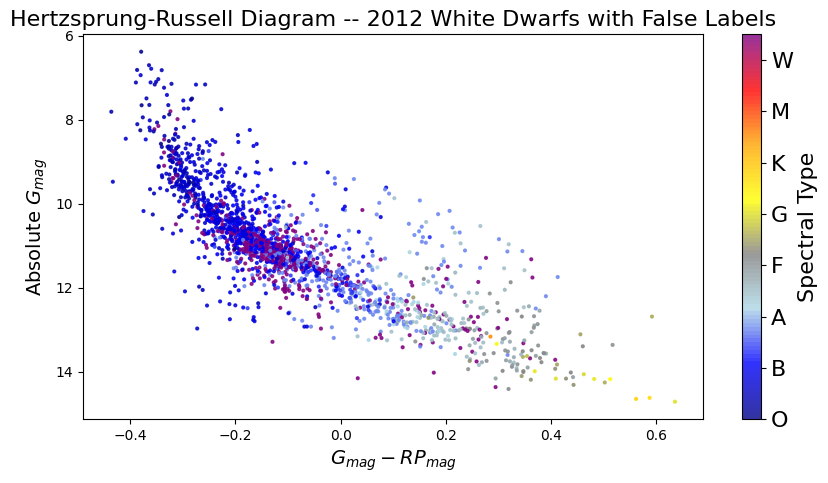

This diagram shows those stars at WD region but both labeled as Main Sequence stars, consistently in my label and SDSS labels
There are 110 of them in total


In [ ]:
df = below_df
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(10, 5))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=4, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram -- 2012 White Dwarfs with False Labels', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=16)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()
print('This diagram shows those stars at WD region but both labeled as Main Sequence stars, consistently in my label and SDSS labels')
print('There are 110 of them in total')

## 828 Nan stars analysis

In [ ]:
chi_square_df_NonBinary_stars = pd.read_csv('/content/drive/MyDrive/AstroResearch/new_data_table/result_compare_CrossMatched_final.csv')
chi_square_df_NonBinary_stars

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511454356,196.624950,0.282299,K3V (32147),K2_+0.0_Dwarf,0.178762,3690722331539752192,18.251686,18.81738,17.570684,7.390470314893085
2,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
3,1237648674511585391,196.968910,0.349134,K3V (32147),K2_-1.0_Dwarf,0.086616,3690715150354025728,17.733078,18.200039,17.069653,6.4879329221865945
4,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
...,...,...,...,...,...,...,...,...,...,...,...
110286,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424
110287,1237680479270797727,10.312414,33.171030,M5III (221615),M4_+0.0_Dwarf,0.111392,361683181726376448,18.761353,20.059868,17.592068,8.44115534494583
110288,1237680479808062003,11.498197,33.439076,M3III (44478),M3_+0.0_Dwarf,0.136130,362031864351985024,19.595724,20.685791,18.463917,9.104377458646093
110289,1237680511482986978,10.149730,33.697313,G1V (95128),G9_-1.0_Dwarf,0.194256,361903015332657536,19.91739,19.716562,18.767694,NaN


In [ ]:
file_names_SchoolEmail = []
with open('file_names_SchoolEmail.txt') as file:
    for line in file:
        file_names_SchoolEmail.append(line.strip())
file_names_Vu = []
with open('file_names_Vu.txt') as file:
    for line in file:
        file_names_Vu.append(line.strip())
file_names_myGmail = []
with open('file_names_myGmail.txt') as file:
    for line in file:
        file_names_myGmail.append(line.strip())
gaia_IDs = file_names_SchoolEmail + file_names_Vu + file_names_myGmail
len(gaia_IDs)

38895

In [ ]:
filtered_stars_df = chi_square_df_NonBinary_stars[chi_square_df_NonBinary_stars['Gaia_ID'].isin(gaia_IDs)]
filtered_stars_df.reset_index(drop=True, inplace=True)
filtered_stars_df

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
2,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
3,1237648674511651057,197.160190,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920101440812
4,1237648674511716425,197.233240,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538025316523
...,...,...,...,...,...,...,...,...,...,...,...
38890,1237680478733795604,9.981226,32.759037,F3/F5V (30743),F7_-2.0_Dwarf,0.045412,361647520613121280,17.45469,17.765306,16.99537,3.7334639332152193
38891,1237678894960017950,12.683144,35.618407,F3/F5V (30743),G3_-2.0_Dwarf,0.051266,363805239167746176,17.415297,17.730392,16.93641,4.859460171912001
38892,1237680478733992121,10.597082,32.668030,F3/F5V (30743),F7_-2.0_Dwarf,0.082424,361585192048323072,16.598083,16.92125,16.109825,5.334753548079526
38893,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424


In [ ]:
filtered_stars_df_dropna = filtered_stars_df.dropna()
filtered_stars_df_dropna.reset_index()
print(filtered_stars_df_dropna.shape)
filtered_stars_df_dropna.head(5)

(38067, 11)


,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.71340,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511585290,196.90046,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
2,1237648674511650951,197.03041,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
3,1237648674511651057,197.16019,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920101440812
4,1237648674511716425,197.23324,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538025316523


In [ ]:
dropped_rows_df = filtered_stars_df[filtered_stars_df.isna().any(axis=1)]
print(dropped_rows_df.shape)
dropped_rows_df.head(5)

(828, 11)


,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
7,1237648674511716461,197.18592,0.219007,G3Ib (58526),K4_-0.5_Dwarf,0.102716,3687708230865871616,16.926546,17.51662,16.196526,NaN
46,1237648720157016088,179.99939,-0.976212,F0IV (81937),F4_-1.5_Dwarf,0.175948,3602746076873913216,17.502274,17.79239,17.065004,NaN
55,1237648702972821519,197.86168,-1.057802,G0 (63791),G6_-1.0_Dwarf,0.033509,3685840882164904960,16.893581,17.305832,16.297852,NaN
72,1237648702973083702,198.46064,-1.110411,G0 (63791),G9_-1.5_Dwarf,0.044276,3686573981542670336,16.87988,17.27177,16.321316,NaN
77,1237648702973214766,198.78952,-1.090365,G0 (63791),K2_-0.5_Dwarf,0.079167,3686565460327574016,17.248655,17.662748,16.66565,NaN


In [ ]:
nan_abs_g_mag_count = dropped_rows_df['abs_g_mag'].isna().sum()
print(f"There are {nan_abs_g_mag_count} rows with NaN in the abs_g_mag column.")

There are 828 rows with NaN in the abs_g_mag column.


In [ ]:
# dropped_rows_df['abs_g_mag'].fillna(0.0, inplace=True)
# dropped_rows_df

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
7,1237648674511716461,197.185920,0.219007,G3Ib (58526),K4_-0.5_Dwarf,0.102716,3687708230865871616,16.926546,17.51662,16.196526,0.0
46,1237648720157016088,179.999390,-0.976212,F0IV (81937),F4_-1.5_Dwarf,0.175948,3602746076873913216,17.502274,17.79239,17.065004,0.0
55,1237648702972821519,197.861680,-1.057802,G0 (63791),G6_-1.0_Dwarf,0.033509,3685840882164904960,16.893581,17.305832,16.297852,0.0
72,1237648702973083702,198.460640,-1.110411,G0 (63791),G9_-1.5_Dwarf,0.044276,3686573981542670336,16.87988,17.27177,16.321316,0.0
77,1237648702973214766,198.789520,-1.090365,G0 (63791),K2_-0.5_Dwarf,0.079167,3686565460327574016,17.248655,17.662748,16.66565,0.0
...,...,...,...,...,...,...,...,...,...,...,...
38722,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,0.0
38743,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,0.0
38823,1237671938726101101,236.993520,59.634117,A1III (225180),F3_+0.0_Dwarf,0.076501,1626221471787922944,17.452667,17.58169,17.21914,0.0
38829,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,0.0


In [ ]:
df = dropped_rows_df

# Assuming 'a' is defined somewhere above this snippet
df.rename(columns={'min_column': 'spectral_type'}, inplace = True)
df['g_mag'] = pd.to_numeric(df['g_mag'], errors='coerce')
df['bp_mag'] = pd.to_numeric(df['bp_mag'], errors='coerce')
df['rp_mag'] = pd.to_numeric(df['rp_mag'], errors='coerce')
df['abs_g_mag'] = pd.to_numeric(df['abs_g_mag'], errors='coerce')


ranges = {
    'O': (-0.39820819815290315, -0.1838010382107333),  # 2std
    'B': (-0.48551150497298157, 0.13080445873020696),  # 2std
    'A': (-0.03631311723995123, 0.7171487019044878),  # 2std
    # 'F': (0.29904482865501986, 0.5643774404921684), # 4std
    'F': (0.3322114051346634, 0.5312108640125248), # 3std
    'G': (0.31604066780869156, 0.6526622937408892), # 3std
    'K': (0.47142171046512227, 1.0158418545111059), # 3std
    'M': (0.5651581919346016, 1.6822862675661623), # 2Std
}
outliers = pd.DataFrame(columns=df.columns) # DataFrame to store the outliers

# Function to filter based on the ranges
def filter_rows(row):
    spectral_type = row['spectral_type'][0]  # Take only the first character
    g_rp_mag = row['g_mag'] - row['rp_mag']
    lower_bound, upper_bound = ranges.get(spectral_type, (float('-inf'), float('inf')))  # Default to keeping the row if the spectral type is not recognized
    if lower_bound <= g_rp_mag <= upper_bound:
        return True
    else:
        global outliers
        outliers = outliers.append(row, ignore_index=True)
        return False

df = df[df.apply(filter_rows, axis=1)]
print('df shape: ', df.shape)  # Print the shape of the filtered DataFrame
print('outlier shape: ', outliers.shape)  # Print the shape of the outliers DataFrame

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'black']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=10, alpha=0.8)
plt.xlabel('G_mag - RP_mag')
plt.ylabel('Abs_G_mag')
plt.title('Hertzsprung-Russell Diagram (Main Sequence) Removed Outliers (35785 Stars - My Label)')
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type')
cbar.set_ticklabels(cbar_labels)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

In [ ]:
df.to_csv("resulting_labels_765.csv", index=False)
df

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
7,1237648674511716461,197.185920,0.219007,G3Ib (58526),K4_-0.5_Dwarf,0.102716,3687708230865871616,16.926546,17.516620,16.196526,NaN,5.4
46,1237648720157016088,179.999390,-0.976212,F0IV (81937),F4_-1.5_Dwarf,0.175948,3602746076873913216,17.502274,17.792390,17.065004,NaN,3.4
55,1237648702972821519,197.861680,-1.057802,G0 (63791),G6_-1.0_Dwarf,0.033509,3685840882164904960,16.893581,17.305832,16.297852,NaN,4.6
72,1237648702973083702,198.460640,-1.110411,G0 (63791),G9_-1.5_Dwarf,0.044276,3686573981542670336,16.879880,17.271770,16.321316,NaN,4.9
77,1237648702973214766,198.789520,-1.090365,G0 (63791),K2_-0.5_Dwarf,0.079167,3686565460327574016,17.248655,17.662748,16.665650,NaN,5.2
...,...,...,...,...,...,...,...,...,...,...,...,...
38719,1237665129621553225,195.920640,35.457801,F3/F5V (30743),F6_-2.0_Dwarf,0.059825,1516237740274203520,17.049353,17.284958,16.595808,NaN,3.6
38722,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,NaN,3.0
38743,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,NaN,3.5
38829,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,NaN,3.5


## Clean Labels

In [ ]:
filtered_stars_df

,ID,ra,dec,subclass,min_column,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag
0,1237648674511454293,196.713400,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.51292,16.661919,16.25875,3.625869199257412
1,1237648674511585290,196.900460,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.85499,2.320363688884221
2,1237648674511650951,197.030410,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.0051,15.66923,6.354422326160792
3,1237648674511651057,197.160190,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920101440812
4,1237648674511716425,197.233240,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538025316523
...,...,...,...,...,...,...,...,...,...,...,...
38890,1237680478733795604,9.981226,32.759037,F3/F5V (30743),F7_-2.0_Dwarf,0.045412,361647520613121280,17.45469,17.765306,16.99537,3.7334639332152193
38891,1237678894960017950,12.683144,35.618407,F3/F5V (30743),G3_-2.0_Dwarf,0.051266,363805239167746176,17.415297,17.730392,16.93641,4.859460171912001
38892,1237680478733992121,10.597082,32.668030,F3/F5V (30743),F7_-2.0_Dwarf,0.082424,361585192048323072,16.598083,16.92125,16.109825,5.334753548079526
38893,1237680478734712949,12.513824,32.577455,F3/F5V (30743),G2_-1.0_Dwarf,0.016860,360982487877093632,16.330702,16.65382,15.831785,4.395150846437424


In [ ]:
main_sequence_35701 = pd.read_csv("resulting_labels_above_withinRange_35701.csv")
Main_sequence_158 = pd.read_csv('resulting_labels_aboveDf_consistent_158.csv')
carbon_13 = pd.read_csv('resulting_labels_CarbonStar_13.csv')

In [ ]:
Main_sequence_182 = pd.read_csv('resulting_labels_main_sequence_182.csv')
new_182 = filtered_stars_df[filtered_stars_df['ID'].isin(Main_sequence_182['Star_ID'])]
new_182 = new_182.reset_index(drop=True)
merged_df = pd.merge(new_182, Main_sequence_182, left_on='ID', right_on='Star_ID')
new_182['min_column'] = merged_df['Spectral_Label'] # Update the 'min_column' in new_146 with values from 'Spectral_Label'
new_182.rename(columns={'min_column': 'spectral_type'}, inplace = True)
new_182['g_mag'] = pd.to_numeric(new_182['g_mag'], errors='coerce')
new_182['bp_mag'] = pd.to_numeric(new_182['bp_mag'], errors='coerce')
new_182['rp_mag'] = pd.to_numeric(new_182['rp_mag'], errors='coerce')
new_182['abs_g_mag'] = pd.to_numeric(new_182['abs_g_mag'], errors='coerce')
new_182

In [ ]:
stacked_df = pd.concat([main_sequence_35701, Main_sequence_158, carbon_13, new_182], ignore_index=True)
stacked_df

In [ ]:
spectral_type_counts = stacked_df['spectral_type'].value_counts()
spectral_type_counts_df = pd.DataFrame({'Spectral_Type': spectral_type_counts.index, 'Count': spectral_type_counts.values})
spectral_type_counts_df

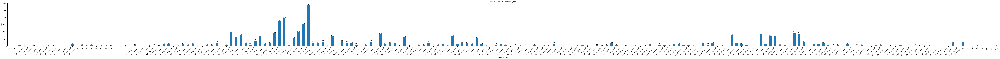

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Calculate value counts for the 'Spectral_Type' column
spectral_type_counts = stacked_df['spectral_type'].value_counts()
# Sort the value counts DataFrame by index (Spectral_Type)
sorted_spectral_type_counts = spectral_type_counts.sort_index()

# Plot a histogram of sorted value counts with labels on bars
plt.figure(figsize=(100, 6))  # Set the figure size
ax = sorted_spectral_type_counts.plot(kind='bar')

plt.title('Value Counts of Spectral Types')
plt.xlabel('Spectral Type')
plt.ylabel('Count')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# Annotate each bar with its value count
for p in ax.patches:
    ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                ha='center', va='bottom', fontsize=9, color='black')

plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

In [ ]:
rows_with_w_spectral_type = stacked_df[stacked_df['spectral_type'].str.startswith('W')]
rows_with_w_spectral_type

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
318,1237648720677896238,143.54096,-0.495609,F3/F5V (30743),WD7,0.244819,3839848788672392448,15.165902,15.424871,14.740658,4.595251,8.0
19017,1237668349751066673,225.44941,13.649017,A9V (154660),WD7,0.199855,1182091582451676800,17.497175,17.532658,17.456224,1.578381,8.0
21871,1237680472831754497,341.65100,29.459503,O8/O9 (167771),WD1,0.095284,1887681389800324736,16.155144,15.992839,16.461956,4.720075,8.0
22425,1237667431174570027,157.18598,25.505094,A9V (154660),WD7,0.401124,727435316684008832,16.188812,16.227257,16.060743,3.827606,8.0
28870,1237655129844810056,257.12169,33.377017,A2II (39866),WD9,0.108653,1334687990907726720,17.324880,17.572409,16.934748,4.013174,8.0


(36054, 12)


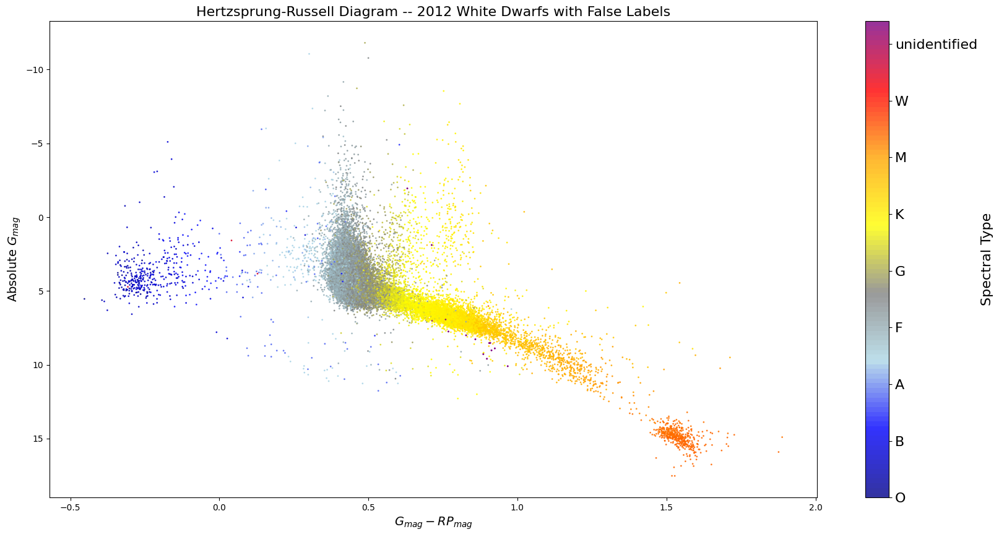

In [ ]:
df = stacked_df
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram -- 2012 White Dwarfs with False Labels', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=16)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

(36054, 12)


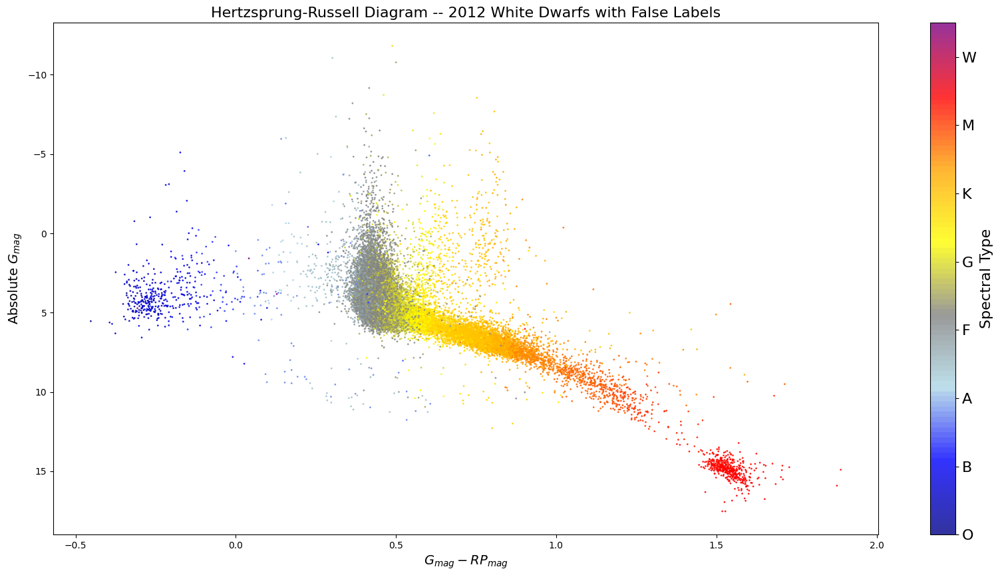

In [ ]:
# revise it so that we don't show unidentified (C stars)
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

df = stacked_df
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Filter out rows with spectral_code for 'unidentified'
df = df[df['spectral_code'] != 8.9]

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram -- 2012 White Dwarfs with False Labels', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=16)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()


In [ ]:
stacked_df.head(10)

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
0,1237648674511454293,196.71340,0.298453,A4V (97603),A8_-1.5_Dwarf,0.041908,3690721128948913152,16.512920,16.661919,16.258750,3.625869,2.8
1,1237648674511585290,196.90046,0.240210,G0 (63791),G7_+0.0_Dwarf,0.067499,3690707522492079360,17.415804,17.841501,16.854990,2.320364,4.7
2,1237648674511650951,197.03041,0.239345,K5Ve (118100),K5_-0.5_Dwarf,0.052272,3690710035048748672,16.414751,17.005100,15.669230,6.354422,5.5
3,1237648674511651057,197.16019,0.248420,G8V (101501),G7_-1.5_Dwarf,0.050742,3690711027185395584,17.591768,18.016539,16.993328,6.250920,4.7
4,1237648674511716425,197.23324,0.257804,G4V (32923),G4_+0.0_Dwarf,0.080536,3687708883700901504,16.669043,17.008976,16.167791,4.119538,4.4
5,1237648674511716434,197.25144,0.382720,F0IV (81937),F6_-1.0_Dwarf,0.052432,3690736006715223936,16.547390,16.793581,16.160069,4.063619,3.6
6,1237648674511716458,197.18088,0.315742,K0IV (191026),G9_-1.0_Dwarf,0.046136,3690711924834377088,17.236042,17.653902,16.662594,5.382580,4.9
7,1237648674511847435,197.47918,0.389937,F8V (G_243-63),G3_-1.0_Dwarf,0.057905,3687740082343357568,17.443388,17.812250,16.916090,6.179281,4.3
8,1237648674511913024,197.71154,0.405891,F8V (G_243-63),G9_-1.0_Dwarf,0.061293,3687726231073701888,16.601929,17.026606,16.008970,-0.112792,4.9
9,1237648674511978616,197.80820,0.291019,G8V (101501),K0_-1.0_Dwarf,0.227493,3687721523789518336,17.558437,18.082342,16.900303,7.119281,5.0


<ipython-input-158-6049c7b2ac33>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['m_star_code'] = df['spectral_type'].apply(m_star_code)


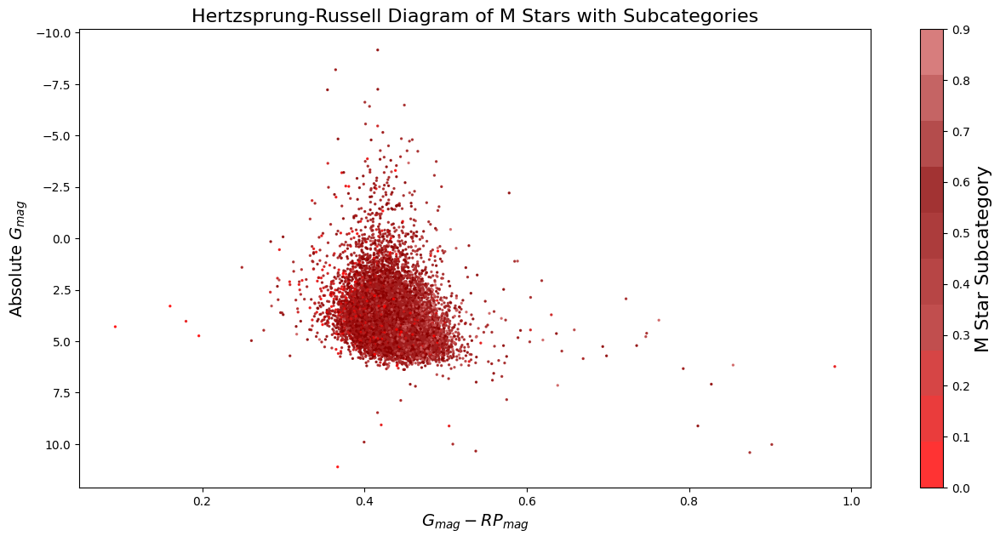

In [ ]:
# Filter the dataframe to only contain M stars
df = stacked_df[stacked_df['spectral_type'].str.startswith('F')]

# Function to get the color code based on M star subcategory
def m_star_code(x):
    if len(x) > 1 and x[1].isdigit():  # Checking if there's a subcategory number
        return int(x[1]) * 0.1
    else:
        return 0  # Defaulting to 0 for broad M type

df['m_star_code'] = df['spectral_type'].apply(m_star_code)

# Define the colors (gradient within 'M' spectral type)
colors = ['red', 'firebrick', 'darkred', 'indianred']
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

plt.figure(figsize=(15, 7))
colormap = LinearSegmentedColormap.from_list("MSubTypes", colors, N=10)
plt.scatter(x_data, y_data, c=df['m_star_code'], cmap=colormap, s=2, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram of M Stars with Subcategories', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar for M subcategories
cbar = plt.colorbar()
cbar.set_label('M Star Subcategory', fontsize=16)
plt.show()

In [ ]:
WD_522 = pd.read_csv("resulting_labels_WD_522.csv")
WD_1397 = pd.read_csv('resulting_labels_WD_1397.csv')

In [ ]:
new_1397 = filtered_stars_df[filtered_stars_df['ID'].isin(WD_1397['Star_ID'])]
new_1397 = new_1397.reset_index(drop=True)
merged_df = pd.merge(new_1397, WD_1397, left_on='ID', right_on='Star_ID')
new_1397['min_column'] = merged_df['Spectral_Label'] # Update the 'min_column' in new_146 with values from 'Spectral_Label'

new_1397.rename(columns={'min_column': 'spectral_type'}, inplace = True)
new_1397['g_mag'] = pd.to_numeric(new_1397['g_mag'], errors='coerce')
new_1397['bp_mag'] = pd.to_numeric(new_1397['bp_mag'], errors='coerce')
new_1397['rp_mag'] = pd.to_numeric(new_1397['rp_mag'], errors='coerce')
new_1397['abs_g_mag'] = pd.to_numeric(new_1397['abs_g_mag'], errors='coerce')
new_1397

In [ ]:
stacked_df_WD = pd.concat([WD_522, new_1397], ignore_index=True)
stacked_df_All = pd.concat([stacked_df_WD, stacked_df_filtered], ignore_index=True)
stacked_df_All.head(10)

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code
0,1237648721781129272,210.865710,0.355465,O8/O9 (167771),WD1,0.085907,3660885434252603392,17.101414,16.938492,17.415588,8.334768,8.0
1,1237645943973675103,44.443335,1.018366,WDhotter,WD5,0.156102,298895364329216,17.783056,17.737020,17.936655,11.777379,8.0
2,1237650805338800150,145.814960,-1.379833,WDhotter,WD5,0.233598,3827817996865666560,16.626810,16.602299,16.728588,11.279416,8.0
3,1237648704058753171,225.786110,-0.231323,WDhotter,WD5,0.104907,4419453968137194496,18.016500,18.019098,18.156054,11.375649,8.0
4,1237650795140546668,133.088570,-0.714811,WDhotter,WD5,0.295114,3074357798298718464,17.155270,17.099050,17.332447,10.919237,8.0
5,1237650796214091936,132.610740,0.044088,WDhotter,WD5,0.126370,3074636765014979328,16.627102,16.551573,16.830217,10.998989,8.0
6,1237648722325733580,228.588660,0.797922,WDhotter,WD4,0.062458,4419865155422033280,15.883505,15.774894,16.110773,9.929653,8.0
7,1237651204232183825,200.186080,0.315256,WDhotter,WD5,0.154500,3687169259714747264,17.284983,17.217577,17.426115,11.607776,8.0
8,1237657632724811861,141.806100,47.949800,WDhotter,WD5,0.157441,825640117568825472,17.573757,17.554413,17.683538,12.038319,8.0
9,1237654602107846737,167.383300,5.204955,WDhotter,WD5,0.167058,3815563733615443840,18.177181,18.159857,18.281730,11.310884,8.0


(37968, 12)


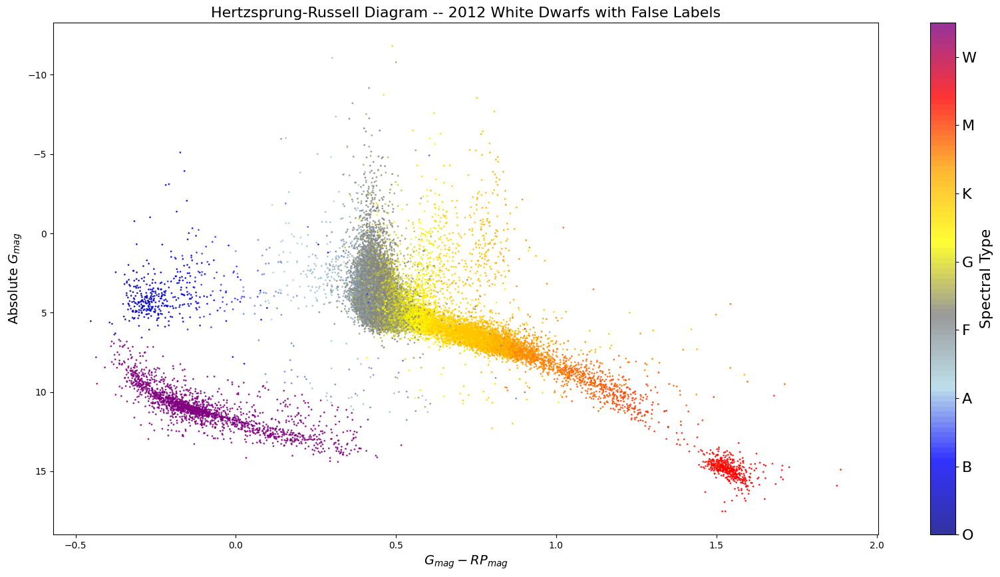

In [ ]:
# revise it so that we don't show unidentified (C stars)
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

df = stacked_df_All
print(df.shape)

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Filter out rows with spectral_code for 'unidentified'
df = df[df['spectral_code'] != 8.9]

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
plt.ylabel('Absolute $G_{mag}$', fontsize=14)
plt.title('Hertzsprung-Russell Diagram -- 2012 White Dwarfs with False Labels', fontsize=16)
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type', fontsize=16)
cbar.set_ticklabels(cbar_labels, fontsize=16)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()


<ipython-input-64-58b93c2779f8>:24: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  outliers = outliers.append(row, ignore_index=True)


df shape:  (37805, 13)
outlier shape:  (163, 13)


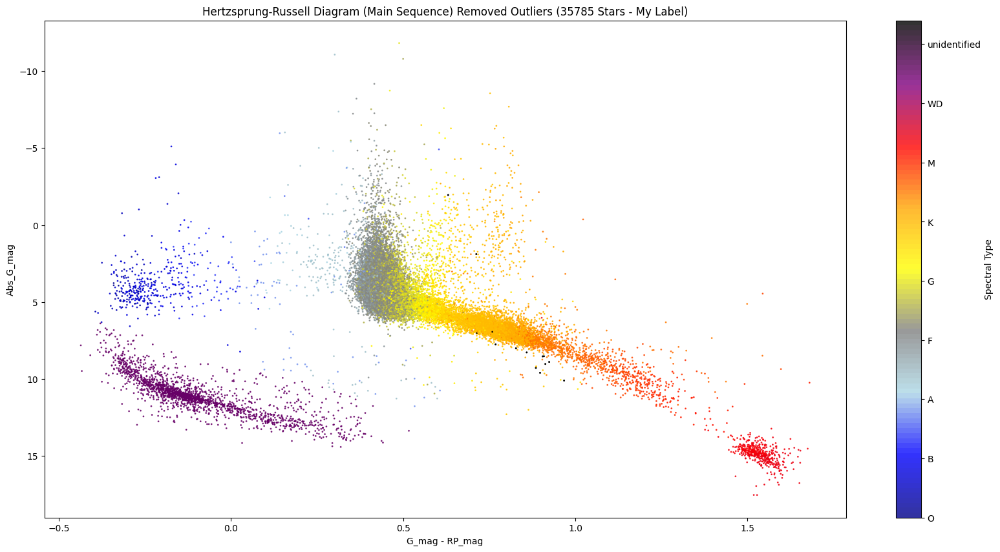

In [ ]:
df = stacked_df_All

ranges = {
    'O': (-0.39820819815290315, -0.1838010382107333),  # 2std
    'B': (-0.48551150497298157, 0.13080445873020696),  # 2std
    'A': (-0.03631311723995123, 0.7171487019044878),  # 2std
    # 'F': (0.29904482865501986, 0.5643774404921684), # 4std
    'F': (0.3322114051346634, 0.5312108640125248), # 3std
    'G': (0.31604066780869156, 0.6526622937408892), # 3std
    'K': (0.47142171046512227, 1.0158418545111059), # 3std
    'M': (0.5651581919346016, 1.6822862675661623), # 2Std
}
outliers = pd.DataFrame(columns=df.columns) # DataFrame to store the outliers

# Function to filter based on the ranges
def filter_rows(row):
    spectral_type = row['spectral_type'][0]  # Take only the first character
    g_rp_mag = row['g_mag'] - row['rp_mag']
    lower_bound, upper_bound = ranges.get(spectral_type, (float('-inf'), float('inf')))  # Default to keeping the row if the spectral type is not recognized
    if lower_bound <= g_rp_mag <= upper_bound:
        return True
    else:
        global outliers
        outliers = outliers.append(row, ignore_index=True)
        return False

df = df[df.apply(filter_rows, axis=1)]
print('df shape: ', df.shape)  # Print the shape of the filtered DataFrame
print('outlier shape: ', outliers.shape)  # Print the shape of the outliers DataFrame

# Create a numeric spectral code for color-coding
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Define colors and spectral types
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'WD']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple', 'black']

df['spectral_code'] = df['spectral_type'].apply(spectral_code)

# Create x and y data
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']

# Plotting
plt.figure(figsize=(20, 10))
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
plt.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=1, alpha=0.8)
plt.xlabel('G_mag - RP_mag')
plt.ylabel('Abs_G_mag')
plt.title('Hertzsprung-Russell Diagram (Main Sequence) Removed Outliers (35785 Stars - My Label)')
plt.gca().invert_yaxis()  # Invert y-axis to match conventional HR diagram

# Adding colorbar
cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
cbar_labels = spectral_classes + ['unidentified']
cbar = plt.colorbar(ticks=cbar_ticks)
cbar.set_label('Spectral Type')
cbar.set_ticklabels(cbar_labels)
# plt.savefig('HR_diagram_102283_Stars_myLabel.pdf', format='pdf')
plt.show()

In [ ]:
outliers

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,spectral_type_clean
0,1237648703510282257,199.23493,-0.672317,F3/F5V (30743),F1_-0.5_Dwarf,0.056,3686707194247514240,16.751253,16.492142,15.771535,6.228918,3.1,F1
1,1237646795985650048,111.06604,-0.818847,K5Ve (118100),K5_-0.5_Dwarf,0.127,3110326190903795456,16.301167,16.726562,15.283936,5.354010,5.5,K5
2,1237648704046956608,198.80624,-0.408323,F3/F5V (30743),F5_-1.5_Dwarf,0.080,3687480936900892544,17.439657,17.815662,16.882803,6.092761,3.5,F5
3,1237648705657241671,198.07197,1.050461,F0V (90277),F1_-0.5_Dwarf,0.028,3690878775723863936,16.923243,17.110468,16.600004,2.041563,3.1,F1
4,1237648705657372703,198.33490,0.875681,F8V (G_243-63),F6_-0.5_Dwarf,0.070,3687864292797522304,16.939562,17.274220,16.407177,4.968241,3.6,F6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
158,1237658493337207260,143.23535,8.036071,Ldwarf,M9,0.063,587844820820234496,17.996070,20.743748,16.291710,14.929144,6.9,M9
159,1237655503497462477,255.76053,35.973427,Ldwarf,M9,0.173,1339277180644102272,19.672651,21.808613,17.987648,15.808304,6.9,M9
160,1237661069247448253,148.07625,11.837848,Ldwarf,M9,0.084,613266186783749376,19.883064,22.072502,18.175486,15.516578,6.9,M9
161,1237662194530517165,197.34747,41.649874,Ldwarf,M9,0.038,1525950241879549056,19.365097,21.329216,17.663666,15.368843,6.9,M9


## Filtering the 98th percentile of smallest reduced chi2 (chi2 threshold choosing)

In [ ]:
stacked_df_All = pd.read_csv("/content/drive/MyDrive/AstroResearch/new_data_table/resulting_labels_All_38720.csv")
stacked_df_All

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,spectral_type_clean
0,1237648721781129272,210.865710,0.355465,O8/O9 (167771),WD1,0.085907,3660885434252603392,17.101414,16.938492,17.415588,8.334768,8.0,WD1
1,1237645943973675103,44.443335,1.018366,WDhotter,WD5,0.156102,298895364329216,17.783056,17.737020,17.936655,11.777379,8.0,WD5
2,1237650805338800150,145.814960,-1.379833,WDhotter,WD5,0.233598,3827817996865666560,16.626810,16.602299,16.728588,11.279416,8.0,WD5
3,1237648704058753171,225.786110,-0.231323,WDhotter,WD5,0.104907,4419453968137194496,18.016500,18.019098,18.156054,11.375649,8.0,WD5
4,1237650795140546668,133.088570,-0.714811,WDhotter,WD5,0.295114,3074357798298718464,17.155270,17.099050,17.332447,10.919237,8.0,WD5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38715,1237665129621553225,195.920640,35.457801,F3/F5V (30743),F6_-2.0_Dwarf,0.059825,1516237740274203520,17.049353,17.284958,16.595808,NaN,3.6,F6
38716,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,NaN,3.0,F0
38717,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,NaN,3.5,F5
38718,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,NaN,3.5,F5


In [ ]:
import numpy as np
percentile_98 = np.percentile(stacked_df_All['min_value'], 98)
print(f"The 98th percentile value for reduced-chi2 is: {percentile_98}")


The 98th percentile value for reduced-chi2 is: 0.33536754098217636


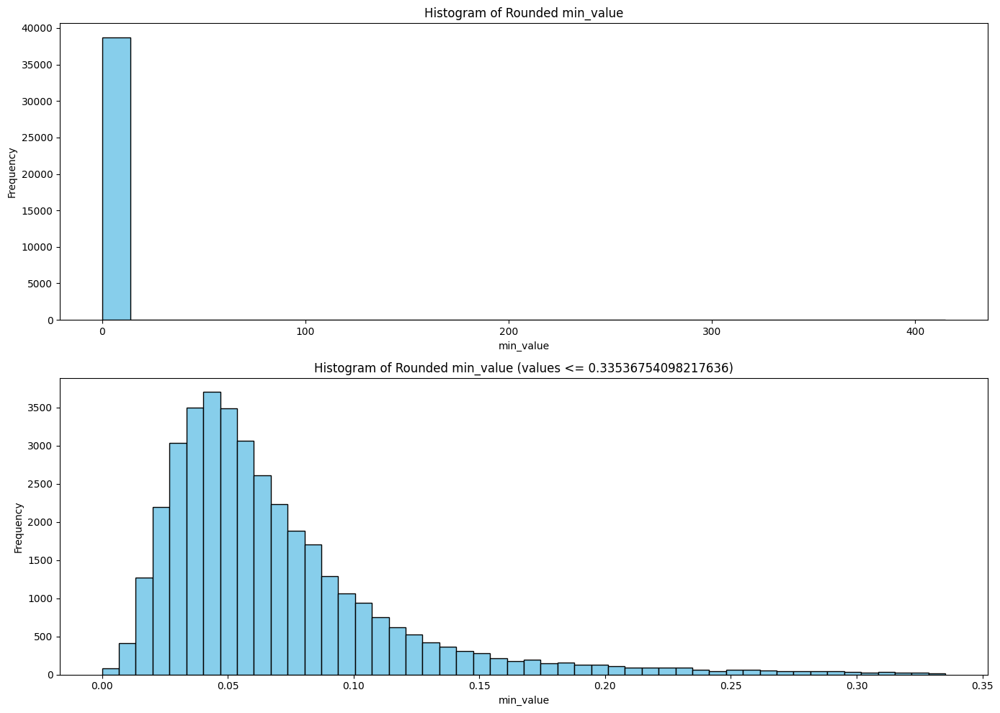

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 1, figsize=(14, 10))

# Histogram 1
axs[0].hist(stacked_df_All['min_value'], bins=30, edgecolor='black', color='skyblue')
axs[0].set_title('Histogram of Rounded min_value')
axs[0].set_xlabel('min_value')
axs[0].set_ylabel('Frequency')

# Histogram 2
threshold = 0.33536754098217636
filtered_values = stacked_df_All[stacked_df_All['min_value'] <= threshold]['min_value']
axs[1].hist(filtered_values, bins=50, edgecolor='black', color='skyblue')
axs[1].set_title(f'Histogram of Rounded min_value (values <= {threshold})')
axs[1].set_xlabel('min_value')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


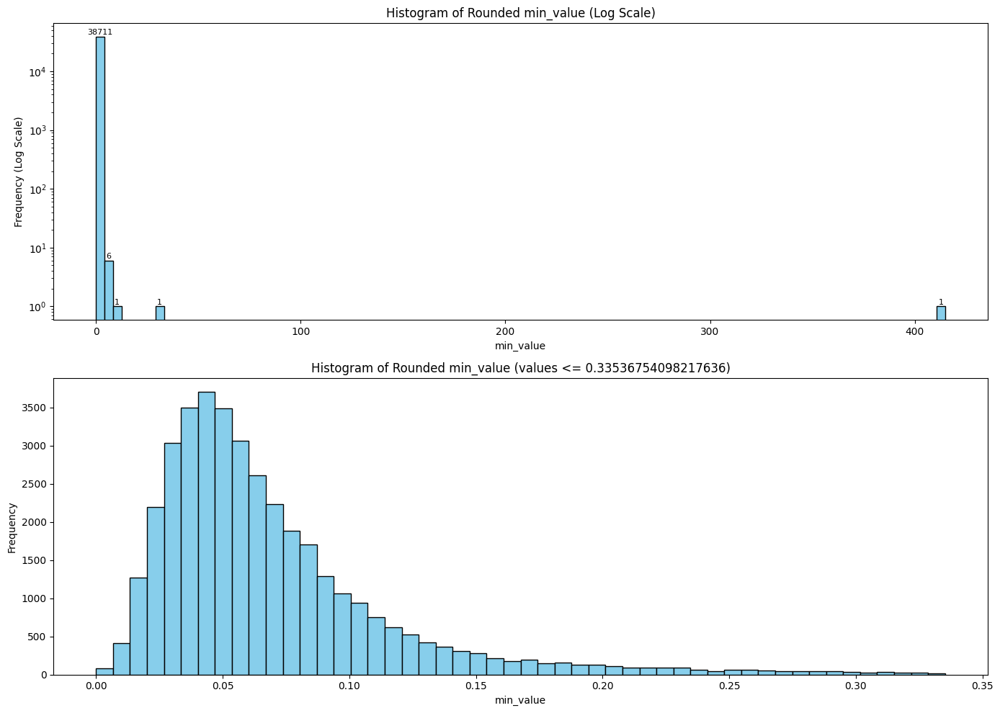

In [ ]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 1, figsize=(14, 10))

# Histogram 1 with log scale
n, bins, patches = axs[0].hist(stacked_df_All['min_value'], bins=100, edgecolor='black', color='skyblue', log=True)
axs[0].set_title('Histogram of Rounded min_value (Log Scale)')
axs[0].set_xlabel('min_value')
axs[0].set_ylabel('Frequency (Log Scale)')

# Annotate the histogram bars with their frequencies
for i in range(len(patches)):
    p = patches[i]
    height = p.get_height()
    if height > 0:  # avoid zero height bars
        axs[0].annotate(f'{int(height)}', (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='center', fontsize=8, color='black',
                    xytext=(0, 4),
                    textcoords='offset points')

# Histogram 2
threshold = 0.33536754098217636
filtered_values = stacked_df_All[stacked_df_All['min_value'] <= threshold]['min_value']
axs[1].hist(filtered_values, bins=50, edgecolor='black', color='skyblue')
axs[1].set_title(f'Histogram of Rounded min_value (values <= {threshold})')
axs[1].set_xlabel('min_value')
axs[1].set_ylabel('Frequency')

plt.tight_layout()
plt.show()


In [ ]:
# Define your threshold value
threshold = 0.33536754098217636

# Filter out rows where 'min_value' is less than or equal to the threshold
filtered_df = stacked_df_All[stacked_df_All['min_value'] <= threshold]
filtered_df
# Now filtered_df contains all the rows where the 'min_value' is less than or equal to the threshold

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,spectral_type_clean
0,1237648721781129272,210.865710,0.355465,O8/O9 (167771),WD1,0.085907,3660885434252603392,17.101414,16.938492,17.415588,8.334768,8.0,WD1
1,1237645943973675103,44.443335,1.018366,WDhotter,WD5,0.156102,298895364329216,17.783056,17.737020,17.936655,11.777379,8.0,WD5
2,1237650805338800150,145.814960,-1.379833,WDhotter,WD5,0.233598,3827817996865666560,16.626810,16.602299,16.728588,11.279416,8.0,WD5
3,1237648704058753171,225.786110,-0.231323,WDhotter,WD5,0.104907,4419453968137194496,18.016500,18.019098,18.156054,11.375649,8.0,WD5
4,1237650795140546668,133.088570,-0.714811,WDhotter,WD5,0.295114,3074357798298718464,17.155270,17.099050,17.332447,10.919237,8.0,WD5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
38728,1237665129621553225,195.920640,35.457801,F3/F5V (30743),F6_-2.0_Dwarf,0.059825,1516237740274203520,17.049353,17.284958,16.595808,NaN,3.6,F6
38729,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,NaN,3.0,F0
38730,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,NaN,3.5,F5
38731,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,NaN,3.5,F5


In [ ]:
filtered_df.to_csv("/content/drive/MyDrive/AstroResearch/new_data_table/resulting_labels_All_37945.csv", index=False)
filtered_df.shape

(37945, 13)

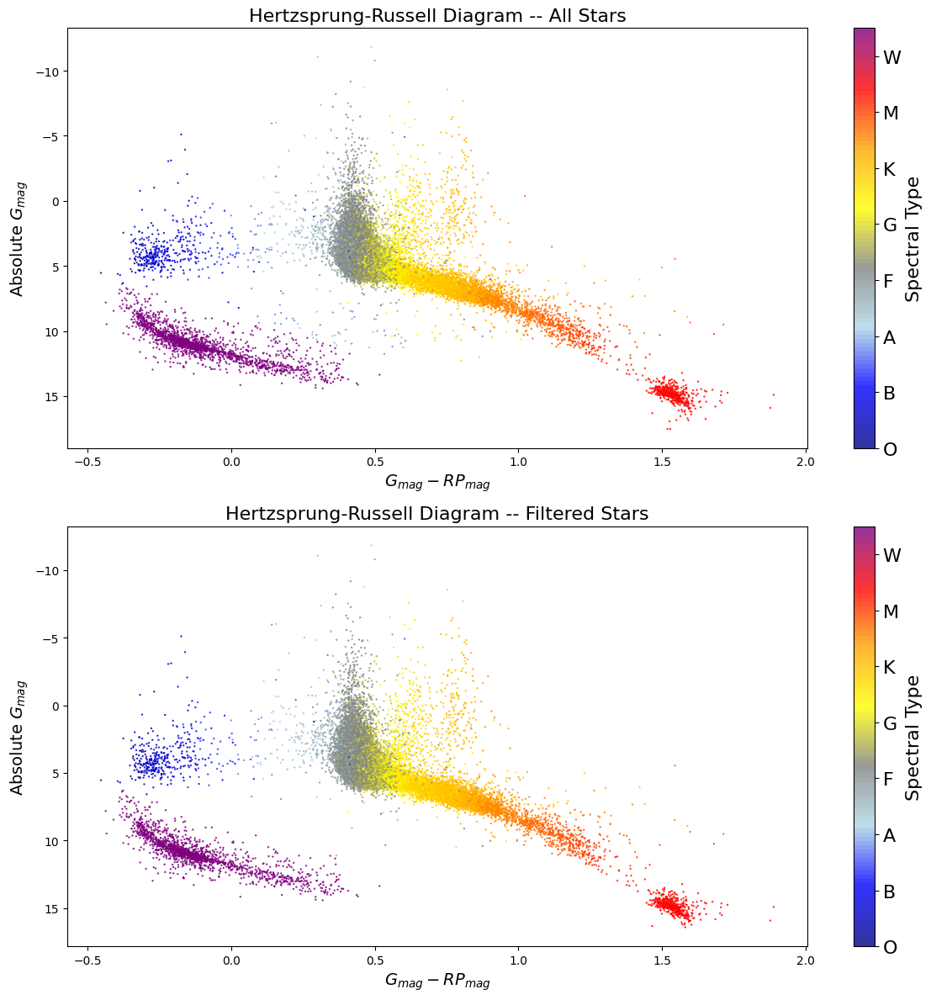

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Define the function and global variables outside the loop to avoid redundancy
def spectral_code(x):
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']

dataframes = [stacked_df_All, filtered_df]
titles = [
    'Hertzsprung-Russell Diagram -- All Stars',
    'Hertzsprung-Russell Diagram -- Filtered Stars'
]

fig, axs = plt.subplots(2, 1, figsize=(12, 12))

for idx, df in enumerate(dataframes):
    df['spectral_code'] = df['spectral_type'].apply(spectral_code)
    df = df[df['spectral_code'] != 8.9]  # Exclude 'unidentified'

    x_data = df['g_mag'] - df['rp_mag']
    y_data = df['abs_g_mag']

    colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
    scatter = axs[idx].scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=0.5, alpha=0.8)

    axs[idx].set_xlabel('$G_{mag} - RP_{mag}$', fontsize=14)
    axs[idx].set_ylabel('Absolute $G_{mag}$', fontsize=14)
    axs[idx].set_title(titles[idx], fontsize=16)
    axs[idx].invert_yaxis()  # Invert y-axis

    # Adding colorbar
    cbar_ticks = [i + 0.5 for i in range(9)]  # Midpoint of each main category
    cbar = fig.colorbar(scatter, ax=axs[idx], ticks=cbar_ticks)
    cbar.set_label('Spectral Type', fontsize=16)
    cbar.set_ticklabels(spectral_classes + ['unidentified'], fontsize=16)

plt.tight_layout()
plt.show()


## Template Making: creating/showing/downloading

In [ ]:
stacked_df_All = pd.read_csv("/content/drive/MyDrive/AstroResearch/new_data_table/resulting_labels_All_37945.csv")
stacked_df_All['Gaia_ID'] = stacked_df_All['Gaia_ID'].astype(str)
stacked_df_All

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,spectral_type_clean
0,1237648721781129272,210.865710,0.355465,O8/O9 (167771),WD1,0.085907,3660885434252603392,17.101414,16.938492,17.415588,8.334768,8.0,WD1
1,1237645943973675103,44.443335,1.018366,WDhotter,WD5,0.156102,298895364329216,17.783056,17.737020,17.936655,11.777379,8.0,WD5
2,1237650805338800150,145.814960,-1.379833,WDhotter,WD5,0.233598,3827817996865666560,16.626810,16.602299,16.728588,11.279416,8.0,WD5
3,1237648704058753171,225.786110,-0.231323,WDhotter,WD5,0.104907,4419453968137194496,18.016500,18.019098,18.156054,11.375649,8.0,WD5
4,1237650795140546668,133.088570,-0.714811,WDhotter,WD5,0.295114,3074357798298718464,17.155270,17.099050,17.332447,10.919237,8.0,WD5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37940,1237665129621553225,195.920640,35.457801,F3/F5V (30743),F6_-2.0_Dwarf,0.059825,1516237740274203520,17.049353,17.284958,16.595808,NaN,3.6,F6
37941,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,NaN,3.0,F0
37942,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,NaN,3.5,F5
37943,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,NaN,3.5,F5


In [ ]:
spectral_type_counts = stacked_df_All['spectral_type_clean'].value_counts()
spectral_type_counts_df = pd.DataFrame({'spectral_type_clean': spectral_type_counts.index, 'Count': spectral_type_counts.values})
spectral_type_counts_df.head(10)

,spectral_type_clean,Count
0,F7,6158
1,F6,5083
2,K5,2653
3,F4,2503
4,K7,2194
5,F8,1492
6,F5,1443
7,G4,1293
8,G0,1268
9,G1,1243


In [ ]:
M6_stars = stacked_df_All[stacked_df_All['spectral_type_clean'].str.startswith('M6')]
M6_stars

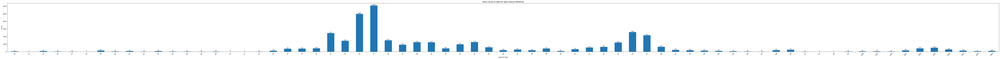

In [ ]:
# # plot not showing metalicity


# import pandas as pd
# import matplotlib.pyplot as plt

# # Assuming 'stacked_df_All' is a DataFrame you've previously defined

# # Extract only the spectral type by splitting at the underscore and taking the first part
# stacked_df_All['only_spectral_type'] = stacked_df_All['spectral_type'].str.split('_').str[0]

# # Calculate value counts for the new 'only_spectral_type' column
# spectral_type_counts = stacked_df_All['only_spectral_type'].value_counts()

# # Sort the value counts DataFrame by index (Spectral_Type)
# sorted_spectral_type_counts = spectral_type_counts.sort_index()

# # Plot a histogram of sorted value counts with labels on bars
# plt.figure(figsize=(100, 6))  # Set the figure size
# ax = sorted_spectral_type_counts.plot(kind='bar')

# plt.title('Value Counts of Spectral Types without Metallicity')
# plt.xlabel('Spectral Type')
# plt.ylabel('Count')
# plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# # Annotate each bar with its value count
# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
#                 ha='center', va='bottom', fontsize=9, color='black')

# plt.tight_layout()  # Adjust layout to prevent clipping of labels
# plt.show()


In [ ]:
# Histogram showing metalicity:

# import pandas as pd
# import matplotlib.pyplot as plt

# # Calculate value counts for the 'Spectral_Type' column
# spectral_type_counts = stacked_df_All['spectral_type'].value_counts()
# # Sort the value counts DataFrame by index (Spectral_Type)
# sorted_spectral_type_counts = spectral_type_counts.sort_index()

# # Plot a histogram of sorted value counts with labels on bars
# plt.figure(figsize=(100, 6))  # Set the figure size
# ax = sorted_spectral_type_counts.plot(kind='bar')

# plt.title('Value Counts of Spectral Types')
# plt.xlabel('Spectral Type')
# plt.ylabel('Count')
# plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
# # Annotate each bar with its value count
# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
#                 ha='center', va='bottom', fontsize=9, color='black')

# plt.tight_layout()  # Adjust layout to prevent clipping of labels
# plt.show()

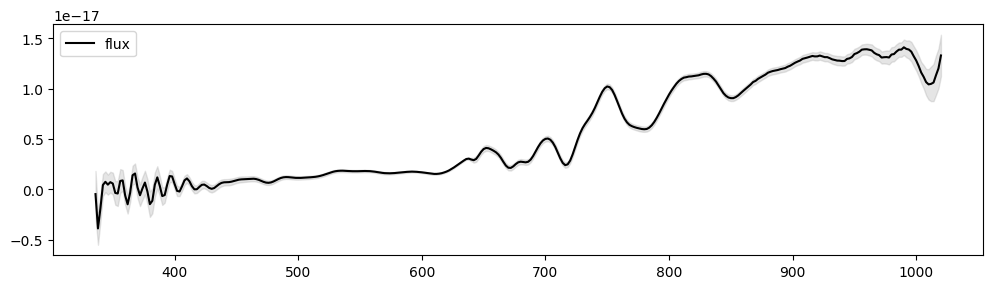

In [ ]:
# plot a single star:
df_testing = pd.read_csv("2536760830667309952.csv")
mean_1 = np.array(df_testing["flux"])
std_1 = np.array(df_testing["flux_error"])
x = df_testing["wavelength"]
plt.figure(figsize=(12, 3))
plt.plot(x, mean_1, '#000000', label='flux')
plt.fill_between(x, mean_1 - std_1, mean_1 + std_1, color='#808080', alpha=0.2)
plt.legend()
plt.show()

# alternate way: plot an abitrary star using Gaiaxpy
# from gaiaxpy import plot_spectra
# query_input = "select * from gaiadr3.gaia_source where source_id = " + str(2536760830667309952)
# calibrated_spectra, sampling = calibrate(query_input)
# plot_spectra(calibrated_spectra, sampling=sampling, legend=False)

In [ ]:
# file counts:
# vu: 20021
# my Gmail: 2798
# my School Email: 16076
# 20021 + 2798 + 16076 - 1 = 38894

In [ ]:
# creating dictionary:

# Directory path to the CSV files
folder_path = "/content/drive/My Drive/AstroResearch/new_data_table/SDSS_gaia_files_8_9"

# List all files in the directory
all_files = os.listdir(folder_path)
# Filter out only the CSV files
csv_files = [f for f in all_files if f.endswith('.csv')]

# Create a dictionary with filenames as keys and dataframes as values
dfs_dict = {os.path.splitext(f)[0]: pd.read_csv(os.path.join(folder_path, f)) for f in csv_files}
len(dfs_dict)

2798

In [ ]:
# creating dictionary:
import os
import pandas as pd

# Mount Google Drive to Google Colab
from google.colab import drive
drive.mount('/content/drive')

# Directory path to the CSV files
folder_path = "/content/drive/My Drive/AstroResearch/new_data_table/SDSS_gaia_files_8_9_Vu"

# List all files in the directory
all_files = os.listdir(folder_path)

# Filter out only the CSV files
csv_files = [f for f in all_files if f.endswith('.csv')]

# Create a dictionary with filenames as keys and dataframes as values
dfs_dict_2 = {os.path.splitext(f)[0]: pd.read_csv(os.path.join(folder_path, f)) for f in csv_files}
len(dfs_dict_2)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


20021

In [ ]:
# creating dictionary:
# Directory path to the CSV files
folder_path = "/content/drive/My Drive/AstroResearch/new_data_table/SDSS_gaia_files_8_9_SchoolEmail"

# List all files in the directory
all_files = os.listdir(folder_path)
# Filter out only the CSV files
csv_files = [f for f in all_files if f.endswith('.csv')]

# # Create a dictionary with filenames as keys and dataframes as values
# dfs_dict_4 = {os.path.splitext(f)[0]: pd.read_csv(os.path.join(folder_path, f)) for f in csv_files}
# len(dfs_dict_4)

# Create a dictionary with filenames as keys and dataframes as values
dfs_dict_4 = {}
for f in csv_files:
    file_path = os.path.join(folder_path, f)
    if os.path.getsize(file_path) > 0:  # Check if file is not empty
        dfs_dict_4[os.path.splitext(f)[0]] = pd.read_csv(file_path)
    else:
        print(f"File {f} is empty or only contains whitespace. Skipping.")
len(dfs_dict_4)

File 1014034532977613056.csv is empty or only contains whitespace. Skipping.


16075

In [ ]:
combined_dict = {}
for d in [dfs_dict, dfs_dict_2, dfs_dict_4]:
    combined_dict.update(d)
print(len(combined_dict))
dfs = list(combined_dict.values())
len(dfs)

38894


38894

In [ ]:
# Create an empty dictionary to store templates for each spectral type
templates_dict = {}

# Iterate over each unique spectral type
for spectral_type in stacked_df_All['spectral_type_clean'].unique():

    # Filter the dataframe to get Gaia IDs for the current spectral type
    ids_for_spectral_type = stacked_df_All[stacked_df_All['spectral_type_clean'] == spectral_type]['Gaia_ID']

    # Retrieve spectral data from combined_dict for these IDs
    spectral_data_list = [combined_dict[gaia_id] for gaia_id in ids_for_spectral_type if gaia_id in combined_dict]

    # Skip if there's no data available for the current spectral type
    if not spectral_data_list:
        continue

    # Create the median template for the current spectral type
    template = create_median_template(spectral_data_list)

    # Store the template in our templates dictionary
    templates_dict[spectral_type] = template

# At this point, templates_dict has the median templates for each spectral type

In [ ]:
len(templates_dict)

69

In [ ]:
templates_dict['A1']

,wavelength,flux,flux_error
0,336.0,7.567520e-18,2.454423e-18
1,338.0,7.534897e-18,1.775256e-18
2,340.0,4.965900e-18,1.442302e-18
3,342.0,3.587676e-18,1.231241e-18
4,344.0,4.569460e-18,1.149306e-18
...,...,...,...
338,1012.0,1.214582e-18,1.132721e-18
339,1014.0,1.079177e-18,1.231978e-18
340,1016.0,1.101565e-18,1.316591e-18
341,1018.0,1.249721e-18,1.322799e-18


In [ ]:
# Save all the files
save_directory = '/content/drive/My Drive/AstroResearch/new_data_table/Final_templates/'

# Iterate through the templates_dict dictionary and save each dataframe as a CSV
for spectral_type, df in templates_dict.items():
    # Create the full path for the CSV file
    # We also replace any special characters in the spectral_type to ensure a valid filename
    file_name = ''.join(e for e in spectral_type if e.isalnum()) + '.csv'
    full_path = os.path.join(save_directory, file_name)

    # Save the dataframe as a CSV
    df.to_csv(full_path, index=False)


In [ ]:
# create one template using the function I wrote:
template_df = create_median_template(dfs)
template_df

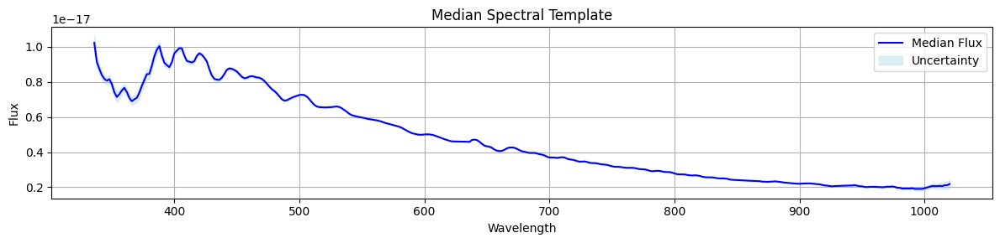

In [ ]:
# plot out the template
import matplotlib.pyplot as plt
template_df = templates_dict['A3']

plt.figure(figsize=(12, 3))
plt.plot(template_df['wavelength'], template_df['flux'], color='blue', label='Median Flux')

# Shading the uncertainty region
plt.fill_between(template_df['wavelength'],
                 template_df['flux'] - template_df['flux_error'],
                 template_df['flux'] + template_df['flux_error'],
                 color='lightblue', alpha=0.4, label='Uncertainty')
plt.xlabel('Wavelength')
plt.ylabel('Flux')
plt.title('Median Spectral Template')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

<ipython-input-193-aea1ddb2e714>:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
<ipython-input-193-aea1ddb2e714>:17: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


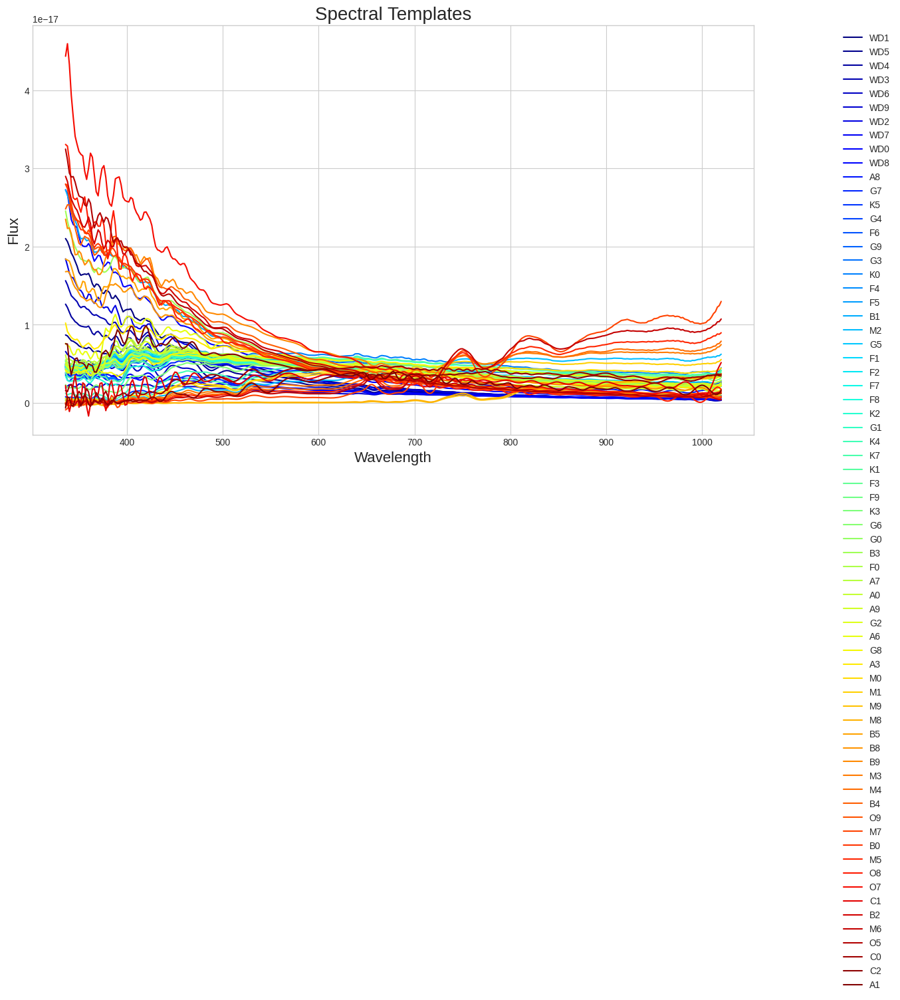

In [ ]:
import matplotlib.pyplot as plt

# Set up plot parameters for a clean, professional look
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')
plt.gca().set_prop_cycle(plt.cycler('color', plt.cm.jet(np.linspace(0, 1, len(templates_dict)))))

# Loop through the templates_dict dictionary and plot each spectrum
for spectral_type, df in templates_dict.items():
    plt.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title('Spectral Templates', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Display the plot
plt.show()


<ipython-input-204-beb586a5de23>:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


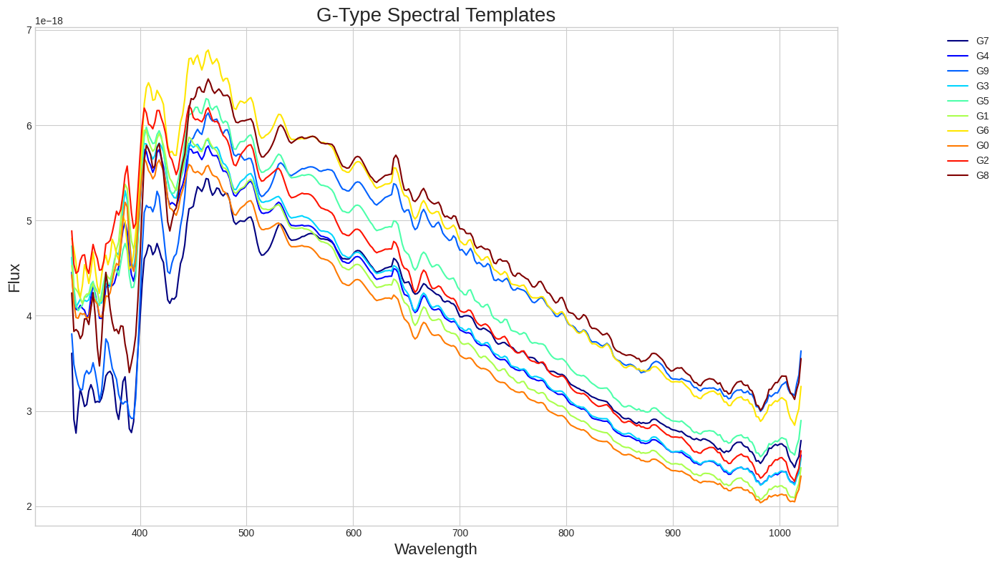

In [ ]:
import matplotlib.pyplot as plt

# Set up plot parameters for a clean, professional look
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')
# Extract only spectral types starting with 'G' for color cycling
g_spectrals = {k: v for k, v in templates_dict.items() if k.startswith('G')}
plt.gca().set_prop_cycle(plt.cycler('color', plt.cm.jet(np.linspace(0, 1, len(g_spectrals)))))

# Loop through the templates_dict dictionary and plot each spectrum of type G
for spectral_type, df in g_spectrals.items():
    plt.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title('G-Type Spectral Templates', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Display the plot
plt.show()


In [ ]:
# Define a helper function to find the closest wavelength to 800 and return the corresponding flux value
def closest_value(df, target_wavelength=800, column='flux'):
    # Find the index of the closest wavelength to the target
    idx = (df['wavelength'] - target_wavelength).abs().idxmin()
    return df.loc[idx, column]

# Dictionary to store normalized templates
normalized_templates_dict = {}

# Normalize all G-type spectral templates
for spectral_type, df in templates_dict.items():
    if spectral_type.startswith('G'):
        # Get the flux and flux_error at the closest wavelength to 800
        flux_at_800 = closest_value(df)

        # Create a copy of the dataframe and normalize its flux and flux_error columns
        normalized_df = df.copy()
        normalized_df['flux'] = df['flux'] / flux_at_800
        normalized_df['flux_error'] = df['flux_error'] / flux_at_800  # Normalize the flux_error

        # Store the normalized dataframe in the new dictionary
        normalized_templates_dict[spectral_type] = normalized_df

# The normalized_templates_dict now contains normalized spectral templates (flux and flux_error) for all G-type stars

<ipython-input-196-cb9f1ebfc42d>:5: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


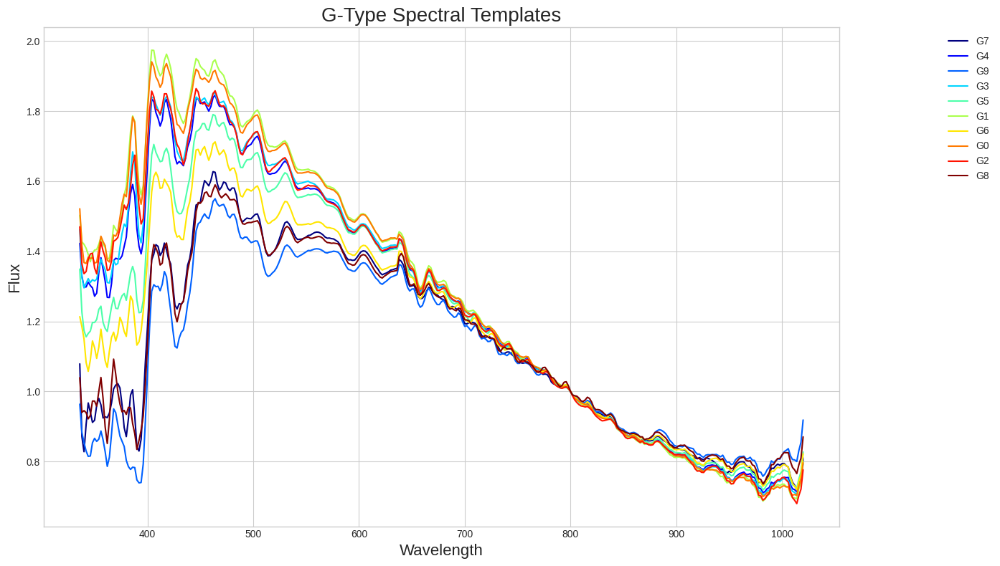

In [ ]:
import matplotlib.pyplot as plt

# Set up plot parameters for a clean, professional look
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')
# Extract only spectral types starting with 'G' for color cycling
g_spectrals = {k: v for k, v in normalized_templates_dict.items() if k.startswith('G')}
plt.gca().set_prop_cycle(plt.cycler('color', plt.cm.jet(np.linspace(0, 1, len(g_spectrals)))))

# Loop through the normalized_templates_dict dictionary and plot each spectrum of type G
for spectral_type, df in g_spectrals.items():
    plt.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title('G-Type Spectral Templates', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Display the plot
plt.show()


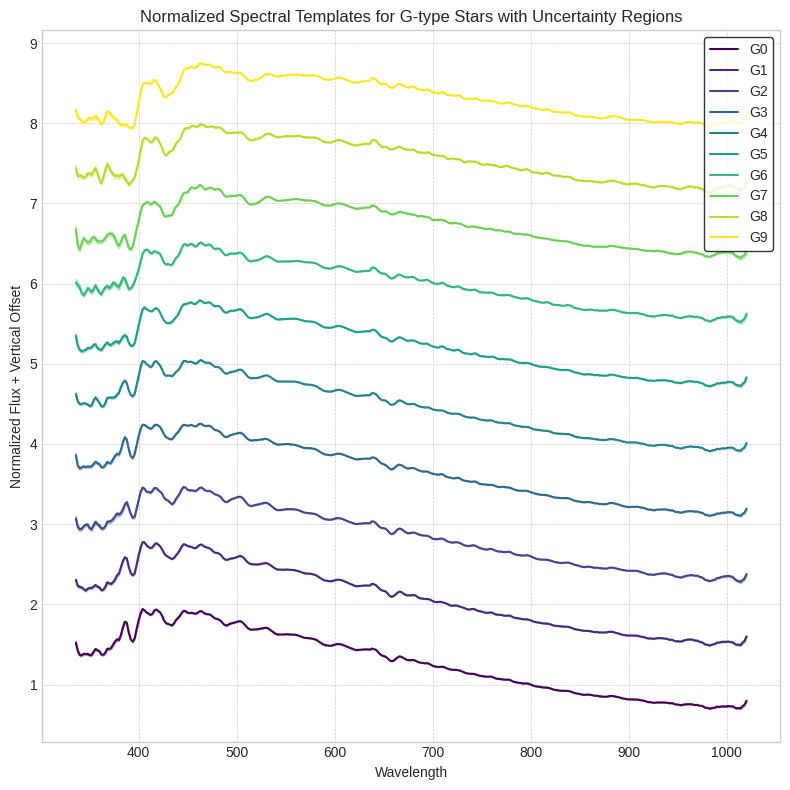

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Define the order
spectral_order = ['G0', 'G1', 'G2', 'G3', 'G4', 'G5', 'G6', 'G7', 'G8', 'G9']
colors = plt.cm.viridis(np.linspace(0, 1, len(spectral_order)))  # Using the viridis colormap

plt.figure(figsize=(8, 8))

# Define the vertical shift constant (can be adjusted for better visualization)
shift_constant = 0.8

for idx, spectral_type in enumerate(spectral_order):
    if spectral_type in normalized_templates_dict:
        # Extract data for ease of use
        wavelengths = normalized_templates_dict[spectral_type]['wavelength']
        fluxes = normalized_templates_dict[spectral_type]['flux']
        flux_errors = normalized_templates_dict[spectral_type]['flux_error']

        # Plot the spectrum
        plt.plot(wavelengths,
                 fluxes + idx * shift_constant,
                 label=spectral_type, color=colors[idx])

        # Shading the uncertainty region
        plt.fill_between(wavelengths,
                         fluxes - flux_errors + idx * shift_constant,
                         fluxes + flux_errors + idx * shift_constant,
                         color=colors[idx], alpha=0.3)  # Using the same color as the curve but with transparency

plt.xlabel('Wavelength')
plt.ylabel('Normalized Flux + Vertical Offset')
plt.title('Normalized Spectral Templates for G-type Stars with Uncertainty Regions')
plt.legend(frameon=True, edgecolor='black')  # Add frame to the legend for better readability
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Make the grid subtler
plt.tight_layout()  # Ensure all elements fit within the figure boundaries
plt.show()

In [ ]:
len(templates_dict)

69

<ipython-input-205-39465a7707a4>:6: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


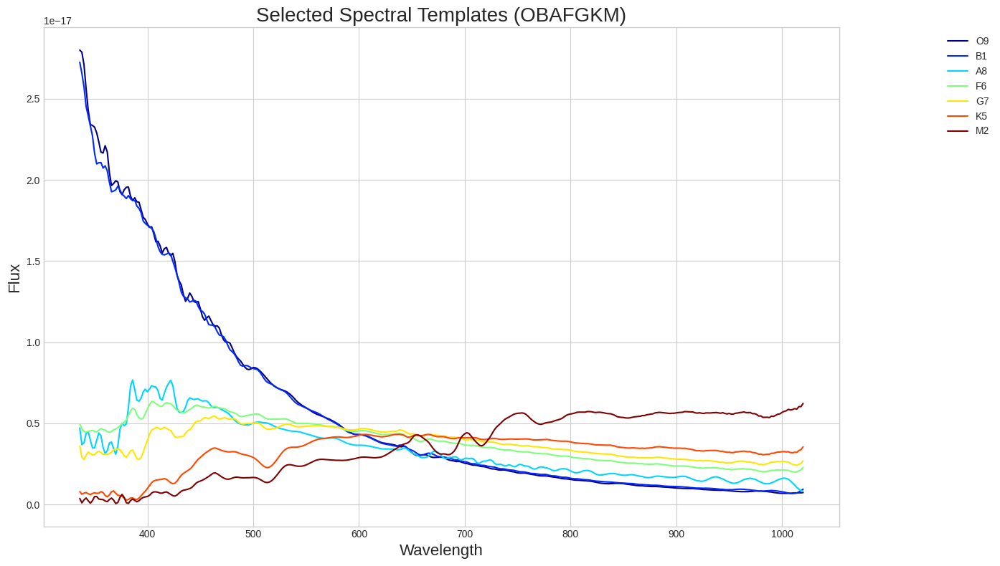

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Set up plot parameters for a clean, professional look
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')

# Extract only one template for each main spectral type (OBAFGKM)
main_spectral_types = ['O', 'B', 'A', 'F', 'G', 'K', 'M']
selected_spectrals = {}
for st in main_spectral_types:
    for k, v in templates_dict.items():
        if k.startswith(st):
            selected_spectrals[k] = v
            break

# Setting the color map to have as many colors as we have templates
plt.gca().set_prop_cycle(plt.cycler('color', plt.cm.jet(np.linspace(0, 1, len(selected_spectrals)))))

# Loop through the selected_spectrals dictionary and plot each spectrum
for spectral_type, df in selected_spectrals.items():
    plt.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Flux', fontsize=16)
plt.title('Selected Spectral Templates (OBAFGKM)', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Display the plot
plt.show()


<ipython-input-208-388547079efa>:16: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


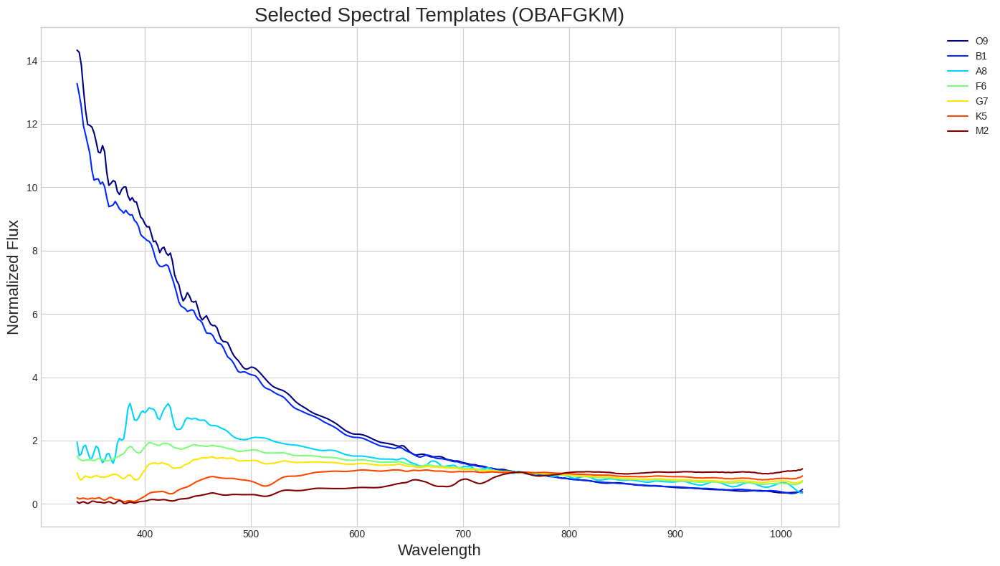

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def normalize_flux_at_wavelength(df, target_wavelength=750):
    """
    Normalize the flux column of the dataframe based on the flux value
    closest to the target wavelength.
    """
    closest_wavelength_idx = (df['wavelength'] - target_wavelength).abs().idxmin()
    normalize_value = df.loc[closest_wavelength_idx, 'flux']
    df['flux'] = df['flux'] / normalize_value
    return df

# Set up plot parameters
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')

# Extract only one template for each main spectral type (OBAFGKM)
main_spectral_types = ['O', 'B', 'A', 'F', 'G', 'K', 'M']
selected_spectrals = {}
for st in main_spectral_types:
    for k, v in templates_dict.items():
        if k.startswith(st):
            selected_spectrals[k] = normalize_flux_at_wavelength(v.copy())
            break

# Setting the color map to have as many colors as we have templates
plt.gca().set_prop_cycle(plt.cycler('color', plt.cm.jet(np.linspace(0, 1, len(selected_spectrals)))))

# Loop through the selected_spectrals dictionary and plot each spectrum
for spectral_type, df in selected_spectrals.items():
    plt.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Normalized Flux', fontsize=16)
plt.title('Selected Spectral Templates (OBAFGKM)', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.tight_layout()

# Display the plot
plt.show()



<ipython-input-216-33cd9e4a56b5>:16: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


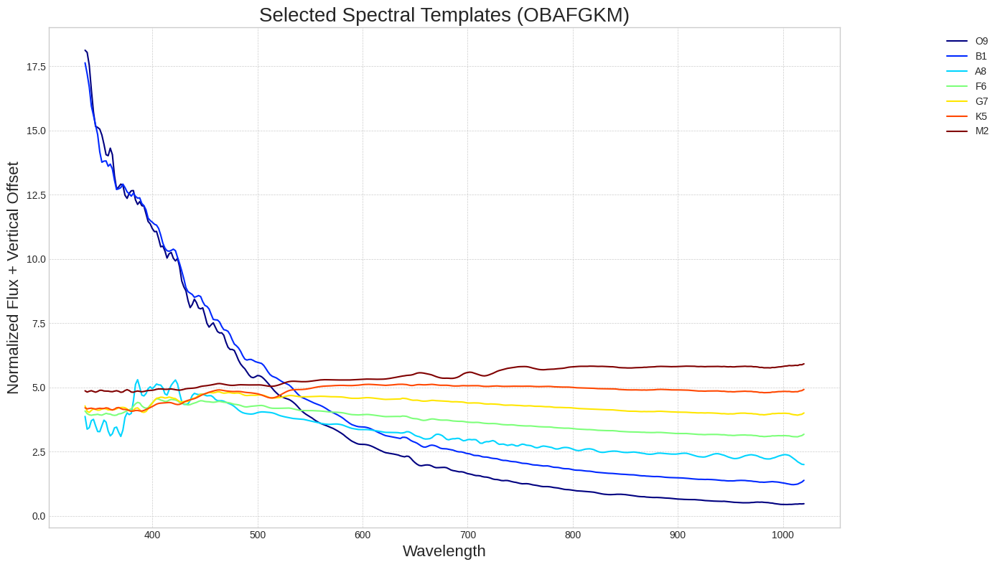

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def normalize_flux_at_wavelength(df, target_wavelength=800):
    """
    Normalize the flux column of the dataframe based on the flux value
    closest to the target wavelength.
    """
    closest_wavelength_idx = (df['wavelength'] - target_wavelength).abs().idxmin()
    normalize_value = df.loc[closest_wavelength_idx, 'flux']
    df['flux'] = df['flux'] / normalize_value
    return df

# Set up plot parameters
plt.figure(figsize=(14, 8))
plt.style.use('seaborn-whitegrid')

# Extract only one template for each main spectral type (OBAFGKM)
main_spectral_types = ['O', 'B', 'A', 'F', 'G', 'K', 'M']
selected_spectrals = {}
for st in main_spectral_types:
    for k, v in templates_dict.items():
        if k.startswith(st):
            selected_spectrals[k] = normalize_flux_at_wavelength(v.copy())
            break

# Setting the color map to have as many colors as we have templates
colors = plt.cm.jet(np.linspace(0, 1, len(selected_spectrals)))

# Define the vertical shift constant (can be adjusted for better visualization)
shift_constant = 0.8

# Loop through the selected_spectrals dictionary and plot each spectrum
for idx, (spectral_type, df) in enumerate(selected_spectrals.items()):
    plt.plot(df['wavelength'], df['flux'] + idx * shift_constant, label=spectral_type, color=colors[idx], lw=1.5)

# Setting labels, title, and legend
plt.xlabel('Wavelength', fontsize=16)
plt.ylabel('Normalized Flux + Vertical Offset', fontsize=16)
plt.title('Selected Spectral Templates (OBAFGKM)', fontsize=20)
plt.legend(fontsize=10, loc='upper right', bbox_to_anchor=(1.2, 1))
plt.grid(True, which='both', linestyle='--', linewidth=0.5)  # Add a subtle grid
plt.tight_layout()

# Display the plot
plt.show()


<ipython-input-281-8344960660cb>:21: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')


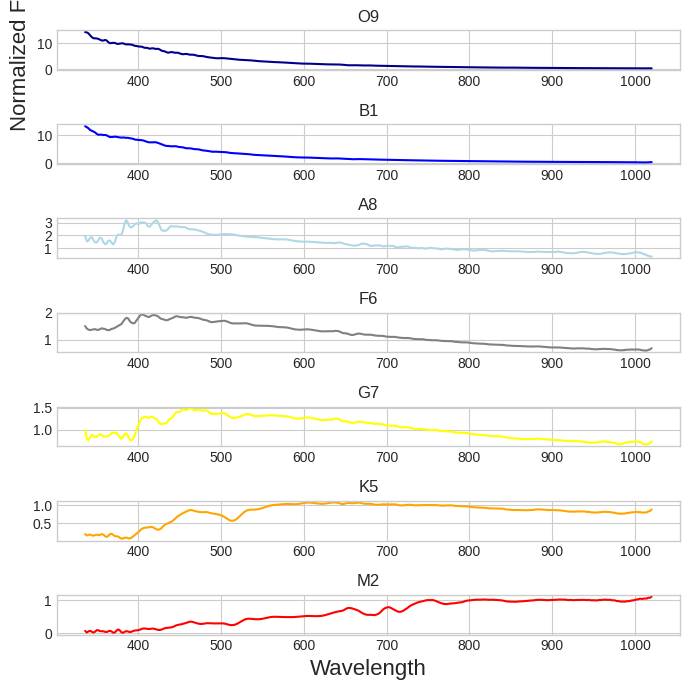

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def normalize_flux_at_wavelength(df, target_wavelength=750):
    """
    Normalize the flux column of the dataframe based on the flux value
    closest to the target wavelength.
    """
    closest_wavelength_idx = (df['wavelength'] - target_wavelength).abs().idxmin()
    normalize_value = df.loc[closest_wavelength_idx, 'flux']
    df['flux'] = df['flux'] / normalize_value
    return df

# Define the spectral classes and their corresponding colors
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['darkblue', 'blue', 'lightblue', 'grey', 'yellow', 'orange', 'red', 'purple']
color_map = dict(zip(spectral_classes, colors))

# Set up the figure and subplots
fig, axs = plt.subplots(len(main_spectral_types), 1, figsize=(7, 1 * len(main_spectral_types)))
plt.style.use('seaborn-whitegrid')

# Extract only one template for each main spectral type (OBAFGKM)
main_spectral_types = ['O', 'B', 'A', 'F', 'G', 'K', 'M']
selected_spectrals = {}
for st in main_spectral_types:
    for k, v in templates_dict.items():
        if k.startswith(st):
            selected_spectrals[k] = normalize_flux_at_wavelength(v.copy())
            break

# Loop through the selected_spectrals dictionary and plot each spectrum on its own subplot
for ax, (spectral_type, df) in zip(axs, selected_spectrals.items()):
    color = color_map[spectral_type[0]]  # Get the first character of the spectral type to match the color
    ax.plot(df['wavelength'], df['flux'], label=spectral_type, lw=1.5, color=color)
    ax.set_title(spectral_type)

# Set the xlabel for the last subplot and ylabel for the first
axs[-1].set_xlabel('Wavelength', fontsize=16)
axs[0].set_ylabel('Normalized Flux', fontsize=16)

plt.tight_layout()
plt.show()


In [ ]:
stacked_df_All

,ID,ra,dec,subclass,spectral_type,min_value,Gaia_ID,g_mag,bp_mag,rp_mag,abs_g_mag,spectral_code,spectral_type_clean
0,1237648721781129272,210.865710,0.355465,O8/O9 (167771),WD1,0.085907,3660885434252603392,17.101414,16.938492,17.415588,8.334768,8.0,WD1
1,1237645943973675103,44.443335,1.018366,WDhotter,WD5,0.156102,298895364329216,17.783056,17.737020,17.936655,11.777379,8.0,WD5
2,1237650805338800150,145.814960,-1.379833,WDhotter,WD5,0.233598,3827817996865666560,16.626810,16.602299,16.728588,11.279416,8.0,WD5
3,1237648704058753171,225.786110,-0.231323,WDhotter,WD5,0.104907,4419453968137194496,18.016500,18.019098,18.156054,11.375649,8.0,WD5
4,1237650795140546668,133.088570,-0.714811,WDhotter,WD5,0.295114,3074357798298718464,17.155270,17.099050,17.332447,10.919237,8.0,WD5
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37940,1237665129621553225,195.920640,35.457801,F3/F5V (30743),F6_-2.0_Dwarf,0.059825,1516237740274203520,17.049353,17.284958,16.595808,NaN,3.6,F6
37941,1237665226771398716,192.659590,32.207828,F0II (25291),F0_-1.5_Dwarf,0.119707,1513879734508779904,17.084654,17.291424,16.663301,NaN,3.0,F0
37942,1237665582175486019,240.458320,59.224544,F0IV (81937),F5_-0.5_Dwarf,0.122587,1626372246615640448,17.524723,17.739641,17.151176,NaN,3.5,F5
37943,1237673808120578229,126.904000,20.935876,F2V (33256),F5_-0.5_Dwarf,0.093566,663962400199786496,16.858734,17.130196,16.365084,NaN,3.5,F5


In [ ]:
import matplotlib.font_manager
fonts = set([f.name for f in matplotlib.font_manager.fontManager.ttflist])
for font in sorted(fonts):
    print(font)


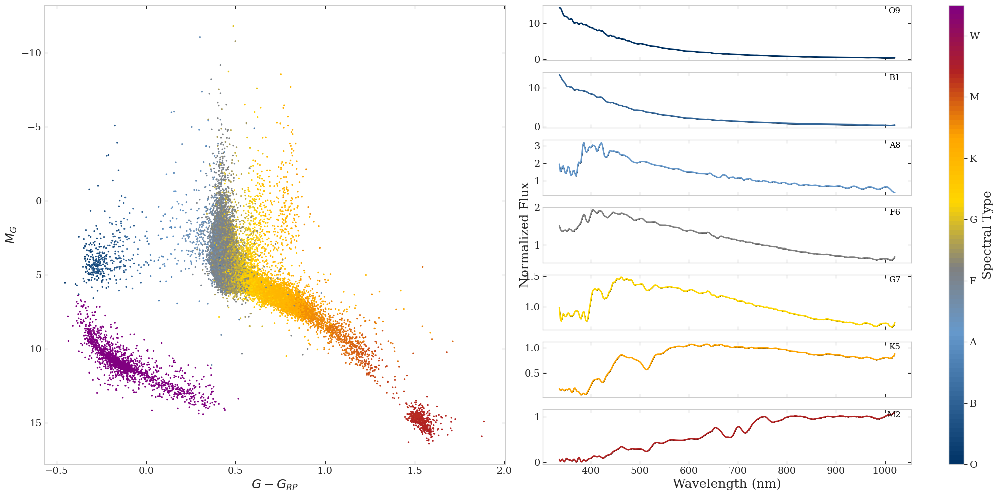

In [ ]:
import matplotlib.pyplot as plt
plt.rcParams["font.family"] = "DejaVu Serif"
import matplotlib.gridspec as gridspec
import numpy as np

stacked_df_All.rename(columns={'min_column': 'spectral_type'}, inplace = True)
stacked_df_All['g_mag'] = pd.to_numeric(stacked_df_All['g_mag'], errors='coerce')
stacked_df_All['bp_mag'] = pd.to_numeric(stacked_df_All['bp_mag'], errors='coerce')
stacked_df_All['rp_mag'] = pd.to_numeric(stacked_df_All['rp_mag'], errors='coerce')
stacked_df_All['abs_g_mag'] = pd.to_numeric(stacked_df_All['abs_g_mag'], errors='coerce')

df = stacked_df_All

def spectral_code(x):  # Spectral Code function
    if x[:2] in ['WD']:
        return 8  # Code for WD types
    elif x[0] in spectral_classes:
        return spectral_classes.index(x[0]) + int(x[1]) * 0.1
    else:
        return 8.9  # Code for 'unidentified'

# Spectral Classes and Colors
spectral_classes = ['O', 'B', 'A', 'F', 'G', 'K', 'M', 'W']
colors = ['#003366',  # dark navy
          '#336699',  # steel blue
          '#6699CC',  # light steel blue
          '#808080',  # grey
          '#FFD700',  # goldenrod (substituted for yellow)
          '#FFA500',  # slightly muted orange
          '#B22222',  # firebrick (substituted for red)
          '#800080']  # dark magenta (for purple)
color_map = dict(zip(spectral_classes, colors))

# Create the figure using gridspec
fig = plt.figure(figsize=(20, 10))
gs = gridspec.GridSpec(len(main_spectral_types), 3, width_ratios=[2.5, 2, 0.08])  # 2.5: The width of the HR diagram; 2: The width of the spectral plots;  0.05: The width of the color bar.

# Plot HR diagram on the left
hr_ax = plt.subplot(gs[:, 0])
hr_ax.grid(False) # <-- remove background grid for HR diagram
hr_ax.tick_params(direction='in', which='both', top=True, right=True, length=5, labelsize=14)  # Set tick length

df['spectral_code'] = df['spectral_type'].apply(spectral_code)
df = df[df['spectral_code'] != 8.9]
x_data = df['g_mag'] - df['rp_mag']
y_data = df['abs_g_mag']
colormap = LinearSegmentedColormap.from_list("SpectralTypes", colors, N=100)
hr_points = hr_ax.scatter(x_data, y_data, c=df['spectral_code'], cmap=colormap, s=2, alpha=1)  # size of scatter plots
hr_ax.set_xlabel('$G - G_{RP}$', fontsize=18)
hr_ax.set_ylabel('$M_{G}$', fontsize=18)
hr_ax.invert_yaxis()

# Plot each spectra on separate subplots to the right of HR diagram
main_spectral_types = ['O', 'B', 'A', 'F', 'G', 'K', 'M']
selected_spectrals = {}
for st in main_spectral_types:
    for k, v in templates_dict.items():
        if k.startswith(st):
            selected_spectrals[k] = normalize_flux_at_wavelength(v.copy())
            break

for i, (spectral_type, df) in enumerate(selected_spectrals.items()):
    ax = plt.subplot(gs[i, 1])
    ax.tick_params(direction='in', which='both', top=True, right=True, length=5, labelsize=14)  # Set tick label size
    ax.grid(False)  # <-- remove background grid for each spectral subplot
    color = color_map[spectral_type[0]]  # Get the first character of the spectral type to match the color
    # Plot the shaded region of uncertainty
    ax.fill_between(df['wavelength'], df['flux'] - df['flux_error'], df['flux'] + df['flux_error'], color='black', alpha=1)  # alpha: sets transparency of the shaded region
    # Plot the main spectra curve
    ax.plot(df['wavelength'], df['flux'], lw=2, color=color)  # lw: change the thickness of lines
    ax.text(0.97, 0.9, spectral_type, transform=ax.transAxes, verticalalignment='center', horizontalalignment='right', fontsize=12, color="black")  # color = color or color = black

    # Hide x-axis tick labels for all subplots except the last one
    if i != len(main_spectral_types) - 1:
        ax.tick_params(axis='x', which='both', labelbottom=False)
    else:
        ax.set_xlabel('Wavelength (nm)', fontsize=18)
    if i == 3:
        ax.set_ylabel('Normalized Flux', fontsize=18)

# Colorbar on the rightmost side
cbar_ticks = [i + 0.5 for i in range(9)]
cbar_labels = spectral_classes + ['unidentified']
cbar_ax = plt.subplot(gs[:, 2])
cbar = plt.colorbar(mappable=hr_points, cax=cbar_ax, ticks=cbar_ticks, orientation='vertical')
cbar.set_label('Spectral Type', fontsize=18)
cbar.set_ticklabels(cbar_labels, fontsize=14)
cbar_ax.tick_params(direction='out', size=5)
# fig.suptitle('Hertzsprung-Russell Diagram and Spectral Templates', fontsize=20, y=1.02)
plt.tight_layout()
plt.savefig("HR_Templates_final.pdf")
plt.show()


# add WD to the right
# reverse the order of the spectral type